<a href="https://colab.research.google.com/github/SreeTetali/Real-Time-Biomechanical-Analysis-Engine/blob/main/Final_Project_Working.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opencv-python numpy matplotlib mediapipe google-colab fastdtw scipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 10.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.1/36.1 MB 59.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 71.7 MB/s eta 0:00:00
  Created wheel for fastdtw: filename=fastdtw-0.3.4-cp310-cp310-linux_x86_64.whl size=512544 sha256=60f21add91688583d4b356683e27dac4c29816da4abf3c3dd8b30e917023cbbc
  Stored in directory: /root/.cache/pip/wheels/73/c8/f7/c25448dab74c3acf4848bc25d513c736bb93910277e1528ef4
Successfully built fastdtw


In [ ]:
!pip install fastdtw scipy matplotlib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import os
from tqdm import tqdm
from glob import glob


In [ ]:
from fastdtw import fastdtw
from scipy.spatial.distance import cosine
from dataclasses import dataclass
from typing import List, Tuple, Optional
import matplotlib.pyplot as plt

In [ ]:
@dataclass
class ProcessedSequence:
    """Container for processed video sequence data"""
    frames: np.ndarray  # Original video frames
    landmarks: np.ndarray  # Extracted pose landmarks
    timestamps: np.ndarray  # Frame timestamps
    confidence_scores: np.ndarray  # Landmark confidence scores

In [ ]:
class DeadliftProcessor:
    def __init__(self, confidence_threshold: float = 0.3):
        self.mp_pose = mp.solutions.pose
        self.pose = self.mp_pose.Pose(
            static_image_mode=False,
            min_detection_confidence=0.7,
            model_complexity=1
        )
        self.confidence_threshold = confidence_threshold

        # Key points particularly important for deadlift form
        self.KEY_POINTS = [
            self.mp_pose.PoseLandmark.LEFT_SHOULDER,
            self.mp_pose.PoseLandmark.RIGHT_SHOULDER,
            self.mp_pose.PoseLandmark.LEFT_HIP,
            self.mp_pose.PoseLandmark.RIGHT_HIP,
            self.mp_pose.PoseLandmark.LEFT_KNEE,
            self.mp_pose.PoseLandmark.RIGHT_KNEE,
            self.mp_pose.PoseLandmark.LEFT_ANKLE,
            self.mp_pose.PoseLandmark.RIGHT_ANKLE
        ]

    def align_sequences(self, seq1: ProcessedSequence, seq2: ProcessedSequence) -> Tuple[ProcessedSequence, ProcessedSequence]:
      # Compute DTW path
      # Use only landmarks for computing the warping path
      distance_matrix = np.zeros((len(seq1.landmarks), len(seq2.landmarks)))
      for i in range(len(seq1.landmarks)):
          for j in range(len(seq2.landmarks)):
              distance_matrix[i, j] = np.linalg.norm(seq1.landmarks[i] - seq2.landmarks[j])

      _, path = fastdtw(seq1.landmarks, seq2.landmarks, dist=lambda x, y: np.linalg.norm(x - y))
      path = np.array(path)

      # Create aligned sequences using the DTW path
      aligned_seq1 = ProcessedSequence(
          frames=seq1.frames[path[:, 0]],
          landmarks=seq1.landmarks[path[:, 0]],
          timestamps=seq1.timestamps[path[:, 0]],
          confidence_scores=seq1.confidence_scores[path[:, 0]]
      )

      aligned_seq2 = ProcessedSequence(
          frames=seq2.frames[path[:, 1]],
          landmarks=seq2.landmarks[path[:, 1]],
          timestamps=seq2.timestamps[path[:, 1]],
          confidence_scores=seq2.confidence_scores[path[:, 1]]
      )

      return aligned_seq1, aligned_seq2

    def compute_similarity(self, seq1: ProcessedSequence, seq2: ProcessedSequence) -> Tuple[float, np.ndarray, Tuple[ProcessedSequence, ProcessedSequence]]:
        """
        Compute weighted similarity between two sequences of different lengths.

        Args:
            seq1, seq2: ProcessedSequences to compare
        Returns:
            Tuple containing:
            - Overall similarity score
            - Array of frame-by-frame similarities
            - Tuple of aligned sequences for visualization
        """
        # First align the sequences
        aligned_seq1, aligned_seq2 = self.align_sequences(seq1, seq2)

        frame_similarities = []
        for i in range(len(aligned_seq1.landmarks)):
            # Combine confidence scores
            weights = aligned_seq1.confidence_scores[i] * aligned_seq2.confidence_scores[i]
            weights = weights / (np.sum(weights) + 1e-6)  # Add small epsilon to avoid division by zero

            # Weight the landmarks
            weighted_landmarks1 = aligned_seq1.landmarks[i] * np.repeat(weights, 3)
            weighted_landmarks2 = aligned_seq2.landmarks[i] * np.repeat(weights, 3)

            # Compute similarity
            sim = 1 - cosine(weighted_landmarks1, weighted_landmarks2)
            frame_similarities.append(sim)

        return (
            np.mean(frame_similarities),
            np.array(frame_similarities),
            (aligned_seq1, aligned_seq2)
        )

    def process_video(self, video_path: str) -> Optional[ProcessedSequence]:
        """
        Process a video file and extract pose sequences with timing information.

        Args:
            video_path: Path to video file
        Returns:
            ProcessedSequence or None if processing fails
        """
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            raise ValueError(f"Could not open video file: {video_path}")

        frames = []
        landmarks = []
        timestamps = []
        confidence_scores = []

        frame_count = 0
        fps = cap.get(cv2.CAP_PROP_FPS)

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            # Calculate timestamp in milliseconds
            timestamp = (frame_count / fps) * 1000
            frame_count += 1

            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = self.pose.process(frame_rgb)

            if results.pose_landmarks:
                frame_landmarks = self._extract_keypoints(results.pose_landmarks)
                frame_confidence = self._get_confidence_scores(results.pose_landmarks)

                if np.mean(frame_confidence) > self.confidence_threshold:
                    frames.append(frame)
                    landmarks.append(frame_landmarks)
                    timestamps.append(timestamp)
                    confidence_scores.append(frame_confidence)

        cap.release()

        if not landmarks:
            return None

        return ProcessedSequence(
            frames=np.array(frames),
            landmarks=np.array(landmarks),
            timestamps=np.array(timestamps),
            confidence_scores=np.array(confidence_scores)
        )

    # Example usage
    def analyze_videos(self, reference_path: str, user_path: str) -> dict:
        """
        Analyze two videos and return comparison results.

        Args:
            reference_path: Path to reference video
            user_path: Path to user video
        Returns:
            Dictionary containing analysis results
        """
        # Process both videos
        reference_seq = self.process_video(reference_path)
        user_seq = self.process_video(user_path)

        if reference_seq is None or user_seq is None:
            raise ValueError("Failed to process one or both videos")

        # Compute similarity and get aligned sequences
        overall_similarity, frame_similarities, (aligned_ref, aligned_user) = self.compute_similarity(
            reference_seq, user_seq
        )

        # Generate visualizations using aligned sequences
        visualizations = self.visualize_comparison(
            aligned_ref,
            aligned_user,
            frame_similarities
        )

        return {
        'overall_similarity': overall_similarity,
        'frame_similarities': frame_similarities,
        'visualizations': visualizations,
        'aligned_sequences': (aligned_ref, aligned_user)
          }

    def _extract_keypoints(self, landmarks) -> np.ndarray:
        """Extract relevant keypoints for deadlift analysis."""
        keypoints = []
        for landmark in self.KEY_POINTS:
            point = landmarks.landmark[landmark]
            keypoints.extend([point.x, point.y, point.z])
        return np.array(keypoints)

    def _get_confidence_scores(self, landmarks) -> np.ndarray:
        """Get confidence scores for key points."""
        return np.array([landmarks.landmark[point].visibility for point in self.KEY_POINTS])



    def visualize_comparison(self,
                        seq1: ProcessedSequence,
                        seq2: ProcessedSequence,
                        similarities: np.ndarray,
                        target_height: int = 720) -> List[np.ndarray]:
      """Generate visualization frames comparing two sequences.

      Args:
          seq1: First sequence
          seq2: Second sequence
          similarities: Array of similarity scores
          target_height: Height to resize frames to (default 720p)
      """
      visualizations = []

      for i in range(len(similarities)):
          # Get original frames
          frame1 = seq1.frames[i]
          frame2 = seq2.frames[i]

          # Get original dimensions
          h1, w1 = frame1.shape[:2]
          h2, w2 = frame2.shape[:2]

          # Calculate resize ratios
          ratio1 = target_height / h1
          ratio2 = target_height / h2

          # Resize frames
          frame1 = cv2.resize(frame1, (int(w1 * ratio1), target_height))
          frame2 = cv2.resize(frame2, (int(w2 * ratio2), target_height))

          # Get new dimensions
          h, w1 = frame1.shape[:2]
          _, w2 = frame2.shape[:2]

          # Create side-by-side comparison
          vis_frame = np.hstack([frame1, frame2])

          # Draw landmarks and connections
          for j, landmark in enumerate(self.KEY_POINTS):
              # First frame - adjust coordinates for resized frame
              x1 = int(seq1.landmarks[i][j*3] * w1)
              y1 = int(seq1.landmarks[i][j*3 + 1] * h)
              conf1 = seq1.confidence_scores[i][j]

              # Second frame - adjust coordinates for resized frame
              x2 = int(seq2.landmarks[i][j*3] * w2) + w1  # Offset by first frame width
              y2 = int(seq2.landmarks[i][j*3 + 1] * h)
              conf2 = seq2.confidence_scores[i][j]

              # Draw points and confidence scores
              if conf1 > self.confidence_threshold:
                  cv2.circle(vis_frame, (x1, y1), 5, (0, 255, 0), -1)
                  cv2.putText(vis_frame, f"{conf1:.2f}", (x1, y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

              if conf2 > self.confidence_threshold:
                  cv2.circle(vis_frame, (x2, y2), 5, (0, 255, 0), -1)
                  cv2.putText(vis_frame, f"{conf2:.2f}", (x2, y2-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

          # Add similarity score
          cv2.putText(vis_frame, f"Similarity: {similarities[i]:.3f}", (10, 30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

          visualizations.append(vis_frame)

      return visualizations

    def plot_similarity_timeline(self, similarities: np.ndarray) -> None:
        """Plot similarity scores over time."""
        plt.figure(figsize=(12, 4))
        plt.plot(similarities)
        plt.title('Pose Similarity Over Time')
        plt.xlabel('Frame')
        plt.ylabel('Similarity Score')
        plt.grid(True)
        plt.show()

In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:

user_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/user/deadlift_incorrect_01.mp4"
reference_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/reference/deadlift_12.mp4"
# Initialize processor
processor = DeadliftProcessor()

# Analyze videos
results = processor.analyze_videos(reference_dir, user_dir)

# Access results
print(f"Overall similarity: {results['overall_similarity']:.3f}")

# Display visualization
for frame in results['visualizations']:
    cv2_imshow( frame)
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

ValueError: Could not open video file: /content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/reference/deadlift_12.mp4

In [ ]:
!pip install opencv-python numpy matplotlib mediapipe google-colab fastdtw scipy

In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from scipy.signal import find_peaks
from fastdtw import fastdtw
from scipy.spatial.distance import cosine
from dataclasses import dataclass
from typing import List, Tuple, Optional, Dict
from pathlib import Path
import matplotlib.pyplot as plt

In [ ]:
@dataclass
class ProcessedSequence:
    """Container for processed video sequence data"""
    frames: np.ndarray  # Original video frames
    landmarks: np.ndarray  # Extracted pose landmarks
    timestamps: np.ndarray  # Frame timestamps
    confidence_scores: np.ndarray  # Landmark confidence scores


In [ ]:
class RepDetector:
    """Detects deadlift reps using floor-to-standing-to-floor cycle detection"""
    def __init__(self):
        self.mp_pose = mp.solutions.pose
        self.SHOULDER_INDICES = [0, 1]
        # Adjust thresholds for deadlift-specific detection
        self.min_rep_frames = 10
        self.floor_threshold = 0.1  # Threshold to determine "at floor" position
        self.movement_threshold = 0.001  # Minimum movement to consider valid
        self.smooth_window_ratio = 0.1

    def _get_adaptive_parameters(self, sequence_length: int, fps: Optional[float] = None) -> dict:
        """Calculate adaptive parameters based on deadlift-specific durations"""
        if fps is None or fps <= 0:
            fps = 30

        # Typical deadlift rep durations
        min_rep_duration = 2.0  # seconds - faster reps possible in deadlifts
        typical_rep_duration = 4.0  # seconds
        max_rep_duration = 8.0  # seconds

        expected_rep_frames = int(fps * typical_rep_duration)
        min_rep_frames = int(fps * min_rep_duration)
        max_rep_frames = int(fps * max_rep_duration)

        sequence_based_window = int(sequence_length * self.smooth_window_ratio)
        rep_based_window = int(expected_rep_frames * 0.15)  # Reduced window for better sensitivity

        params = {
            'min_frames': min_rep_frames,
            'max_frames': max_rep_frames,
            'smooth_window': max(3, min(sequence_based_window, rep_based_window)),
            'distance': int(fps * 1.0),  # Reduced minimum distance between reps
        }

        if params['smooth_window'] % 2 == 0:
            params['smooth_window'] += 1

        return params

    def _detect_floor_positions(self, smoothed: np.ndarray, slopes: np.ndarray) -> List[int]:
        """Detect positions where the lifter is at the floor position"""
        # Find local minima (floor positions)
        floor_positions = []

        for i in range(1, len(smoothed) - 1):
            # Check if it's a local minimum
            if (smoothed[i] <= smoothed[i-1] and
                smoothed[i] <= smoothed[i+1] and
                abs(slopes[i]) < self.floor_threshold):

                # Verify it's close to the global minimum (floor position)
                local_min = smoothed[i]
                global_min = np.min(smoothed)
                if abs(local_min - global_min) < self.floor_threshold * 2:
                    floor_positions.append(i)

        return floor_positions

    def _detect_standing_positions(self, smoothed: np.ndarray, slopes: np.ndarray,
                                 floor_positions: List[int]) -> List[int]:
        """Detect positions where the lifter is in the standing position"""
        standing_positions = []

        for i in range(1, len(floor_positions)):
            start = floor_positions[i-1]
            end = floor_positions[i]

            # Find the highest point between floor positions
            section = smoothed[start:end]
            relative_max_idx = np.argmax(section)
            max_idx = start + relative_max_idx

            # Verify it's a valid standing position
            if (abs(slopes[max_idx]) < self.floor_threshold and  # Nearly zero slope
                smoothed[max_idx] - smoothed[start] > self.movement_threshold):  # Significant height difference
                standing_positions.append(max_idx)

        return standing_positions

    def detect_reps(self, sequence: ProcessedSequence) -> List[Tuple[int, int]]:
        """Detect deadlift reps using floor-to-standing-to-floor cycle detection"""
        if len(sequence.landmarks) == 0:
            return []

        # Process shoulder height data
        shoulder_heights = []
        for landmarks in sequence.landmarks:
            shoulder_y_coords = [landmarks[idx * 3 + 1] for idx in self.SHOULDER_INDICES]
            shoulder_heights.append(np.mean(shoulder_y_coords))

        shoulder_heights = np.array(shoulder_heights)
        fps = len(sequence.timestamps) / ((sequence.timestamps[-1] - sequence.timestamps[0]) / 1000)
        params = self._get_adaptive_parameters(len(shoulder_heights), fps)

        # Smooth signal and calculate slopes
        smoothed = self._smooth_signal(shoulder_heights, params['smooth_window'])
        slopes = np.gradient(smoothed)

        # Detect floor and standing positions
        floor_positions = self._detect_floor_positions(smoothed, slopes)
        standing_positions = self._detect_standing_positions(smoothed, slopes, floor_positions)

        # Validate and combine into reps
        reps = []
        for i in range(len(floor_positions) - 1):
            start_idx = floor_positions[i]
            end_idx = floor_positions[i + 1]

            # Find standing position between these floor positions
            standing_between = [pos for pos in standing_positions
                              if start_idx < pos < end_idx]

            if standing_between:  # Valid rep must have a standing position
                rep_duration = end_idx - start_idx

                # Duration validation
                if (params['min_frames'] <= rep_duration <= params['max_frames']):
                    # Verify minimum movement threshold
                    section = smoothed[start_idx:end_idx]
                    height_difference = np.max(section) - np.min(section)

                    if height_difference > self.movement_threshold:
                        reps.append((start_idx, end_idx))

        # Visualization for debugging
        print("VISUALIZING REPS-----")
        self._visualize_reps(smoothed, floor_positions, standing_positions, slopes, reps)

        return reps

    def _visualize_reps(self, smoothed, floor_positions, standing_positions, slopes, reps):
        """Visualize the deadlift detection results"""
        plt.figure(figsize=(15, 8))

        # Plot main signal
        plt.subplot(211)
        plt.plot(smoothed, label='Smoothed Signal')
        plt.plot(floor_positions, smoothed[floor_positions], "x", label='Floor Positions')
        plt.plot(standing_positions, smoothed[standing_positions], "o", label='Standing Positions')

        for start, end in reps:
            plt.axvspan(start, end, alpha=0.2, color='green',
                       label='Detected Rep' if start == reps[0][0] else None)

        plt.legend()
        plt.title('Deadlift Rep Detection')

        # Plot slopes
        plt.subplot(212)
        plt.plot(slopes, label='Slope')
        plt.plot(floor_positions, slopes[floor_positions], "x", label='Floor Positions')
        plt.plot(standing_positions, slopes[standing_positions], "o", label='Standing Positions')

        plt.axhline(y=0, color='r', linestyle='--', alpha=0.3)
        plt.axhline(y=self.floor_threshold, color='g', linestyle='--', alpha=0.3, label='Floor Threshold')
        plt.axhline(y=-self.floor_threshold, color='g', linestyle='--', alpha=0.3)

        plt.legend()
        plt.title('Slope Analysis')

        plt.tight_layout()
        plt.show()

    def _smooth_signal(self, signal: np.ndarray, window_size: int) -> np.ndarray:
        """Apply Gaussian smoothing to the signal"""
        from scipy.ndimage import gaussian_filter1d
        sigma = window_size / 6.0
        return gaussian_filter1d(signal, sigma)

    def extract_rep(self, sequence: ProcessedSequence, start_idx: int, end_idx: int) -> ProcessedSequence:
        """Extract a single rep from the sequence"""
        return ProcessedSequence(
            frames=sequence.frames[start_idx:end_idx],
            landmarks=sequence.landmarks[start_idx:end_idx],
            timestamps=sequence.timestamps[start_idx:end_idx],
            confidence_scores=sequence.confidence_scores[start_idx:end_idx]
        )

In [ ]:
class DeadliftDataset(Dataset):
    """Dataset for training the form scoring model with fixed-length sequences"""
    def __init__(self, processor: 'DeadliftProcessor',
             reference_videos: List[str],
             training_videos: List[str],
             target_length: int = 32):
      self.sequences = []
      self.scores = []
      self.target_length = target_length

      print(f"Processing {len(reference_videos)} reference videos and {len(training_videos)} training videos")

      # Process reference videos
      reference_reps = []
      for ref_path in reference_videos:
          seq = processor.process_video(ref_path)
          if seq is not None:
              reps = processor.rep_detector.detect_reps(seq)
              if reps:
                  mid_rep = reps[len(reps)//2]
                  ref_rep = processor.rep_detector.extract_rep(seq, *mid_rep)

                  reference_reps.append({
                      'landmarks': ref_rep.landmarks,  # Store original sequences
                      'confidence_scores': ref_rep.confidence_scores
                  })
          del seq

      # Process training videos
      for video_path in training_videos:
          seq = processor.process_video(video_path)
          if seq is not None:
              reps = processor.rep_detector.detect_reps(seq)
              if reps:
                  for rep_start, rep_end in reps:
                      train_rep = processor.rep_detector.extract_rep(seq, rep_start, rep_end)

                      # Compute DTW similarity with each reference
                      rep_scores = []
                      for ref in reference_reps:
                          similarity = self._compute_dtw_similarity(
                              ref['landmarks'],
                              train_rep.landmarks,
                              ref['confidence_scores'],
                              train_rep.confidence_scores
                          )
                          rep_scores.append(similarity)

                      # Store normalized sequence for the model
                      normalized_landmarks = self._interpolate_sequence(train_rep.landmarks)
                      normalized_confidence = self._interpolate_sequence(train_rep.confidence_scores)

                      self.sequences.append({
                          'landmarks': normalized_landmarks,
                          'confidence_scores': normalized_confidence
                      })
                      self.scores.append(np.mean(rep_scores))
          del seq

    def _interpolate_sequence(self, sequence: np.ndarray) -> np.ndarray:
        """Interpolate a sequence to target length"""
        # Create time points for interpolation
        original_time = np.linspace(0, 1, len(sequence))
        target_time = np.linspace(0, 1, self.target_length)

        # Initialize output array
        interpolated = np.zeros((self.target_length, sequence.shape[1]))

        # Interpolate each feature independently
        for i in range(sequence.shape[1]):
            interpolated[:, i] = np.interp(target_time, original_time, sequence[:, i])

        return interpolated

    def _compute_dtw_similarity(self, seq1_landmarks: np.ndarray, seq2_landmarks: np.ndarray,
                          seq1_confidence: np.ndarray, seq2_confidence: np.ndarray) -> float:
      """
      Compute DTW-based similarity between two sequences without prior normalization
      """
      # Compute DTW path
      distance, path = fastdtw(seq1_landmarks, seq2_landmarks,
                            dist=lambda x, y: np.linalg.norm(x - y))
      path = np.array(path)

      # Create aligned sequences using the DTW path
      aligned_seq1_landmarks = seq1_landmarks[path[:, 0]]
      aligned_seq2_landmarks = seq2_landmarks[path[:, 1]]
      aligned_seq1_conf = seq1_confidence[path[:, 0]]
      aligned_seq2_conf = seq2_confidence[path[:, 1]]

      # Compute frame-by-frame similarities
      similarities = []
      for i in range(len(aligned_seq1_landmarks)):
          # Combine confidence scores
          weights = aligned_seq1_conf[i] * aligned_seq2_conf[i]
          weights = weights / (np.sum(weights) + 1e-6)

          # Weight the landmarks
          weighted_landmarks1 = aligned_seq1_landmarks[i] * np.repeat(weights, 3)
          weighted_landmarks2 = aligned_seq2_landmarks[i] * np.repeat(weights, 3)

          # Compute similarity
          sim = 1 - cosine(weighted_landmarks1, weighted_landmarks2)
          similarities.append(sim)

      return np.mean(similarities)

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        sequence = torch.tensor(self.sequences[idx]['landmarks'], dtype=torch.float32)
        confidence = torch.tensor(self.sequences[idx]['confidence_scores'], dtype=torch.float32)
        score = torch.tensor(self.scores[idx], dtype=torch.float32)
        return sequence, confidence, score

In [ ]:
class DeadliftScorer(nn.Module):
    """Neural network for scoring deadlift form with fixed attention dimensions"""
    def __init__(self, input_size: int, hidden_size: int = 64):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True, bidirectional=True)

        # Adjust attention mechanism
        self.attention_dim = 2 * hidden_size  # bidirectional LSTM output size
        self.attention = nn.MultiheadAttention(
            embed_dim=self.attention_dim,
            num_heads=4,
            batch_first=True  # Important: use batch_first=True
        )

        # Scoring layers
        self.frame_scorer = nn.Sequential(  # Changed back to frame_scorer
            nn.Linear(self.attention_dim, hidden_size),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_size, 1),
            nn.Sigmoid()
        )


        # Global average pooling for final score
        self.global_pool = nn.AdaptiveAvgPool1d(1)

    def get_frame_scores(self, x: torch.Tensor, confidence: torch.Tensor) -> torch.Tensor:
      """Get frame-by-frame scores before pooling"""
      # Compute average confidence per frame
      avg_confidence = confidence.mean(dim=-1, keepdim=True)

      # Apply confidence weighting
      x = x * avg_confidence

      # Process sequence
      lstm_out, _ = self.lstm(x)

      # Prepare for attention
      lstm_out = lstm_out.transpose(0, 1)
      attn_out, _ = self.attention(lstm_out, lstm_out, lstm_out)
      attn_out = attn_out.transpose(0, 1)

      # Generate frame-by-frame scores
      frame_scores = self.frame_scorer(attn_out).squeeze(-1)

      return frame_scores

    def forward(self, x: torch.Tensor, confidence: torch.Tensor) -> torch.Tensor:
        """Forward pass returning single score per sequence"""
        frame_scores = self.get_frame_scores(x, confidence)
        return self.global_pool(frame_scores.unsqueeze(1)).squeeze()


In [ ]:
class DeadliftProcessor:
    def __init__(self, confidence_threshold: float = 0.3):
        self.mp_pose = mp.solutions.pose
        self.pose = self.mp_pose.Pose(
            static_image_mode=False,
            min_detection_confidence=0.7,
            model_complexity=1
        )
        self.confidence_threshold = confidence_threshold
        self.rep_detector = RepDetector()

        # Key points for deadlift form
        self.KEY_POINTS = [
            self.mp_pose.PoseLandmark.LEFT_SHOULDER,
            self.mp_pose.PoseLandmark.RIGHT_SHOULDER,
            self.mp_pose.PoseLandmark.LEFT_HIP,
            self.mp_pose.PoseLandmark.RIGHT_HIP,
            self.mp_pose.PoseLandmark.LEFT_KNEE,
            self.mp_pose.PoseLandmark.RIGHT_KNEE,
            self.mp_pose.PoseLandmark.LEFT_ANKLE,
            self.mp_pose.PoseLandmark.RIGHT_ANKLE
        ]

    def process_video(self, video_path: str) -> Optional[ProcessedSequence]:
        """Process video and extract pose sequences"""
        cap = cv2.VideoCapture(video_path)
        if not cap.isOpened():
            raise ValueError(f"Could not open video file: {video_path}")

        frames = []
        landmarks = []
        timestamps = []
        confidence_scores = []

        frame_count = 0
        fps = cap.get(cv2.CAP_PROP_FPS)

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break

            timestamp = (frame_count / fps) * 1000
            frame_count += 1

            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            results = self.pose.process(frame_rgb)

            if results.pose_landmarks:
                frame_landmarks = self._extract_keypoints(results.pose_landmarks)
                frame_confidence = self._get_confidence_scores(results.pose_landmarks)

                if np.mean(frame_confidence) > self.confidence_threshold:
                    frames.append(frame)
                    landmarks.append(frame_landmarks)
                    timestamps.append(timestamp)
                    confidence_scores.append(frame_confidence)

        cap.release()

        if not landmarks:
            return None

        return ProcessedSequence(
            frames=np.array(frames),
            landmarks=np.array(landmarks),
            timestamps=np.array(timestamps),
            confidence_scores=np.array(confidence_scores)
        )

    def compute_similarity(self, seq1: ProcessedSequence, seq2: ProcessedSequence) -> Tuple[float, np.ndarray, Tuple[ProcessedSequence, ProcessedSequence]]:
        """Compute similarity between two sequences using DTW"""
        # Compute DTW path
        distance, path = fastdtw(seq1.landmarks, seq2.landmarks, dist=lambda x, y: np.linalg.norm(x - y))
        path = np.array(path)

        # Create aligned sequences
        aligned_seq1 = ProcessedSequence(
            frames=seq1.frames[path[:, 0]],
            landmarks=seq1.landmarks[path[:, 0]],
            timestamps=seq1.timestamps[path[:, 0]],
            confidence_scores=seq1.confidence_scores[path[:, 0]]
        )

        aligned_seq2 = ProcessedSequence(
            frames=seq2.frames[path[:, 1]],
            landmarks=seq2.landmarks[path[:, 1]],
            timestamps=seq2.timestamps[path[:, 1]],
            confidence_scores=seq2.confidence_scores[path[:, 1]]
        )

        # Compute frame similarities
        frame_similarities = []
        for i in range(len(aligned_seq1.landmarks)):
            weights = aligned_seq1.confidence_scores[i] * aligned_seq2.confidence_scores[i]
            weights = weights / (np.sum(weights) + 1e-6)

            weighted_landmarks1 = aligned_seq1.landmarks[i] * np.repeat(weights, 3)
            weighted_landmarks2 = aligned_seq2.landmarks[i] * np.repeat(weights, 3)

            sim = 1 - cosine(weighted_landmarks1, weighted_landmarks2)
            frame_similarities.append(sim)

        return np.mean(frame_similarities), np.array(frame_similarities), (aligned_seq1, aligned_seq2)

    def _extract_keypoints(self, landmarks) -> np.ndarray:
        """Extract relevant keypoints for deadlift analysis"""
        keypoints = []
        for landmark in self.KEY_POINTS:
            point = landmarks.landmark[landmark]
            keypoints.extend([point.x, point.y, point.z])
        return np.array(keypoints)

    def _get_confidence_scores(self, landmarks) -> np.ndarray:
        """Get confidence scores for key points"""
        return np.array([landmarks.landmark[point].visibility for point in self.KEY_POINTS])

    def visualize_comparison(self, seq1: ProcessedSequence, seq2: ProcessedSequence,
                           similarities: np.ndarray, target_height: int = 720) -> List[np.ndarray]:
        """Generate visualization frames comparing two sequences"""
        visualizations = []

        for i in range(len(similarities)):
            frame1 = seq1.frames[i]
            frame2 = seq2.frames[i]

            h1, w1 = frame1.shape[:2]
            h2, w2 = frame2.shape[:2]

            ratio1 = target_height / h1
            ratio2 = target_height / h2

            frame1 = cv2.resize(frame1, (int(w1 * ratio1), target_height))
            frame2 = cv2.resize(frame2, (int(w2 * ratio2), target_height))

            h, w1 = frame1.shape[:2]
            _, w2 = frame2.shape[:2]

            vis_frame = np.hstack([frame1, frame2])

            # Draw landmarks
            for j, landmark in enumerate(self.KEY_POINTS):
                # First frame
                x1 = int(seq1.landmarks[i][j*3] * w1)
                y1 = int(seq1.landmarks[i][j*3 + 1] * h)
                conf1 = seq1.confidence_scores[i][j]

                # Second frame
                x2 = int(seq2.landmarks[i][j*3] * w2) + w1
                y2 = int(seq2.landmarks[i][j*3 + 1] * h)
                conf2 = seq2.confidence_scores[i][j]

                if conf1 > self.confidence_threshold:
                    cv2.circle(vis_frame, (x1, y1), 5, (0, 255, 0), -1)

                if conf2 > self.confidence_threshold:
                    cv2.circle(vis_frame, (x2, y2), 5, (0, 255, 0), -1)

            cv2.putText(vis_frame, f"Similarity: {similarities[i]:.3f}", (10, 30),
                       cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            visualizations.append(vis_frame)

        return visualizations

    def analyze_single_rep(self, reference_path: str, user_path: str) -> dict:
        """Analyze a single rep from each video"""
        # Process videos
        ref_seq = self.process_video(reference_path)
        user_seq = self.process_video(user_path)

        if ref_seq is None or user_seq is None:
            raise ValueError("Failed to process one or both videos")

        # Detect reps
        ref_reps = self.rep_detector.detect_reps(ref_seq)
        user_reps = self.rep_detector.detect_reps(user_seq)

        if not ref_reps or not user_reps:
            raise ValueError("No complete reps detected")

        # Extract middle rep from each sequence
        ref_rep_idx = len(ref_reps) // 2
        user_rep_idx = len(user_reps) // 2

        ref_single_rep = self.rep_detector.extract_rep(
            ref_seq,
            ref_reps[ref_rep_idx][0],
            ref_reps[ref_rep_idx][1]
        )

        user_single_rep = self.rep_detector.extract_rep(
            user_seq,
            user_reps[user_rep_idx][0],
            user_reps[user_rep_idx][1]
        )

        # Compute similarity
        overall_similarity, frame_similarities, (aligned_ref, aligned_user) = self.compute_similarity(
            ref_single_rep, user_single_rep
        )

        return {
            'overall_similarity': overall_similarity,
            'frame_similarities': frame_similarities,
            'visualizations': self.visualize_comparison(
                aligned_ref,
                aligned_user,
                frame_similarities
            ),
            'aligned_sequences': (aligned_ref, aligned_user),
            'ref_rep': ref_single_rep,
            'user_rep': user_single_rep
        }


In [ ]:
class DeadliftFormTrainer:
    """Handles training and prediction for the form scoring model"""
    def __init__(self, processor: DeadliftProcessor):
        self.processor = processor
        self.model = None
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.target_length = 32  # Default sequence length

    def prepare_dataset(self, reference_dir: str, training_dir: str) -> DeadliftDataset:
        """Prepare dataset from directories"""
        reference_videos = list(Path(reference_dir).glob("*.mp4"))
        training_videos = list(Path(training_dir).glob("*.mp4"))

        print(f"Processing {len(reference_videos)} reference videos and {len(training_videos)} training videos")

        return DeadliftDataset(
            self.processor,
            [str(p) for p in reference_videos],
            [str(p) for p in training_videos]
        )

    def _normalize_sequence(self, sequence: np.ndarray) -> np.ndarray:
        """Interpolate sequence to target length"""
        original_time = np.linspace(0, 1, len(sequence))
        target_time = np.linspace(0, 1, self.target_length)

        interpolated = np.zeros((self.target_length, sequence.shape[1]))
        for i in range(sequence.shape[1]):
            interpolated[:, i] = np.interp(target_time, original_time, sequence[:, i])

        return interpolated

    def train(self, dataset: DeadliftDataset,
              epochs: int = 50, batch_size: int = 16, learning_rate: float = 0.001):
        """Train the scoring model"""
        input_size = dataset[0][0].shape[-1]  # Landmark feature dimension
        self.model = DeadliftScorer(input_size).to(self.device)

        # Split dataset
        train_size = int(0.8 * len(dataset))
        val_size = len(dataset) - train_size
        train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size)

        criterion = nn.MSELoss()
        optimizer = torch.optim.Adam(self.model.parameters(), lr=learning_rate)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5)

        best_val_loss = float('inf')

        for epoch in range(epochs):
            # Training
            self.model.train()
            train_loss = 0
            for sequences, confidence, target_scores in train_loader:
                sequences = sequences.to(self.device)
                confidence = confidence.to(self.device)
                target_scores = target_scores.to(self.device)

                optimizer.zero_grad()
                predicted_scores = self.model(sequences, confidence)
                loss = criterion(predicted_scores, target_scores)
                loss.backward()
                optimizer.step()

                train_loss += loss.item()

            # Validation
            self.model.eval()
            val_loss = 0
            with torch.no_grad():
                for sequences, confidence, target_scores in val_loader:
                    sequences = sequences.to(self.device)
                    confidence = confidence.to(self.device)
                    target_scores = target_scores.to(self.device)

                    predicted_scores = self.model(sequences, confidence)
                    val_loss += criterion(predicted_scores, target_scores).item()

            avg_val_loss = val_loss / len(val_loader)
            scheduler.step(avg_val_loss)

            print(f"Epoch {epoch+1}/{epochs}")
            print(f"Training Loss: {train_loss/len(train_loader):.4f}")
            print(f"Validation Loss: {avg_val_loss:.4f}")

            if avg_val_loss < best_val_loss:
                best_val_loss = avg_val_loss
                torch.save(self.model.state_dict(), 'best_model.pth')

    def visualize_scored_rep(self, sequence: ProcessedSequence, scores: np.ndarray, target_height: int = 720) -> List[np.ndarray]:
        """Generate visualization frames with score overlays"""
        visualizations = []

        # Interpolate scores to match sequence length if needed
        if len(scores) != len(sequence.frames):
            time_orig = np.linspace(0, 1, len(scores))
            time_new = np.linspace(0, 1, len(sequence.frames))
            scores = np.interp(time_new, time_orig, scores)

            for i in range(len(sequence.frames)):
              frame = sequence.frames[i]
              score = scores[i]

              # Resize frame
              h, w = frame.shape[:2]
              ratio = target_height / h
              frame = cv2.resize(frame, (int(w * ratio), target_height))

              # Draw landmarks
              for j, landmark in enumerate(self.processor.KEY_POINTS):
                  x = int(sequence.landmarks[i][j*3] * frame.shape[1])
                  y = int(sequence.landmarks[i][j*3 + 1] * frame.shape[0])
                  conf = sequence.confidence_scores[i][j]

                  if conf > self.processor.confidence_threshold:
                      # Color code points based on score (red->yellow->green)
                      color = (
                          0,  # Blue
                          int(255 * score),  # Green
                          int(255 * (1 - score))  # Red
                      )
                      cv2.circle(frame, (x, y), 5, color, -1)

              # Add score overlay with solid background box
              text = f"Frame Score: {score:.3f}"
              font = cv2.FONT_HERSHEY_SIMPLEX
              font_scale = 1
              thickness = 2

              # Get text size
              (text_width, text_height), baseline = cv2.getTextSize(text, font, font_scale, thickness)

              # Calculate box coordinates
              box_padding = 10
              box_x = 10
              box_y = 10
              box_width = text_width + 2 * box_padding
              box_height = text_height + 2 * box_padding

              # Draw solid black background box
              cv2.rectangle(frame,
                          (box_x, box_y),
                          (box_x + box_width, box_y + box_height),
                          (0, 0, 0),
                          -1)

              # Draw text
              text_x = box_x + box_padding
              text_y = box_y + box_height - box_padding
              cv2.putText(
                  frame,
                  text,
                  (text_x, text_y),
                  font,
                  font_scale,
                  (255, 255, 255),
                  thickness
              )

              visualizations.append(frame)

        return visualizations

    def predict(self, video_path: str) -> Dict:
        """Predict form scores for a new video with visualization"""
        if self.model is None:
            raise ValueError("Model must be trained before prediction")

        sequence = self.processor.process_video(video_path)
        if sequence is None:
            raise ValueError("Failed to process video")

        reps = self.processor.rep_detector.detect_reps(sequence)
        if not reps:
            raise ValueError("No complete reps detected")

        rep_scores = []
        rep_sequences = []
        rep_visualizations = []

        # Score each rep
        for rep_start, rep_end in reps:
            rep_seq = self.processor.rep_detector.extract_rep(
                sequence, rep_start, rep_end
            )

            # Normalize sequence length
            normalized_landmarks = torch.tensor(
                self._normalize_sequence(rep_seq.landmarks),
                dtype=torch.float32
            ).unsqueeze(0)
            normalized_confidence = torch.tensor(
                self._normalize_sequence(rep_seq.confidence_scores),
                dtype=torch.float32
            ).unsqueeze(0)

            self.model.eval()
            with torch.no_grad():
                normalized_landmarks = normalized_landmarks.to(self.device)
                normalized_confidence = normalized_confidence.to(self.device)

                # Get frame-by-frame scores
                scores = self.model.get_frame_scores(normalized_landmarks, normalized_confidence)
                scores = scores.cpu().numpy()[0]

                # Generate visualization
                vis_frames = self.visualize_scored_rep(rep_seq, scores)

                rep_scores.append(scores)
                rep_sequences.append(rep_seq)
                rep_visualizations.append(vis_frames)

        return {
            'rep_scores': rep_scores,
            'rep_sequences': rep_sequences,
            'rep_visualizations': rep_visualizations,
            'overall_score': np.mean([np.mean(scores) for scores in rep_scores])
        }

In [ ]:
from google.colab.patches import cv2_imshow

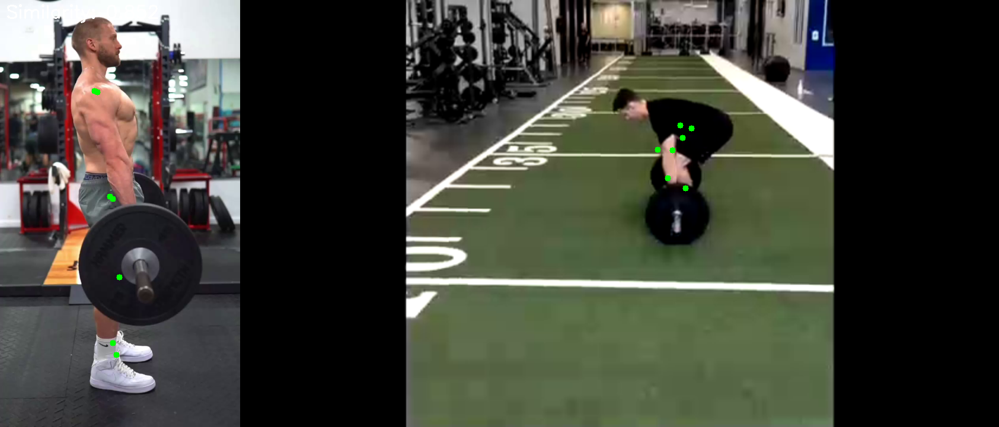

Frame 176/709 - Similarity: 0.852


KeyboardInterrupt: 

In [ ]:
import time
from IPython.display import clear_output

def display_sequence_comparison(reference_path: str, user_path: str,
                              frame_delay: float = 0.1):
    """
    Display sequence comparison with proper frame timing in Colab.

    Args:
        reference_path: Path to reference video
        user_path: Path to user video
        frame_delay: Delay between frames in seconds
    """
    # Initialize processor
    processor = DeadliftProcessor()

    # Process videos
    reference_seq = processor.process_video(reference_path)
    user_seq = processor.process_video(user_path)

    if reference_seq and user_seq:
        # Compute similarity and align sequences
        overall_similarity, frame_similarities, (aligned_ref, aligned_user) = processor.compute_similarity(
            reference_seq, user_seq
        )

        print(f"Overall Similarity Score: {overall_similarity:.3f}")
        print(f"Number of aligned frames: {len(frame_similarities)}")

        # Visualize comparison
        visualizations = processor.visualize_comparison(
            aligned_ref, aligned_user, frame_similarities
        )

        # Display visualizations with proper timing
        for i, frame in enumerate(visualizations):
            clear_output(wait=True)  # Clear previous frame
            cv2_imshow(frame)
            print(f"Frame {i+1}/{len(visualizations)} - Similarity: {frame_similarities[i]:.3f}")
            time.sleep(frame_delay)  # Add delay between frames

        # Display final summary
        print("\nVisualization Complete")
        print(f"Final Overall Similarity: {overall_similarity:.3f}")
        print(f"Min Frame Similarity: {min(frame_similarities):.3f}")
        print(f"Max Frame Similarity: {max(frame_similarities):.3f}")
    else:
        print("Failed to process one or both videos.")

# Use the function
display_sequence_comparison(reference_path, user_path, frame_delay=0.2)

Processing 9 reference videos and 94 training videos
Processing 9 reference videos and 94 training videos
VISUALIZING REPS-----


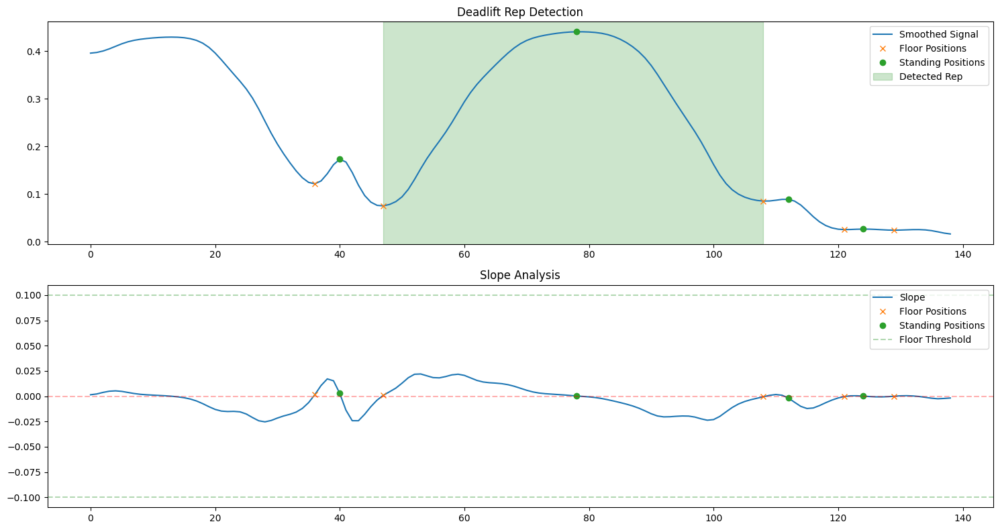

VISUALIZING REPS-----


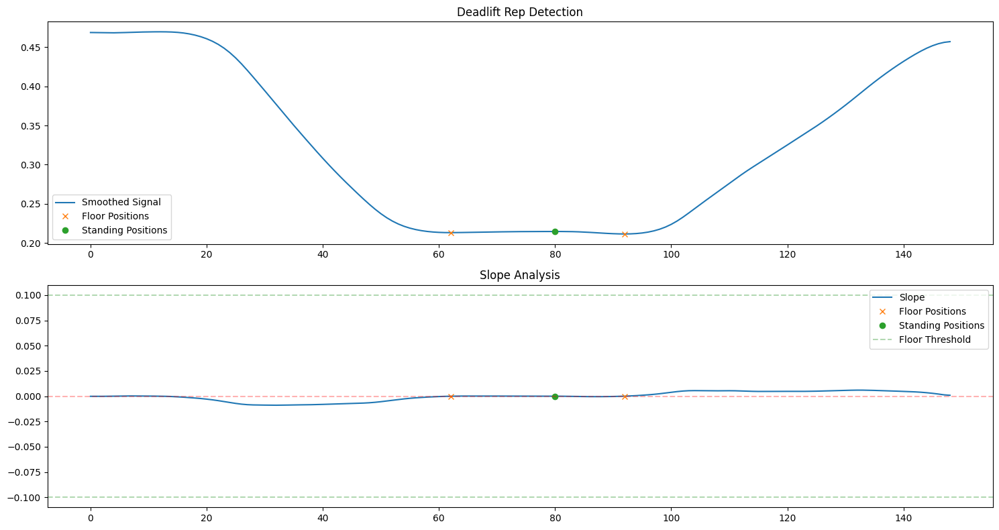

VISUALIZING REPS-----


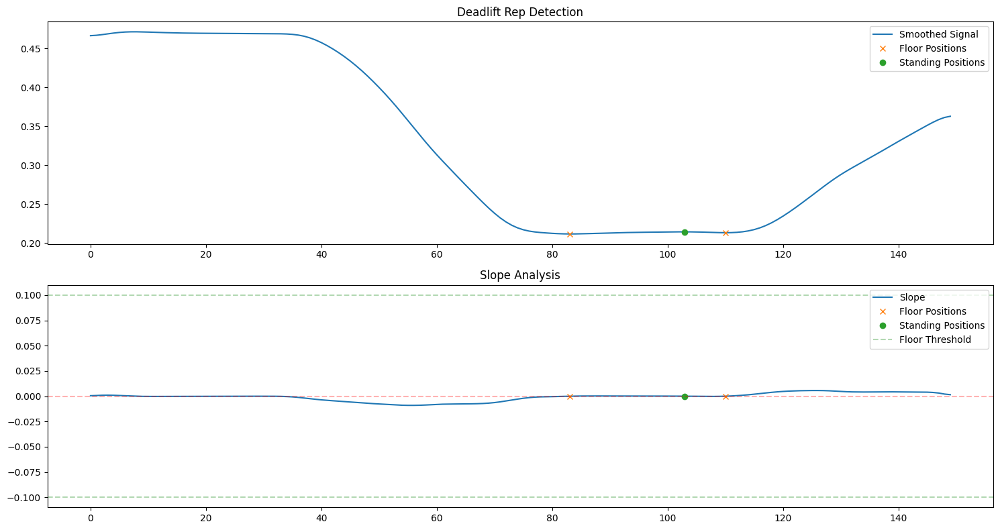

VISUALIZING REPS-----


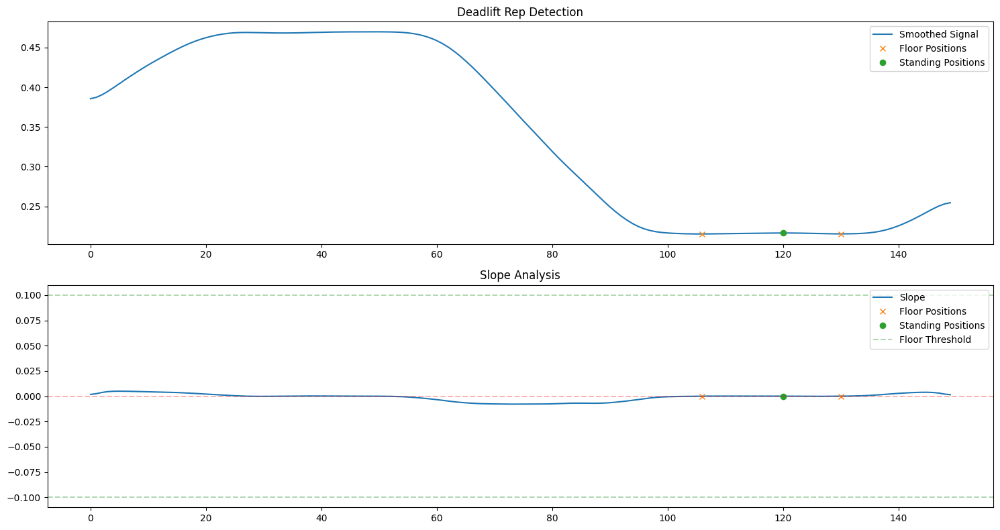

VISUALIZING REPS-----


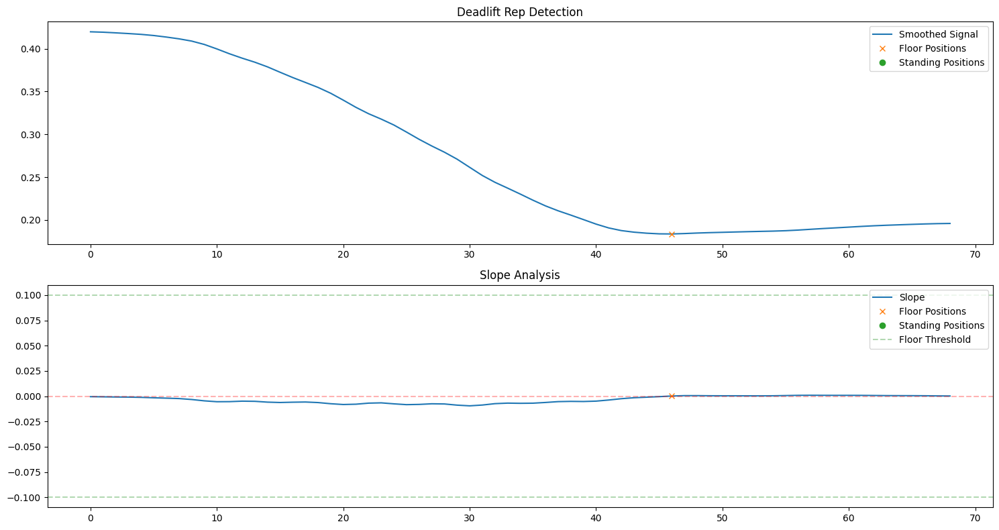

VISUALIZING REPS-----


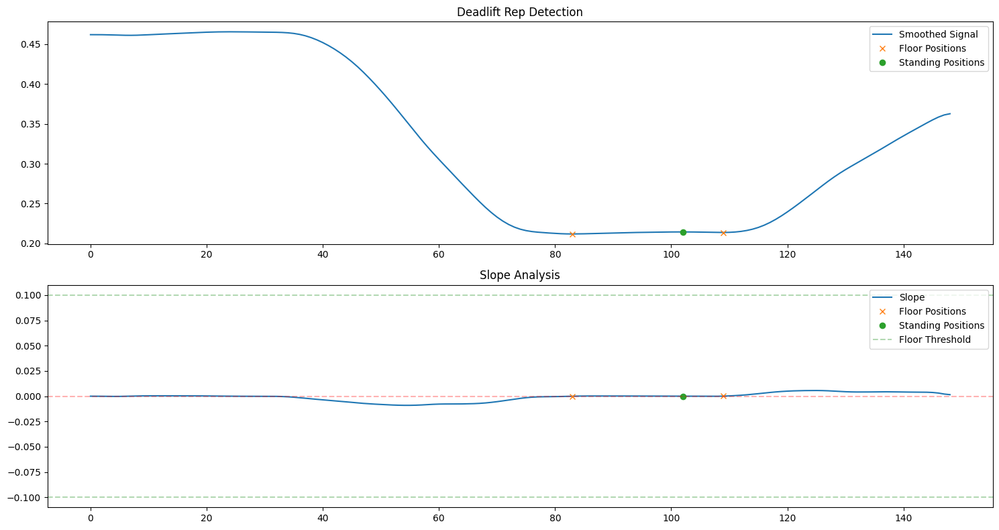

VISUALIZING REPS-----


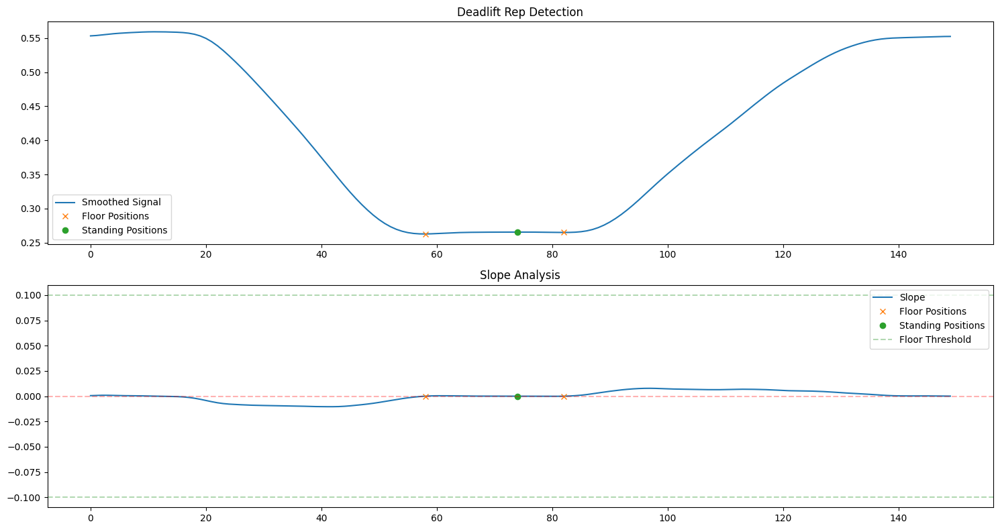

VISUALIZING REPS-----


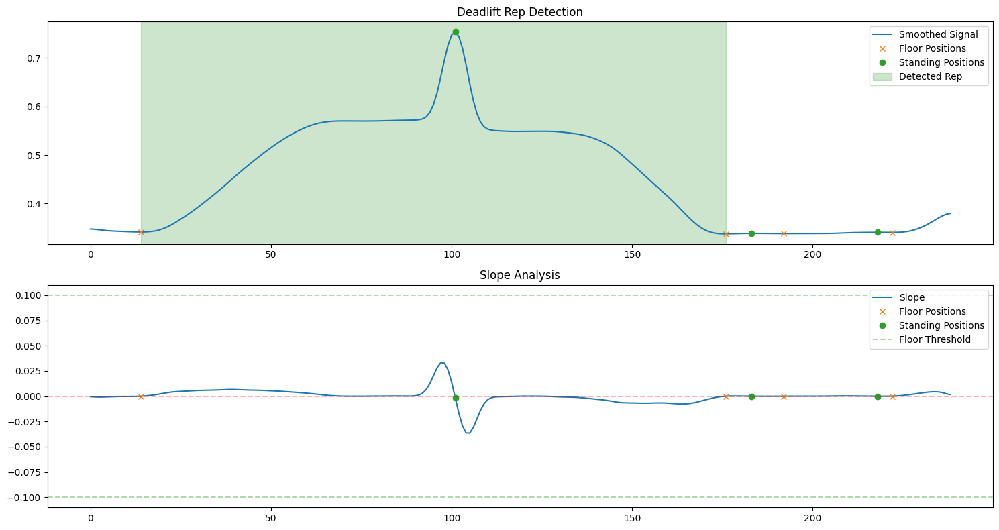

VISUALIZING REPS-----


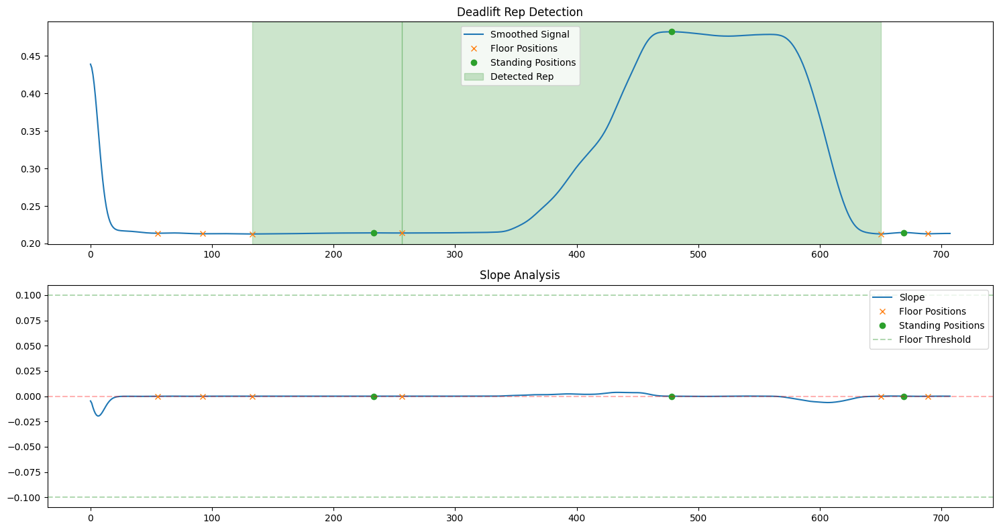

VISUALIZING REPS-----


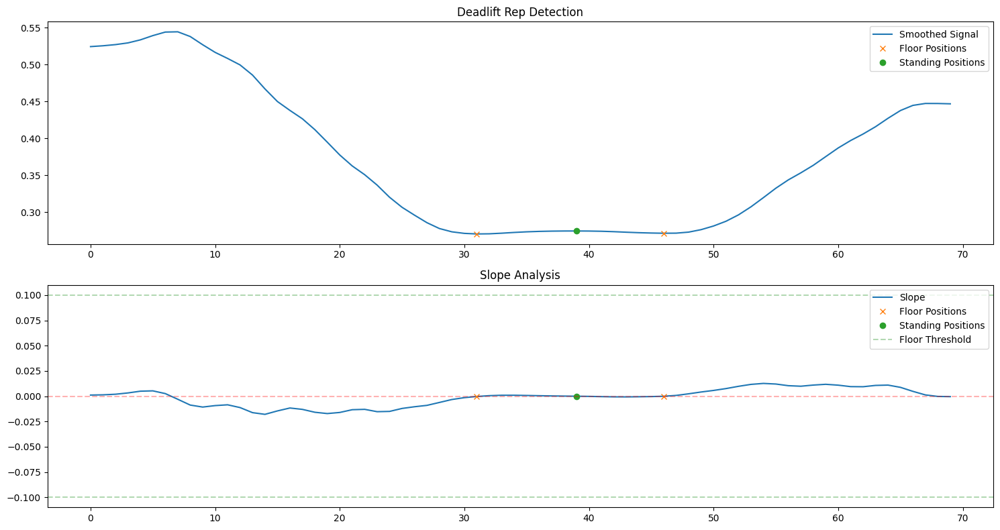

VISUALIZING REPS-----


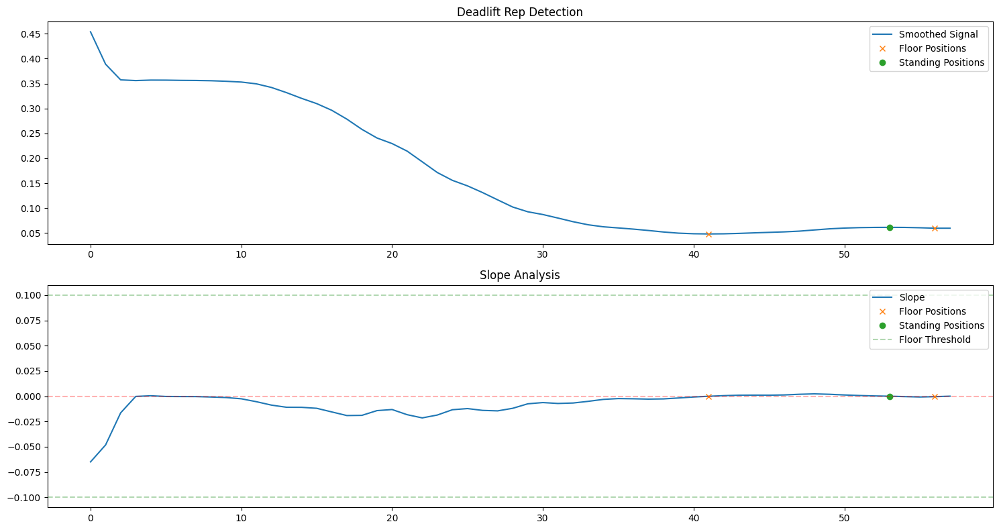

VISUALIZING REPS-----


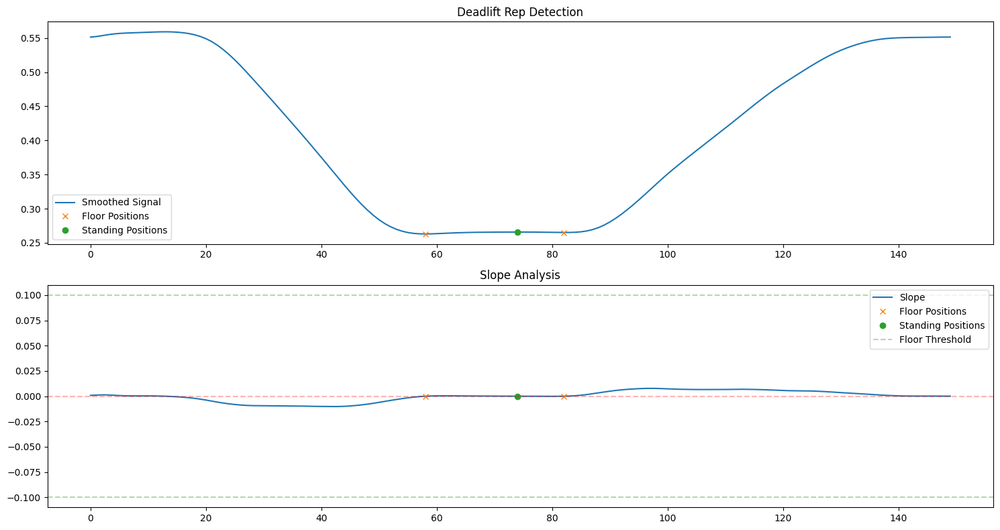

VISUALIZING REPS-----


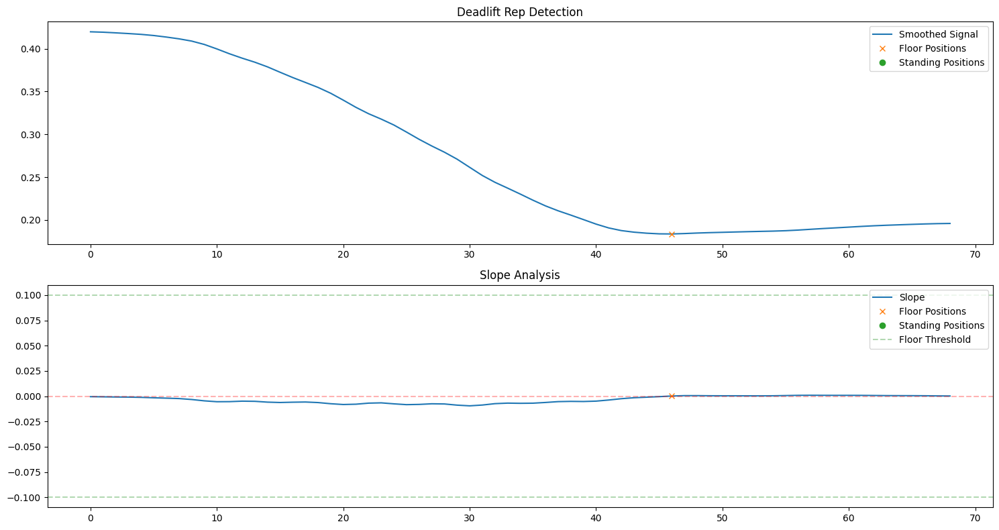

VISUALIZING REPS-----


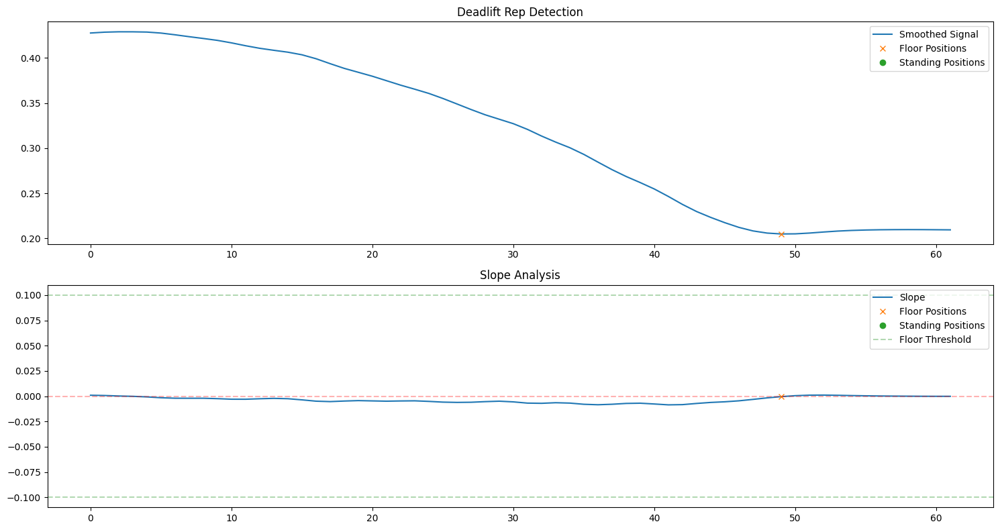

VISUALIZING REPS-----


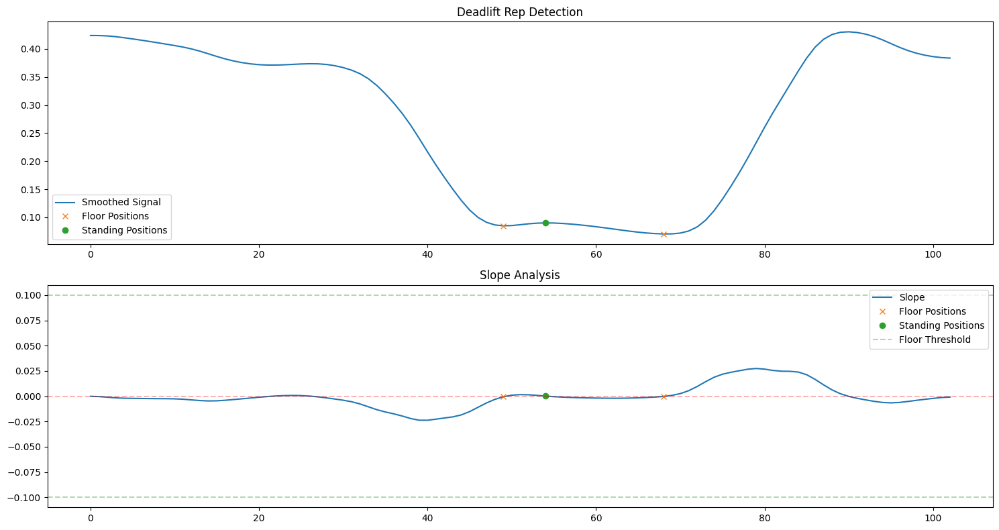

VISUALIZING REPS-----


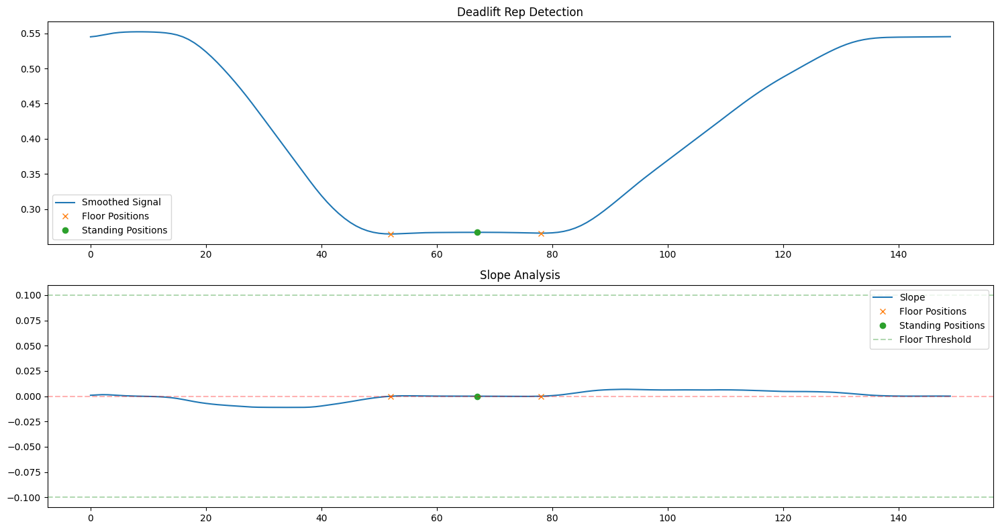

VISUALIZING REPS-----


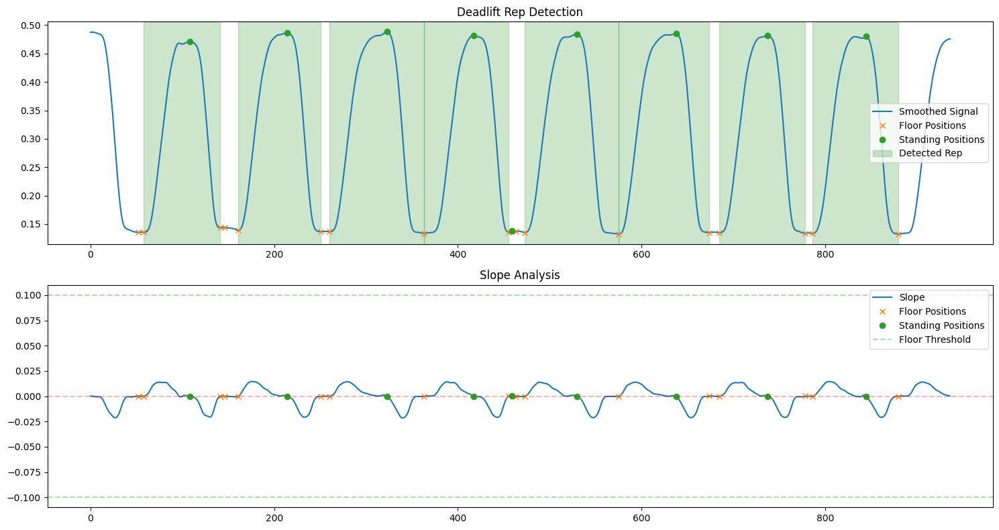

VISUALIZING REPS-----


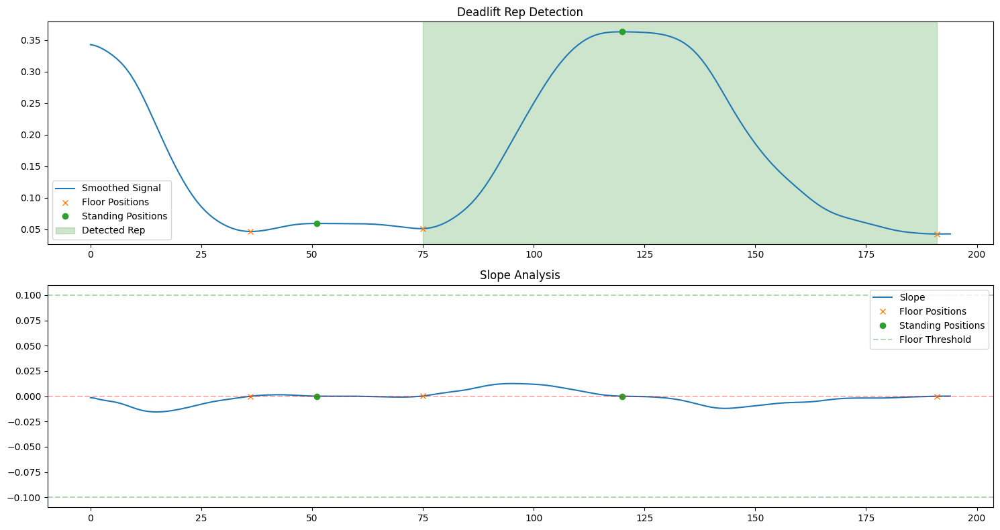

VISUALIZING REPS-----


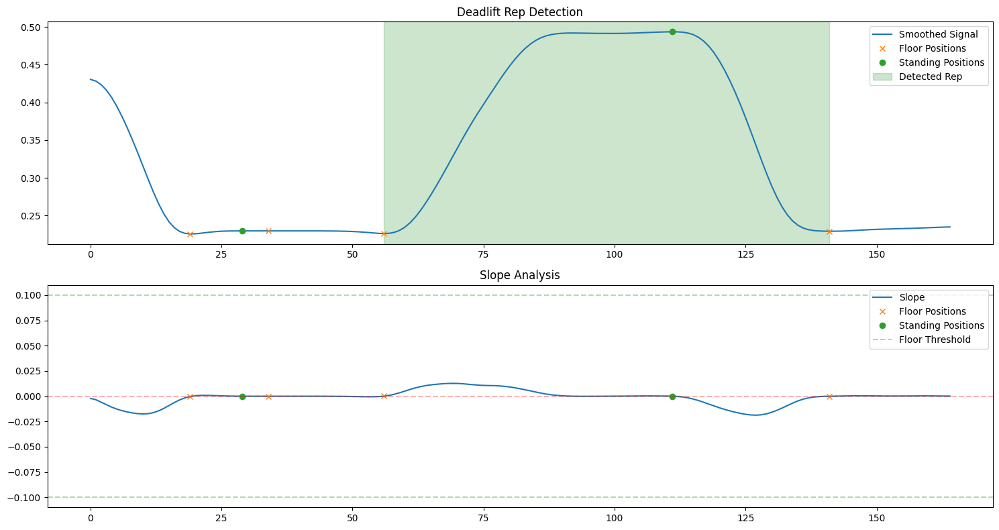

VISUALIZING REPS-----


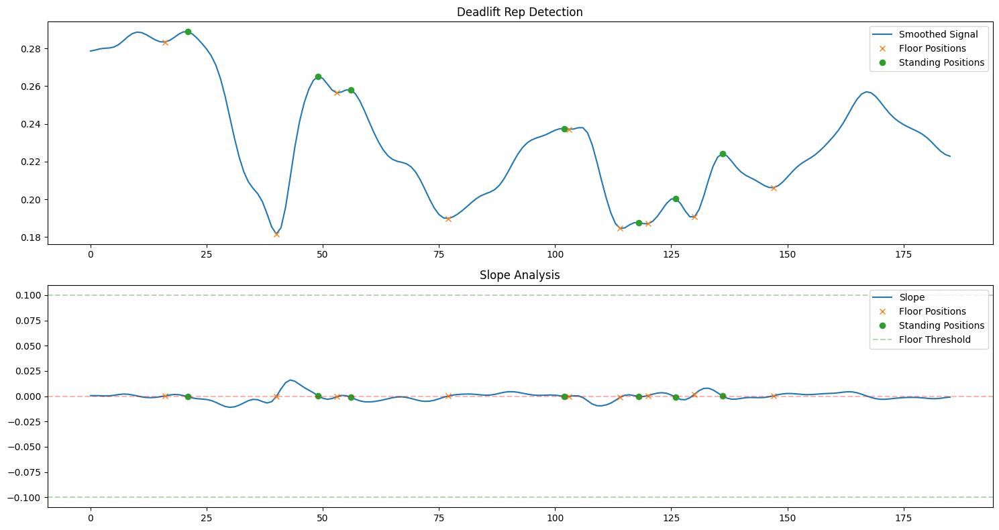

VISUALIZING REPS-----


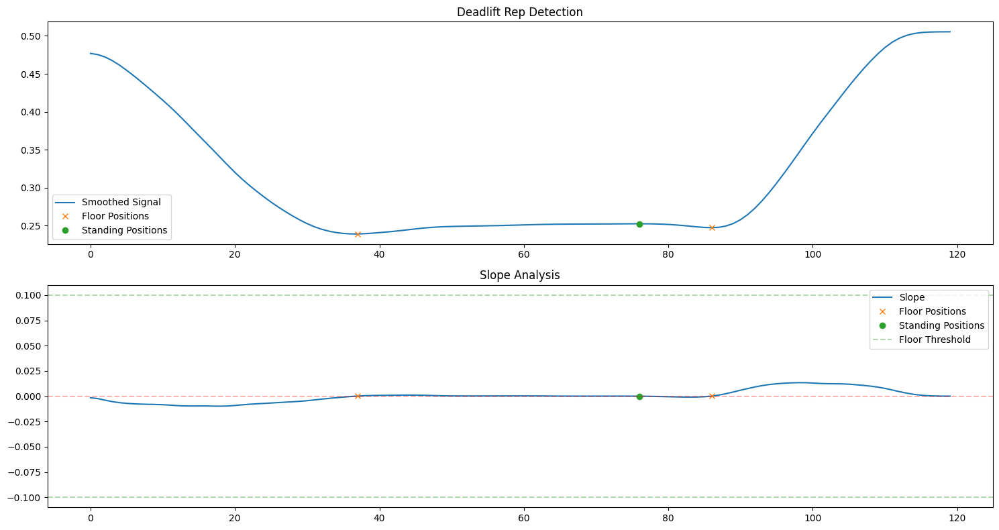

VISUALIZING REPS-----


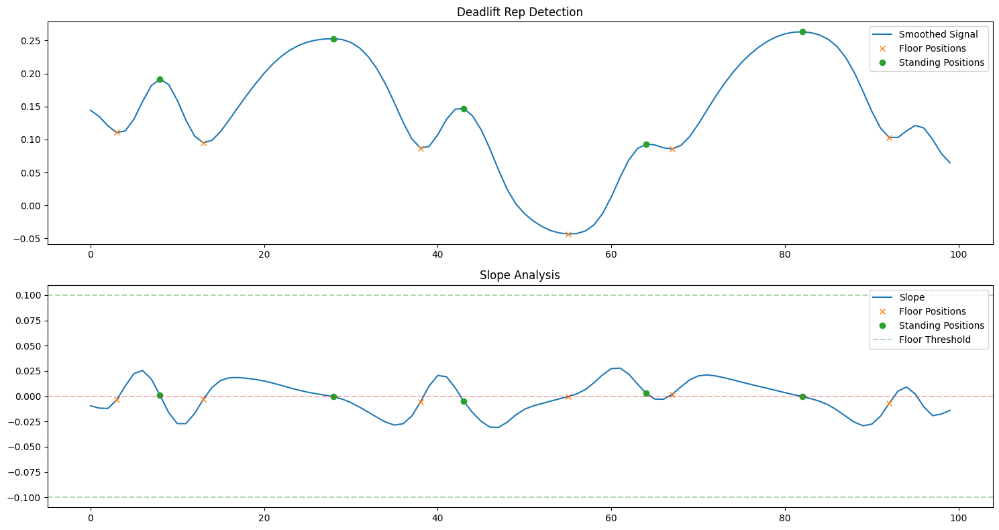

VISUALIZING REPS-----


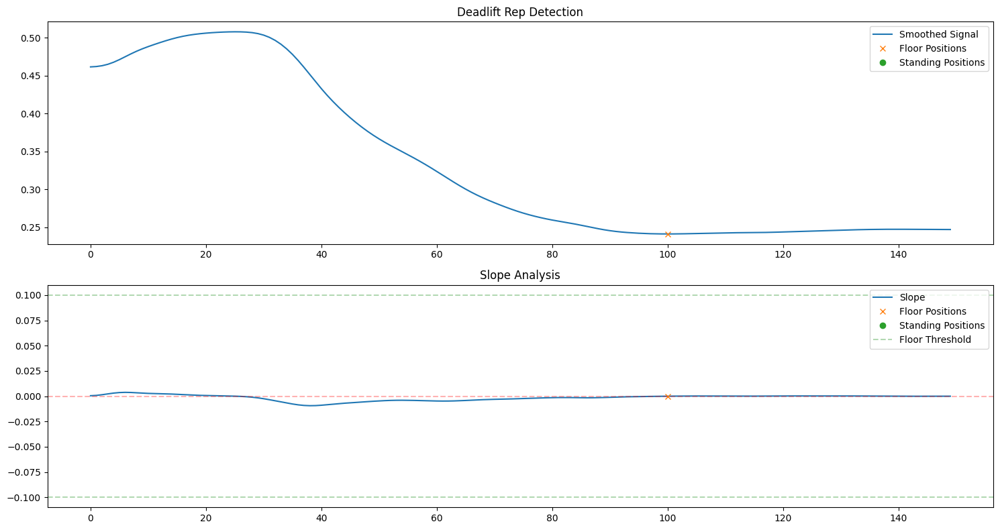

VISUALIZING REPS-----


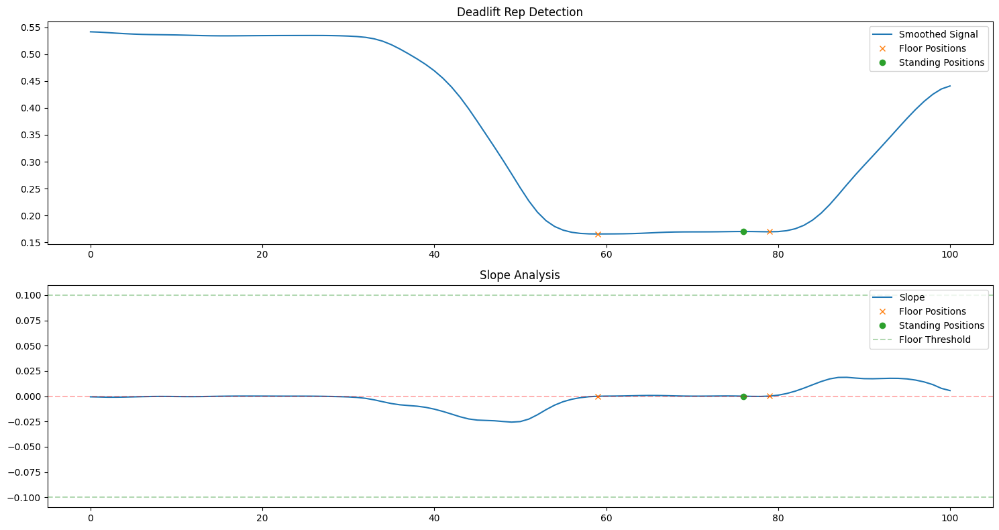

VISUALIZING REPS-----


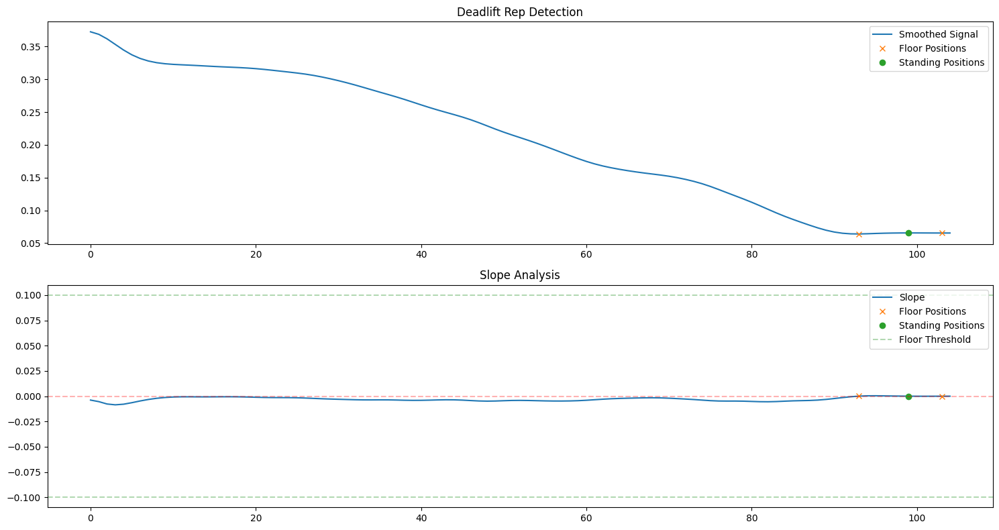

VISUALIZING REPS-----


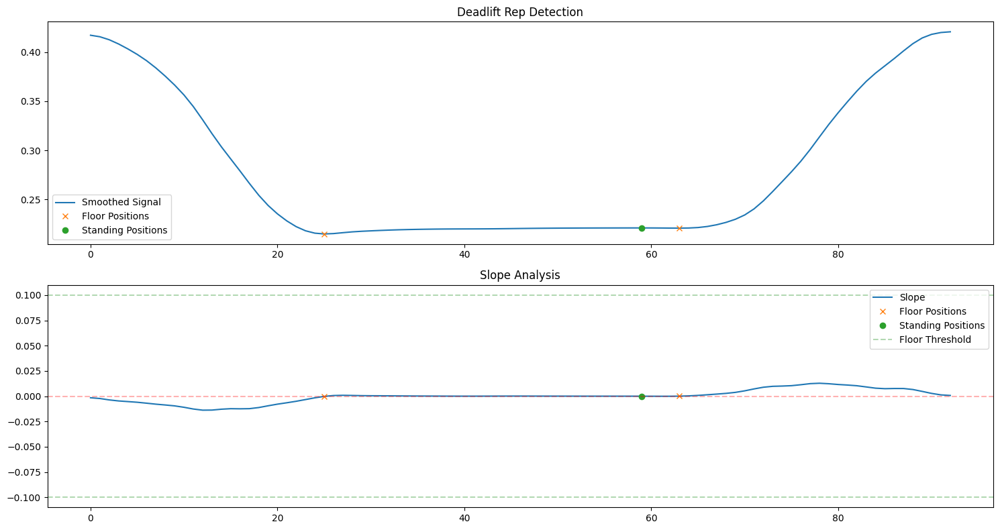

VISUALIZING REPS-----


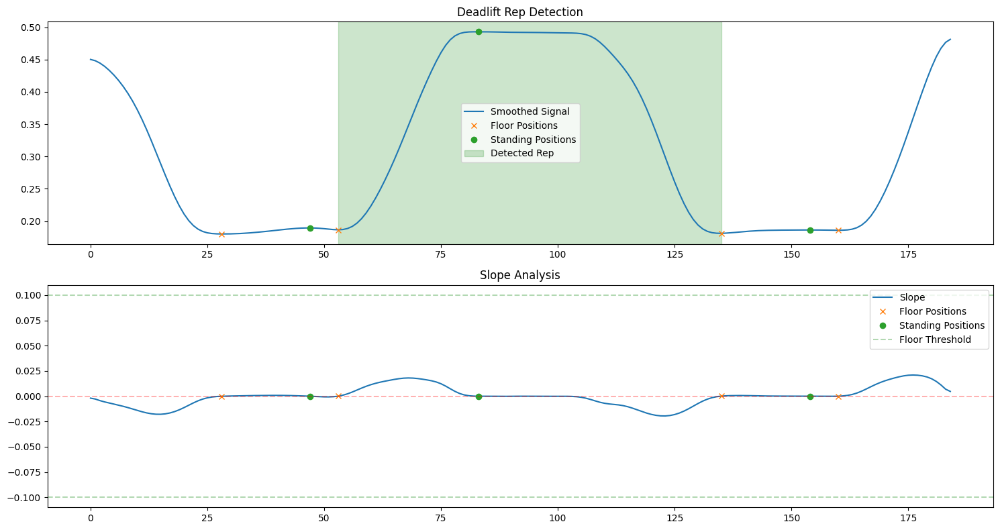

VISUALIZING REPS-----


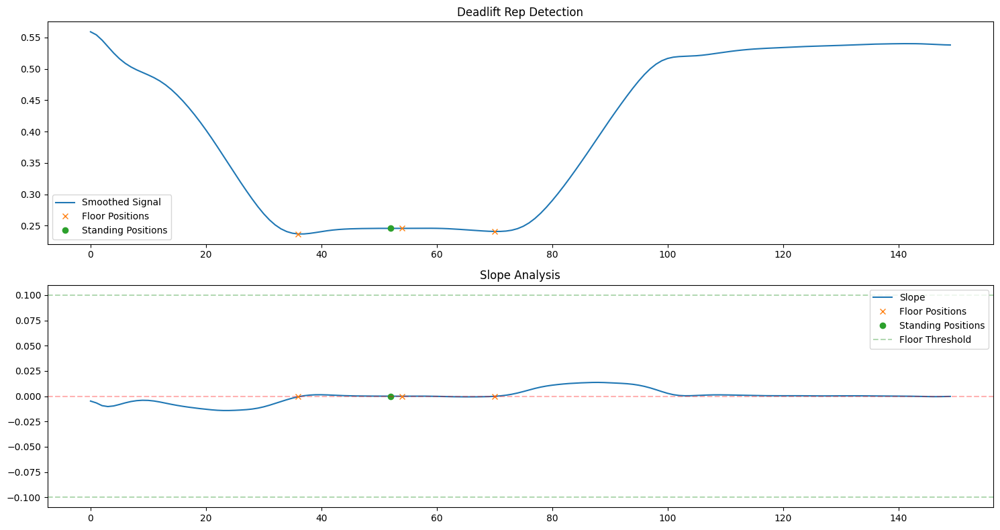

VISUALIZING REPS-----


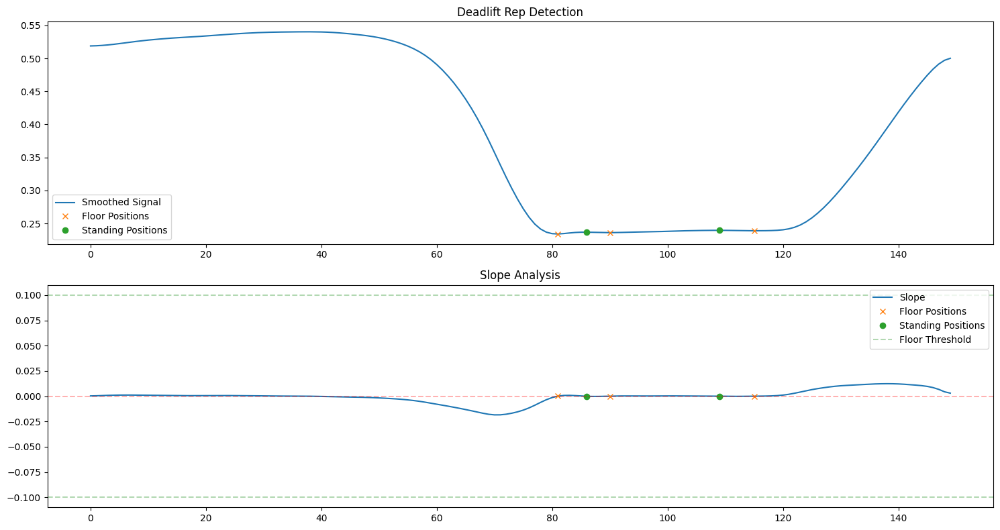

VISUALIZING REPS-----


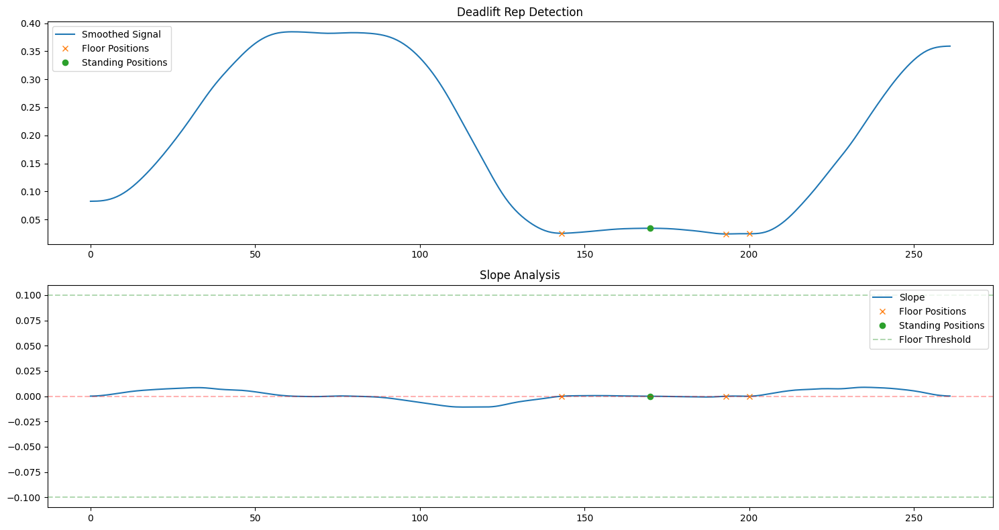

VISUALIZING REPS-----


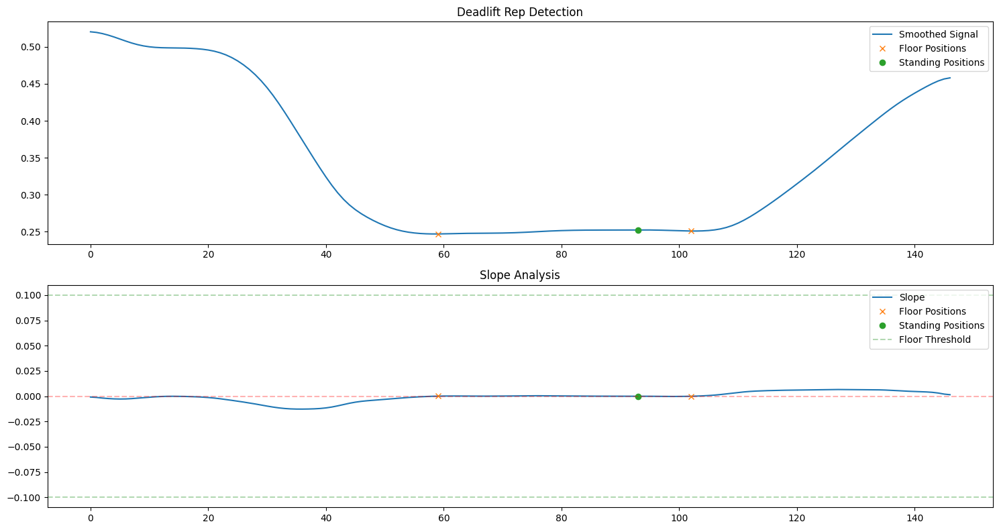

VISUALIZING REPS-----


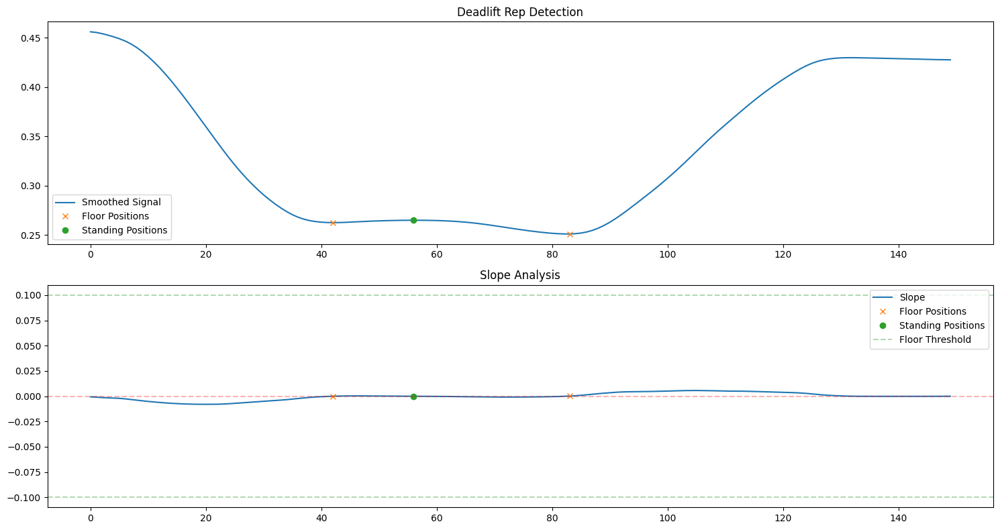

VISUALIZING REPS-----


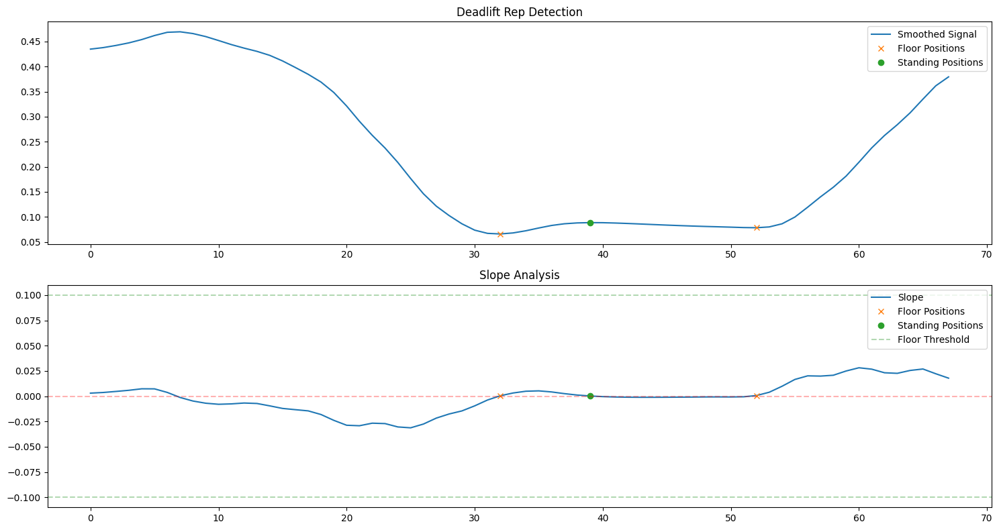

VISUALIZING REPS-----


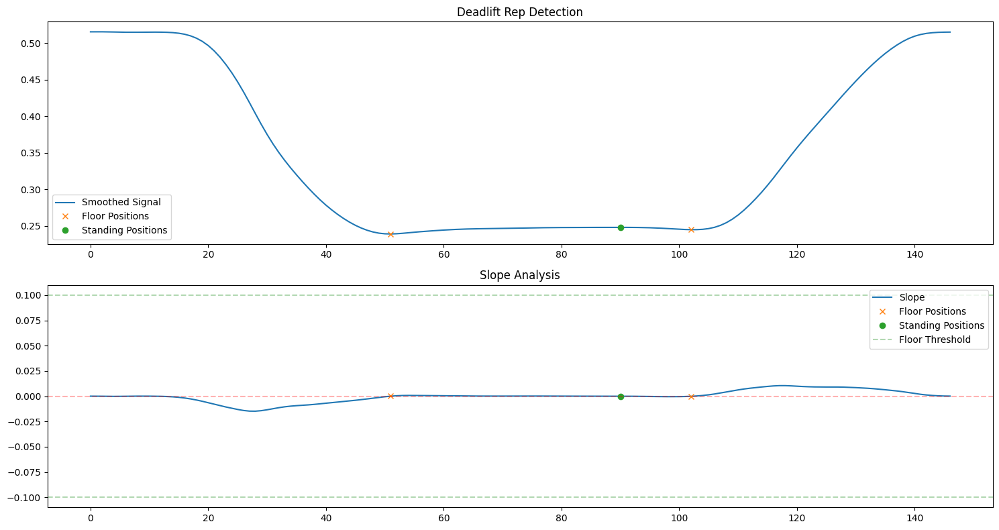

VISUALIZING REPS-----


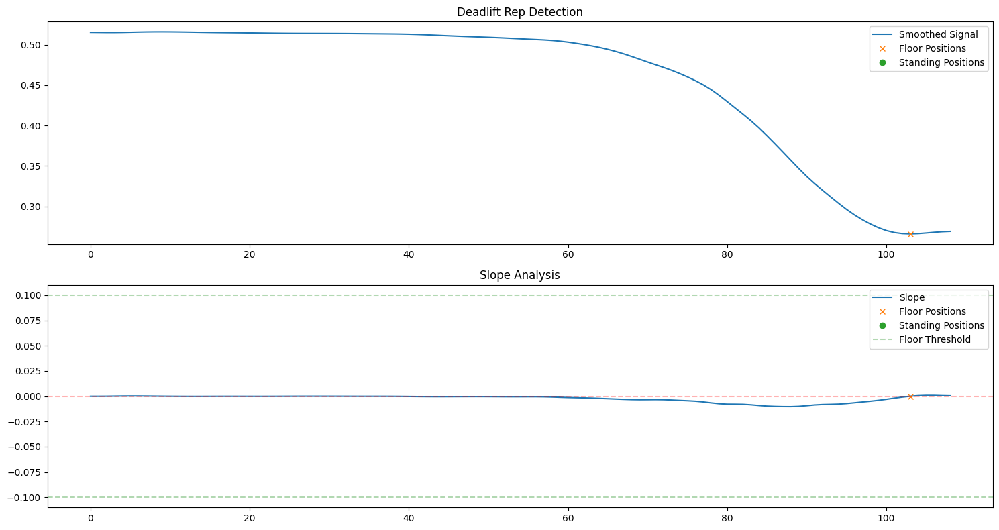

VISUALIZING REPS-----


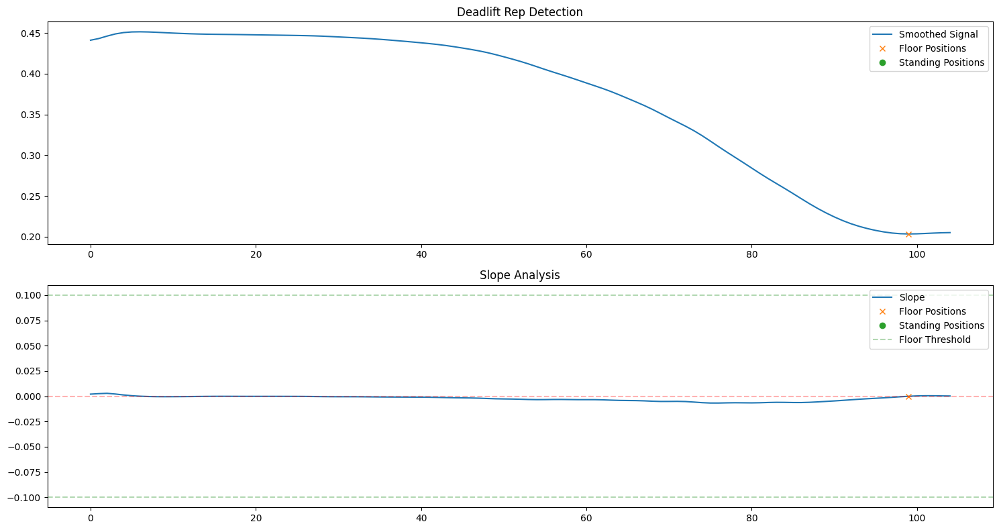

VISUALIZING REPS-----


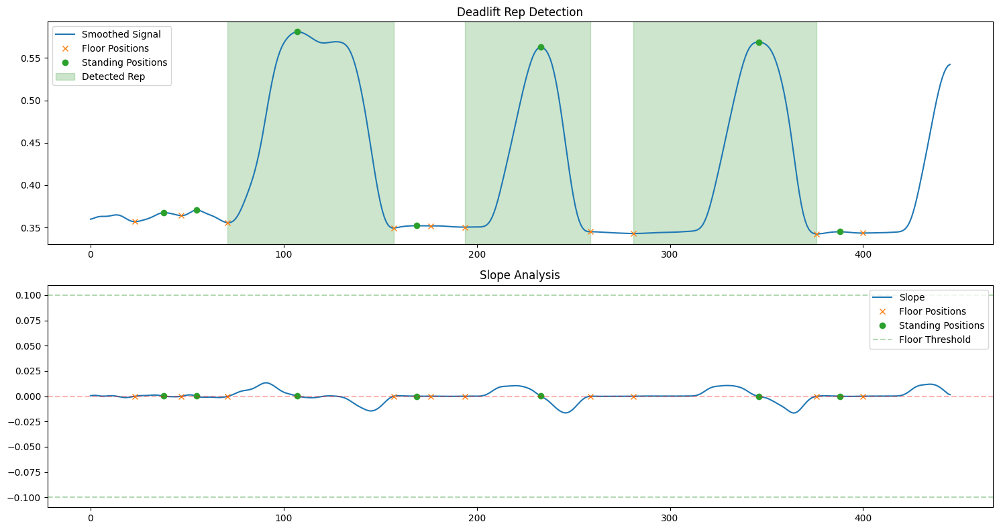

VISUALIZING REPS-----


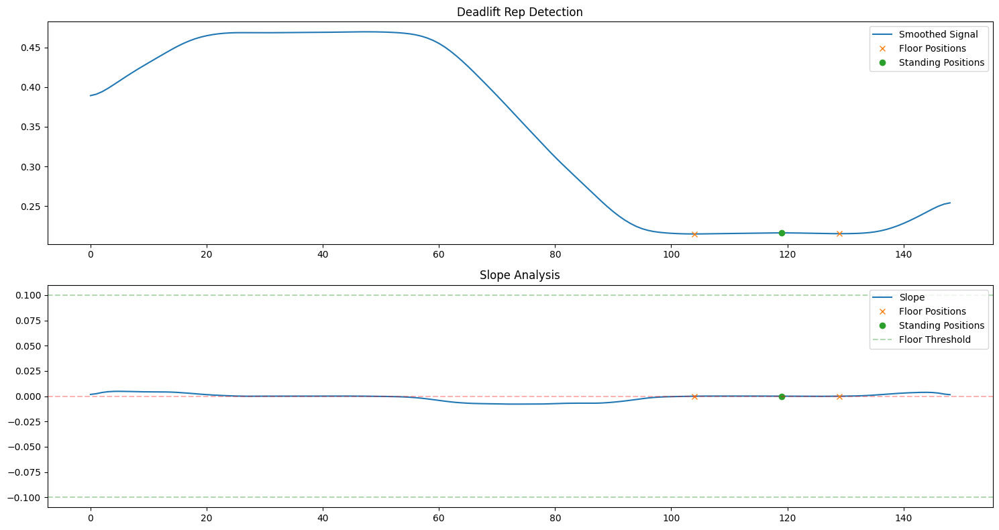

VISUALIZING REPS-----


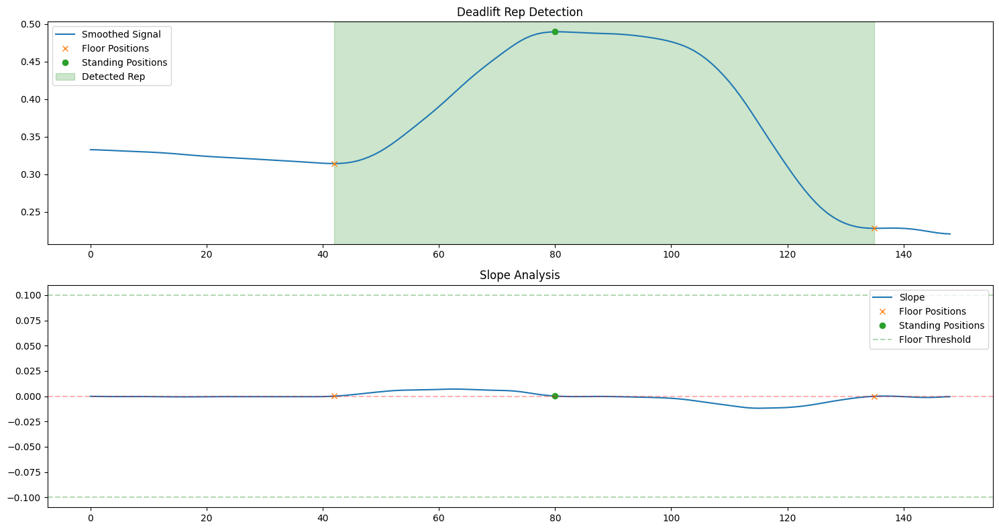

VISUALIZING REPS-----


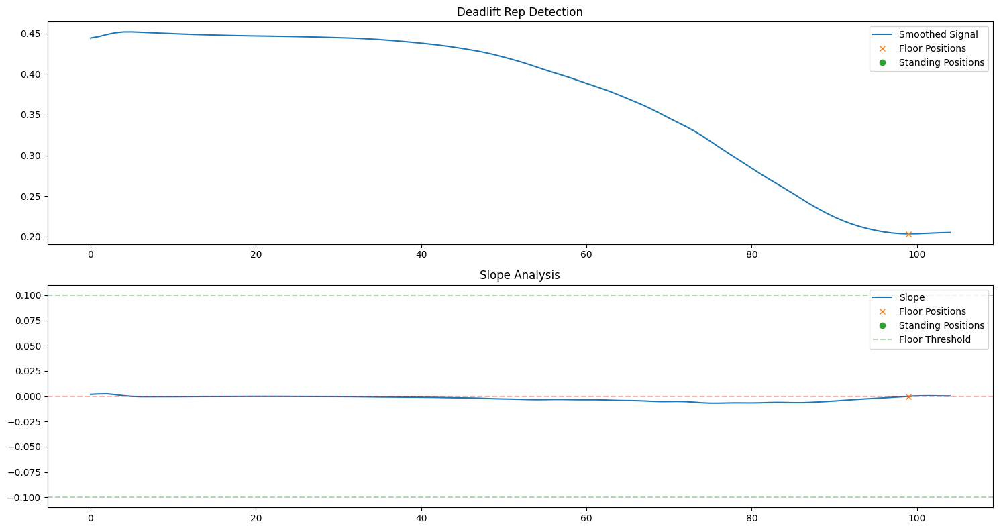

VISUALIZING REPS-----


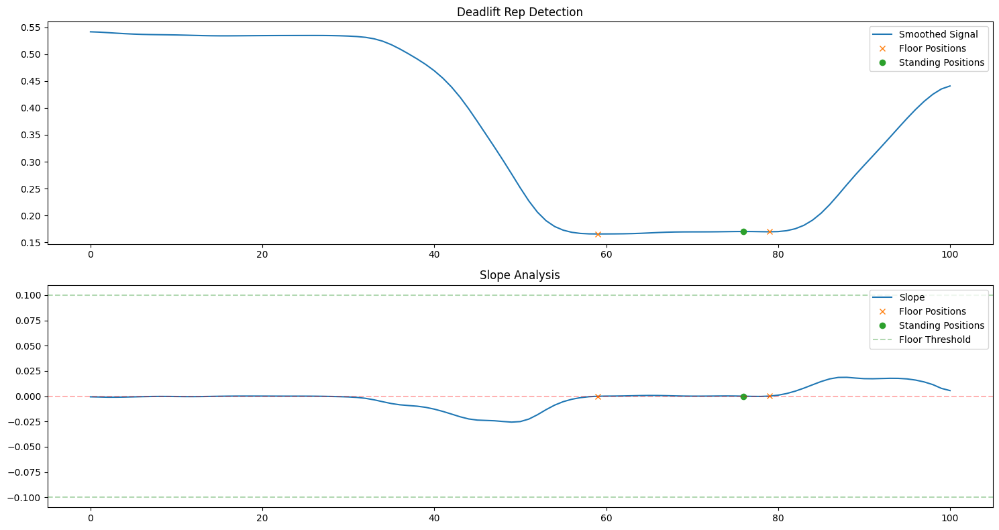

VISUALIZING REPS-----


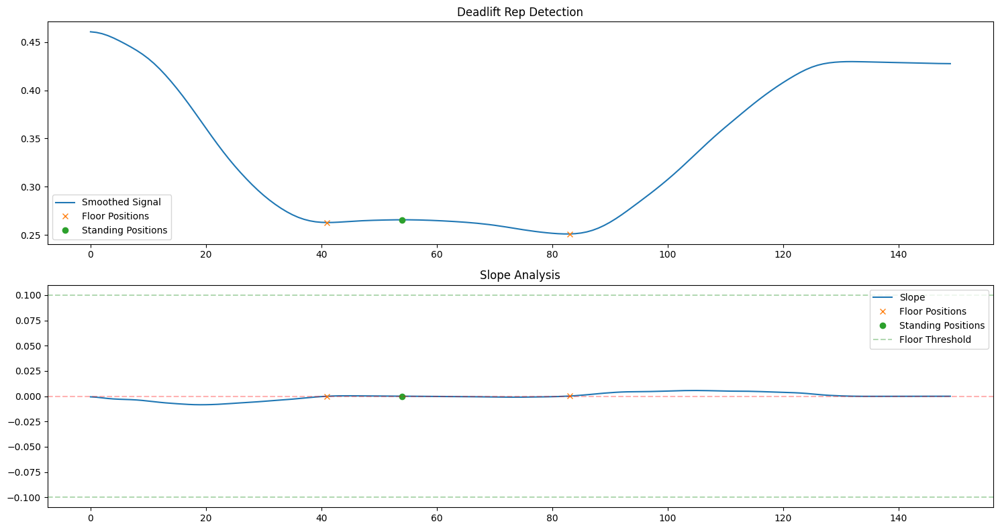

VISUALIZING REPS-----


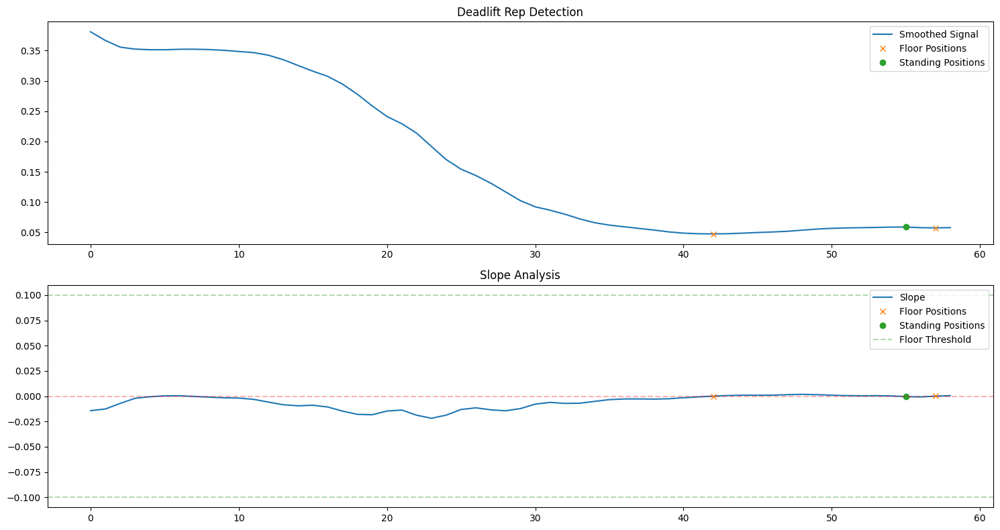

VISUALIZING REPS-----


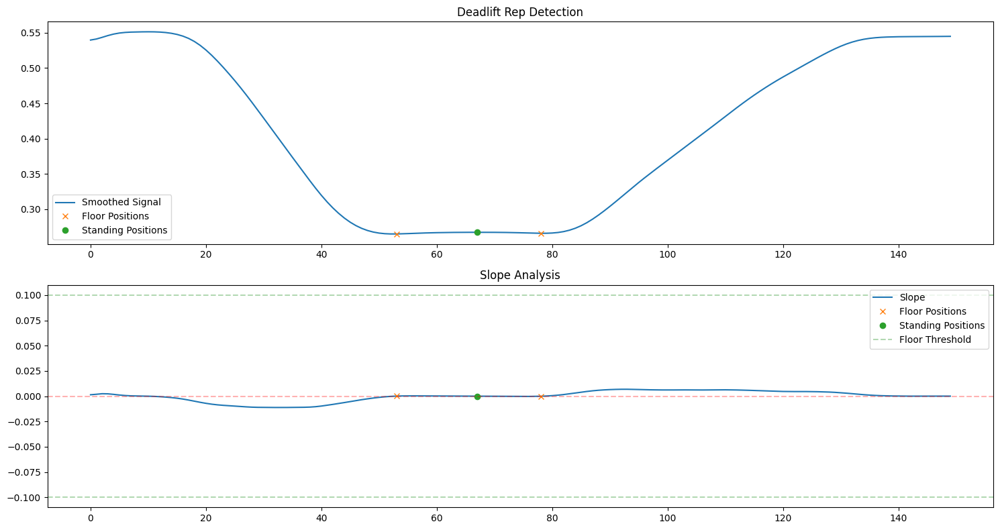

VISUALIZING REPS-----


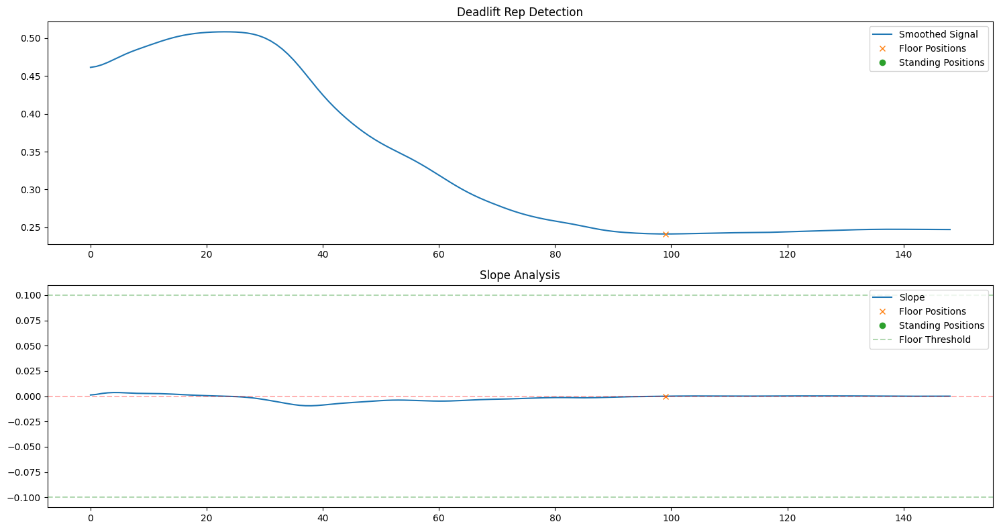

VISUALIZING REPS-----


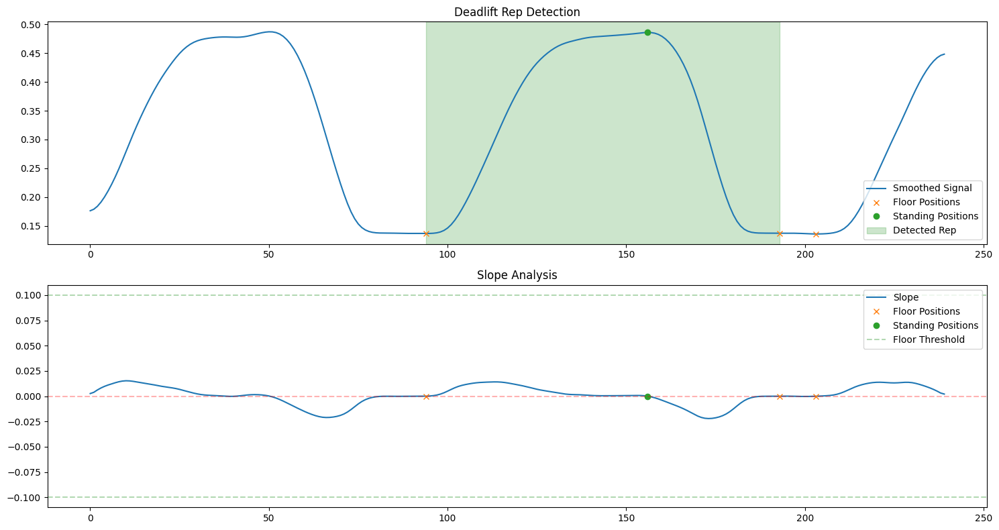

VISUALIZING REPS-----


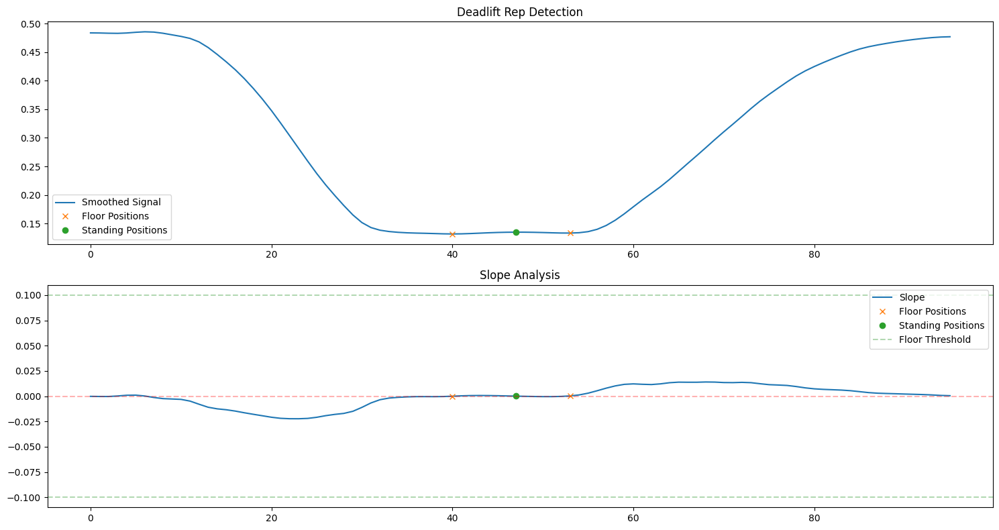

VISUALIZING REPS-----


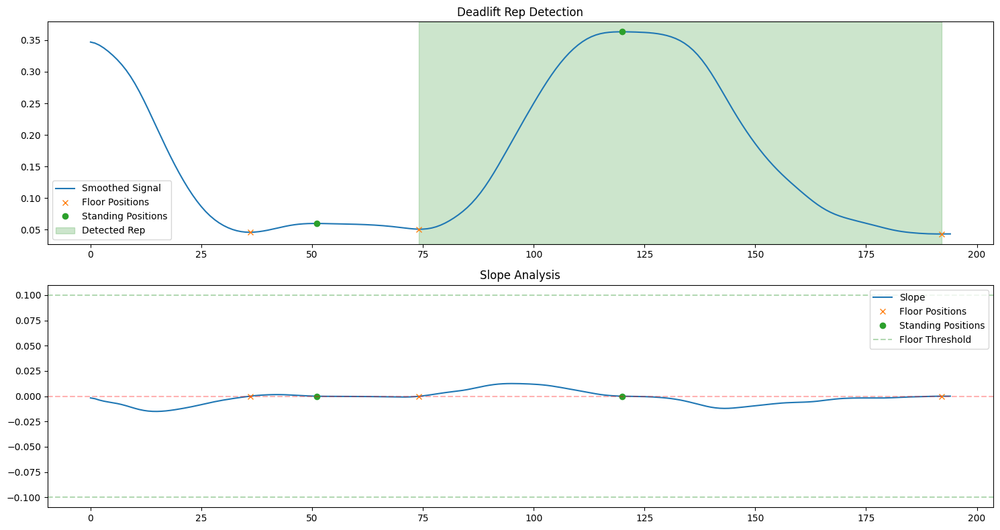

VISUALIZING REPS-----


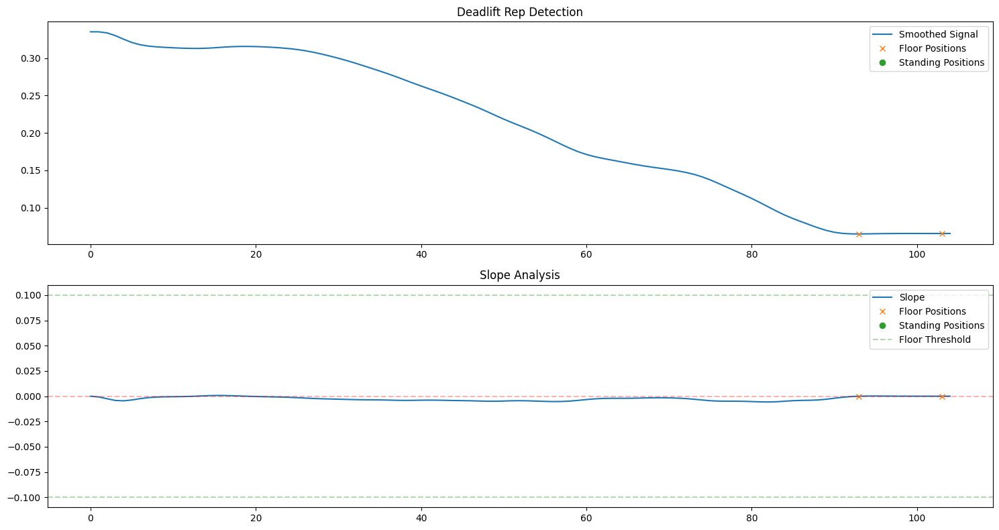

VISUALIZING REPS-----


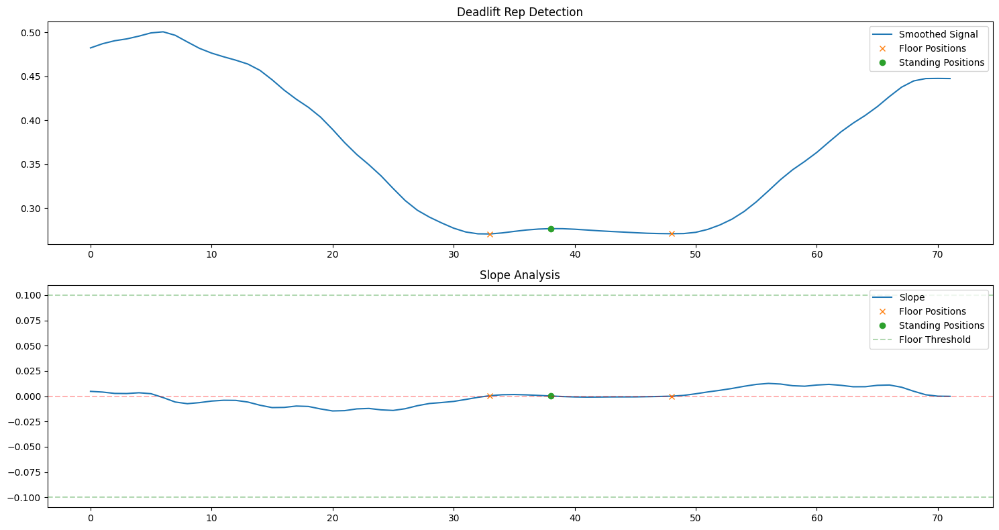

VISUALIZING REPS-----


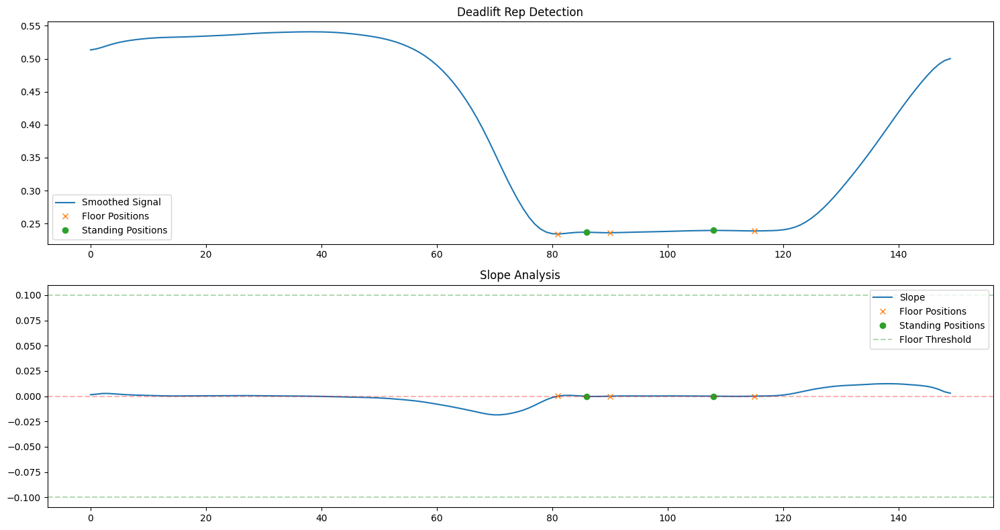

VISUALIZING REPS-----


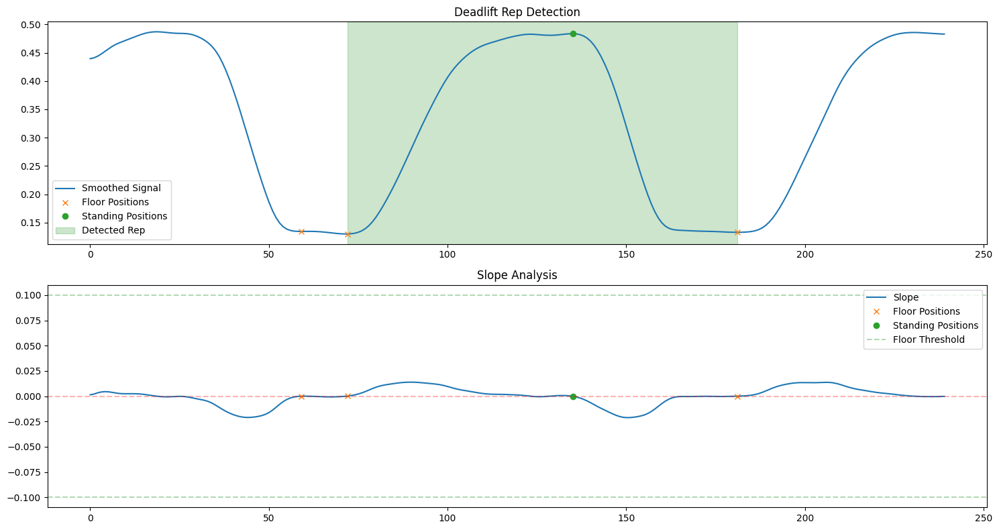

VISUALIZING REPS-----


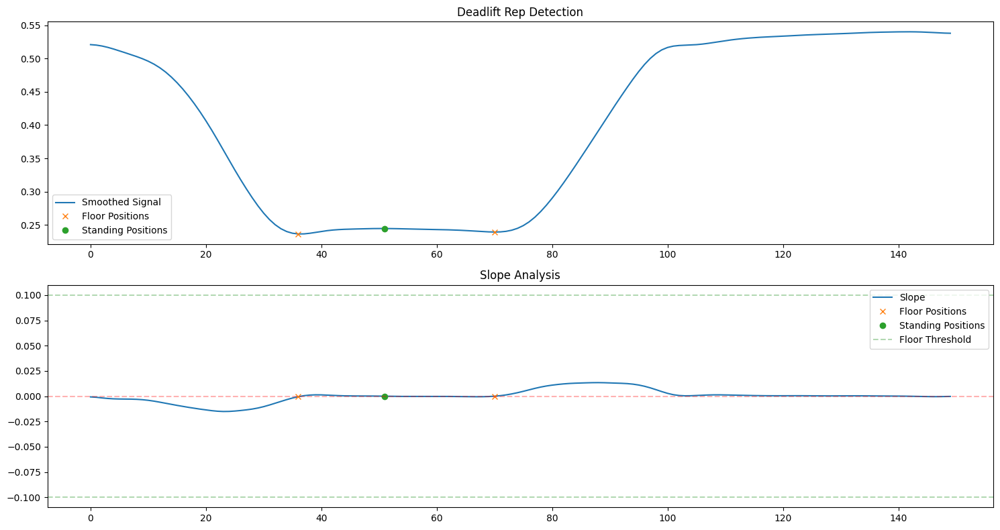

VISUALIZING REPS-----


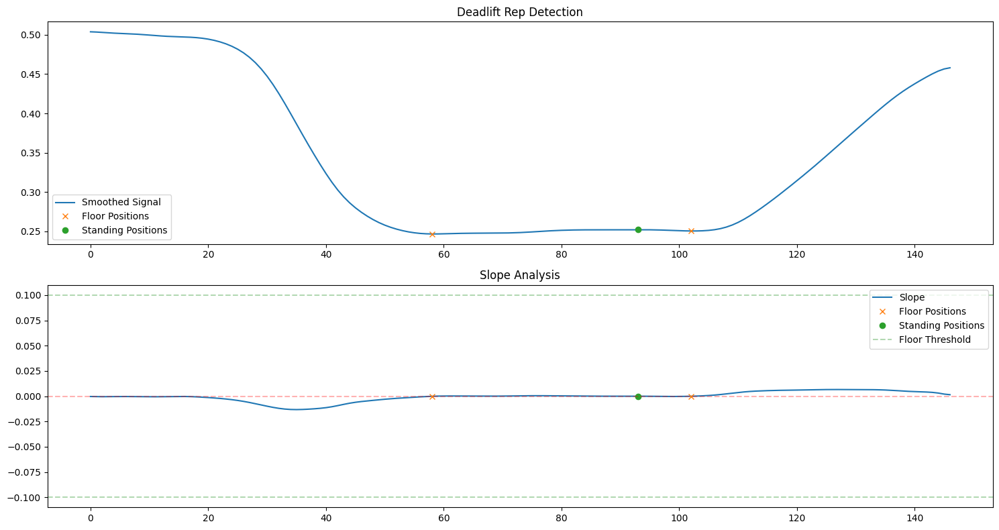

VISUALIZING REPS-----


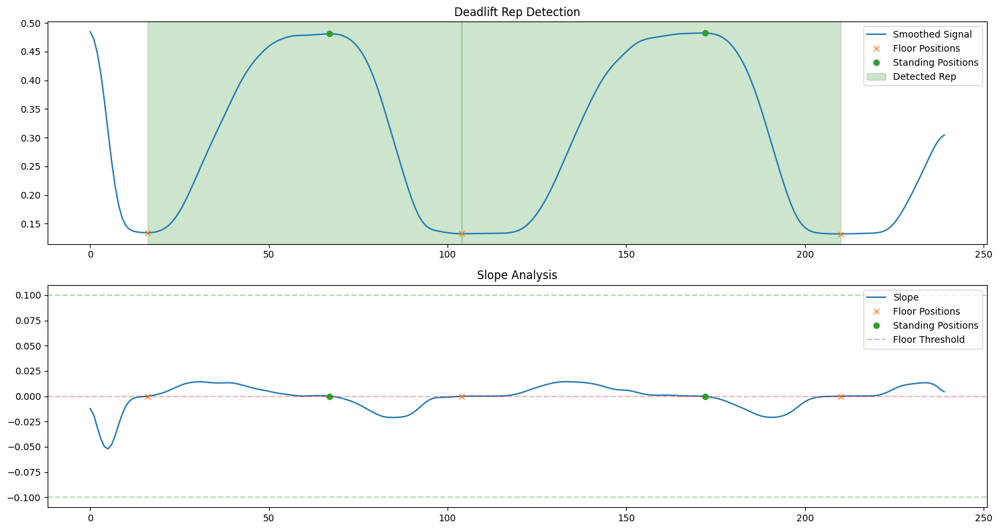

VISUALIZING REPS-----


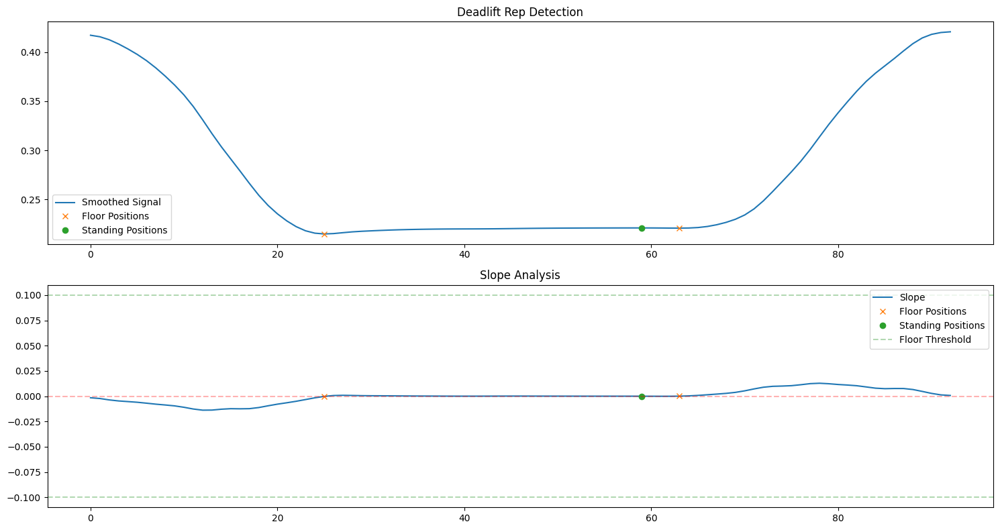

VISUALIZING REPS-----


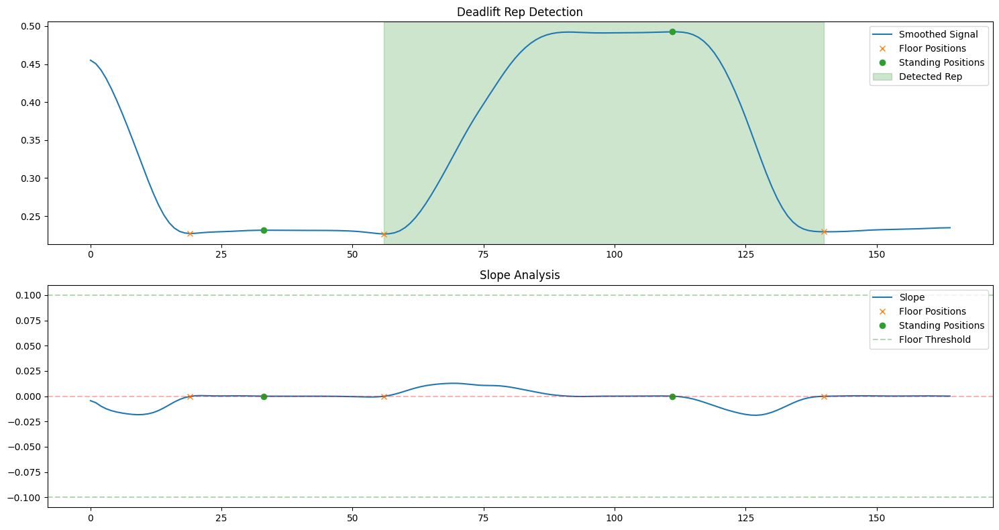

VISUALIZING REPS-----


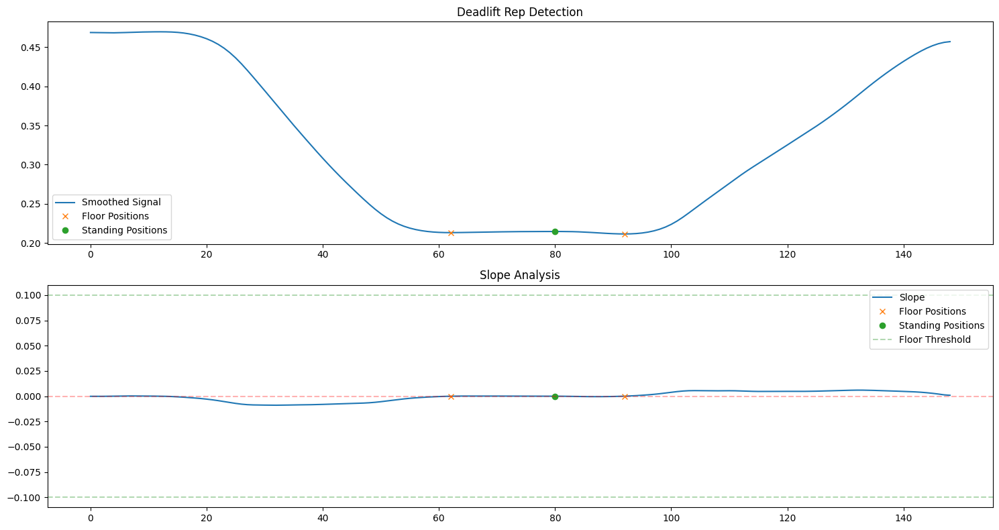

VISUALIZING REPS-----


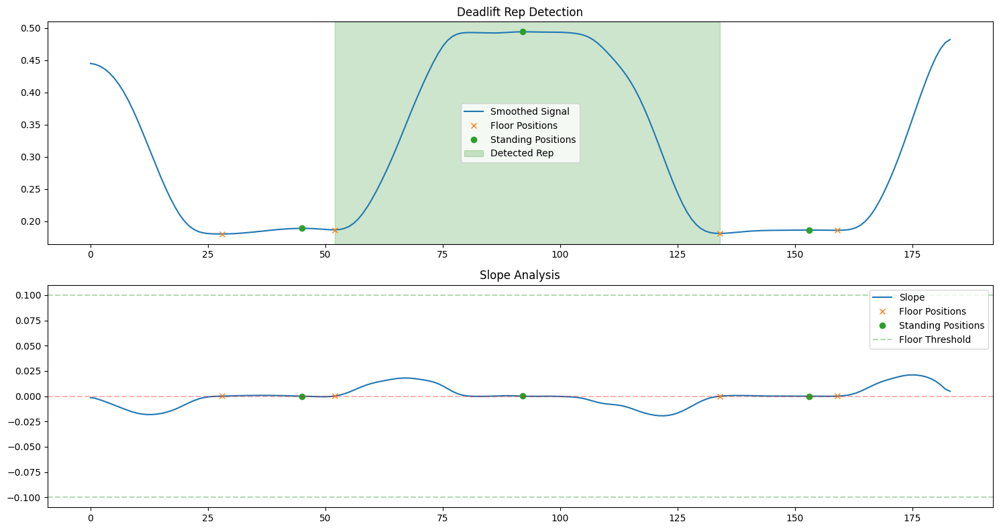

VISUALIZING REPS-----


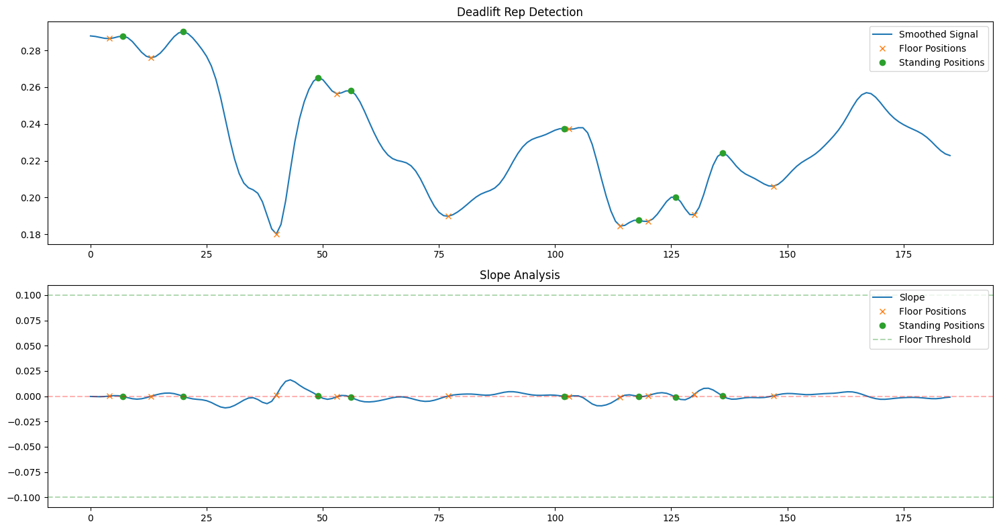

VISUALIZING REPS-----


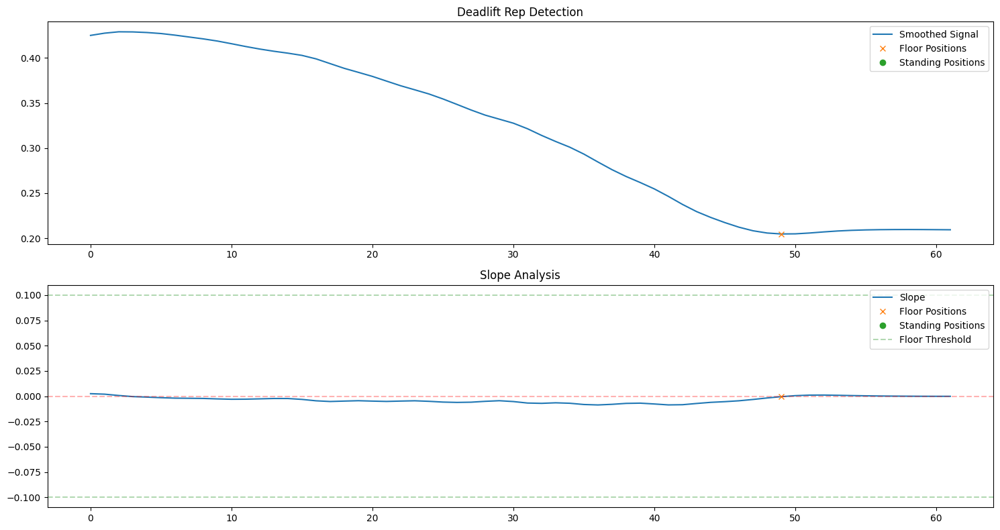

VISUALIZING REPS-----


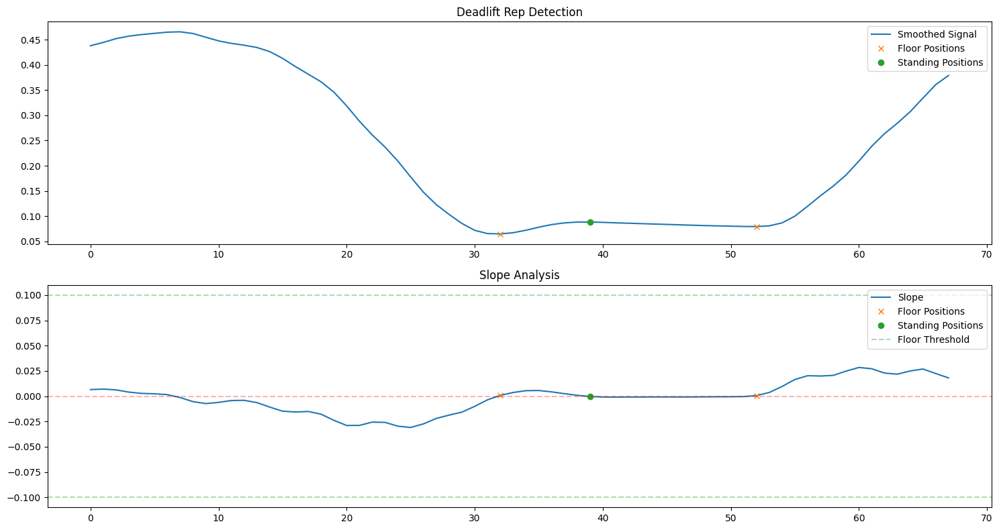

VISUALIZING REPS-----


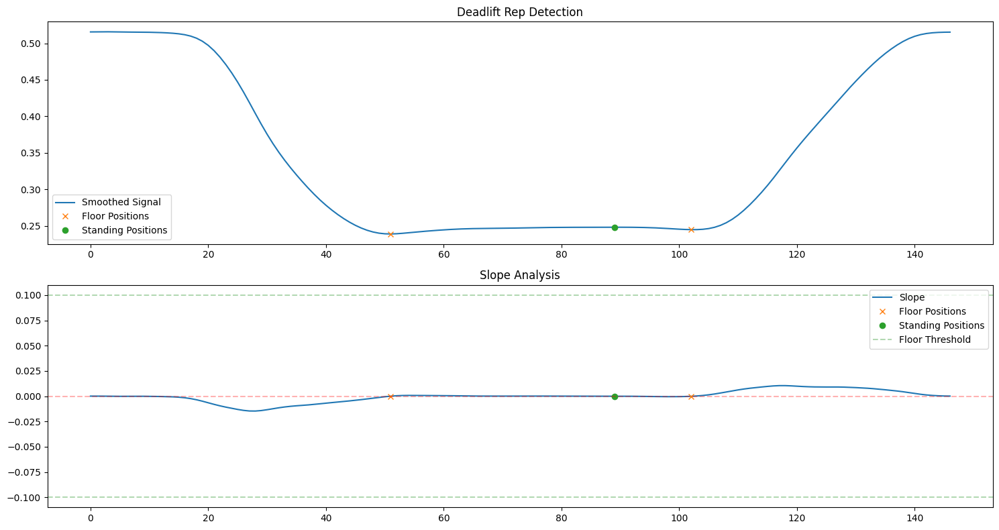

VISUALIZING REPS-----


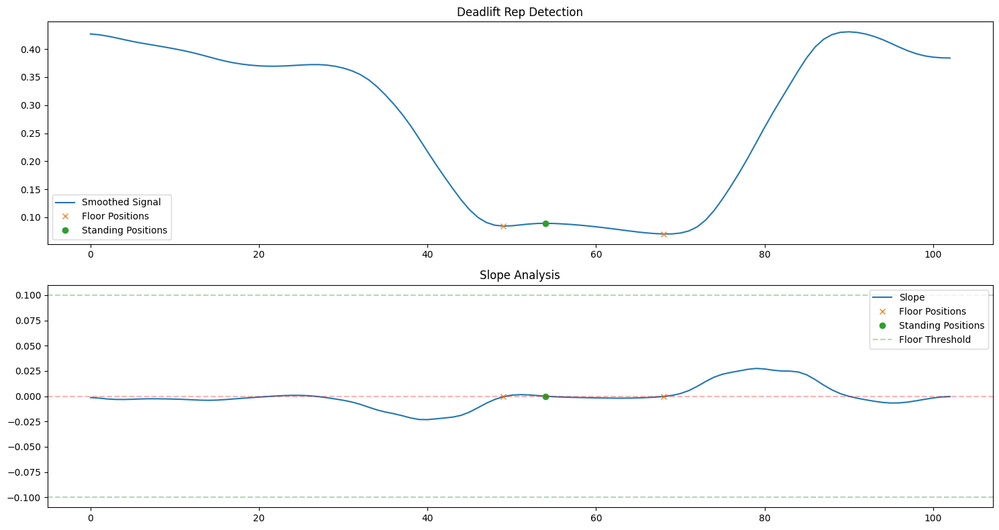

VISUALIZING REPS-----


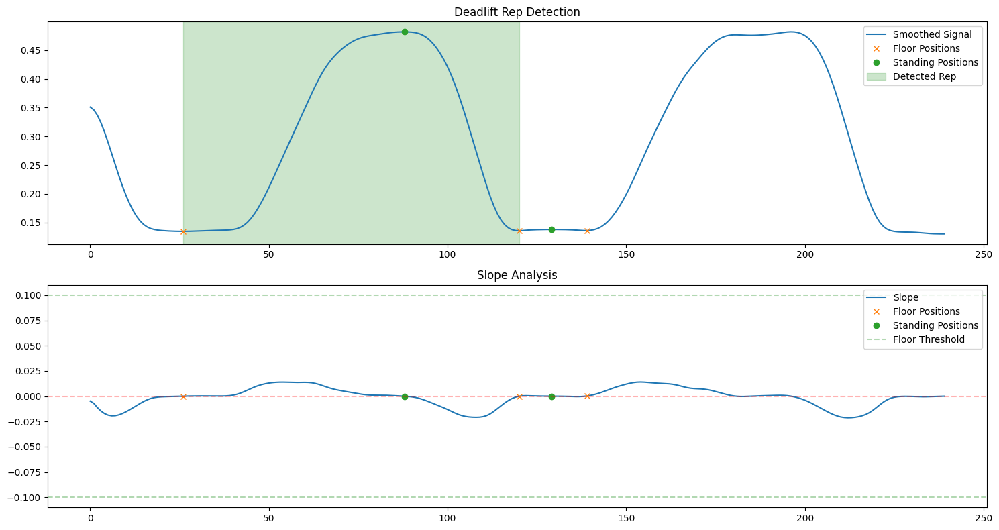

VISUALIZING REPS-----


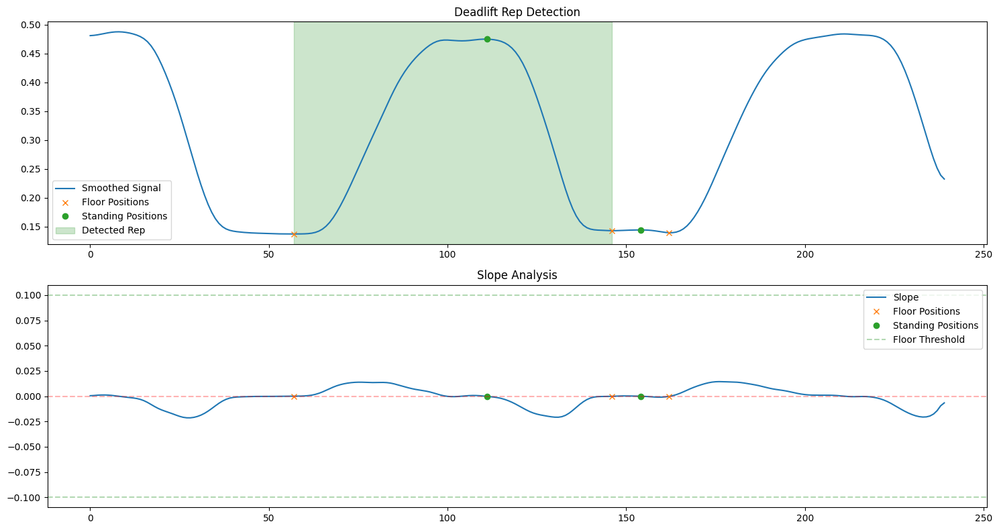

VISUALIZING REPS-----


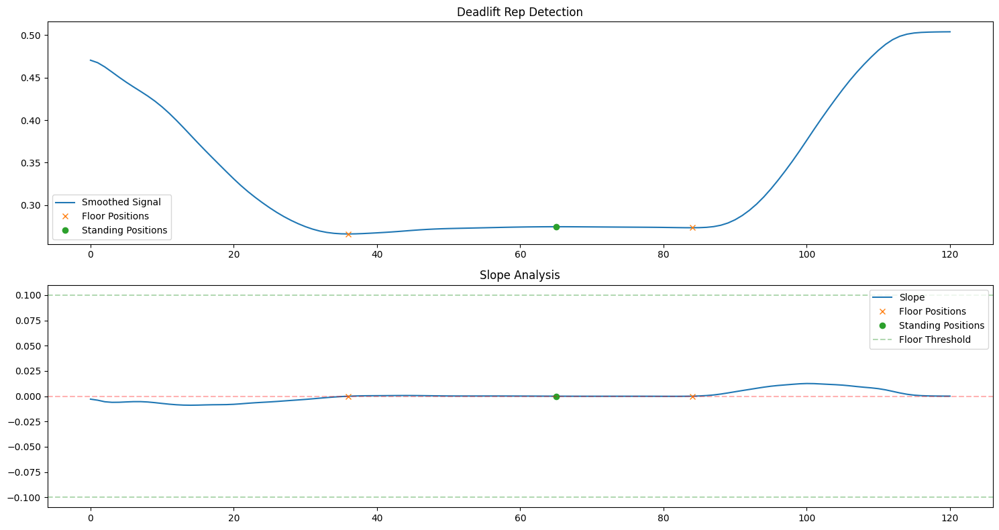

VISUALIZING REPS-----


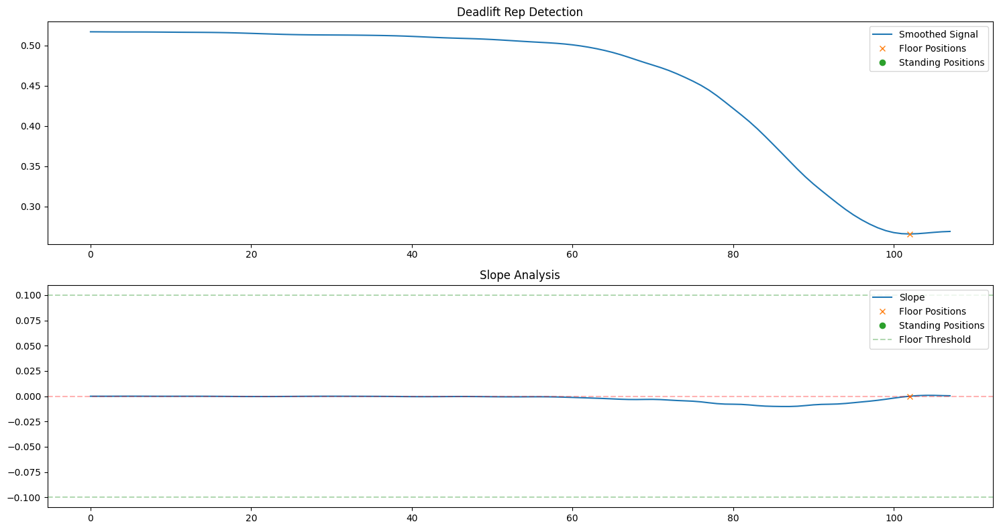

VISUALIZING REPS-----


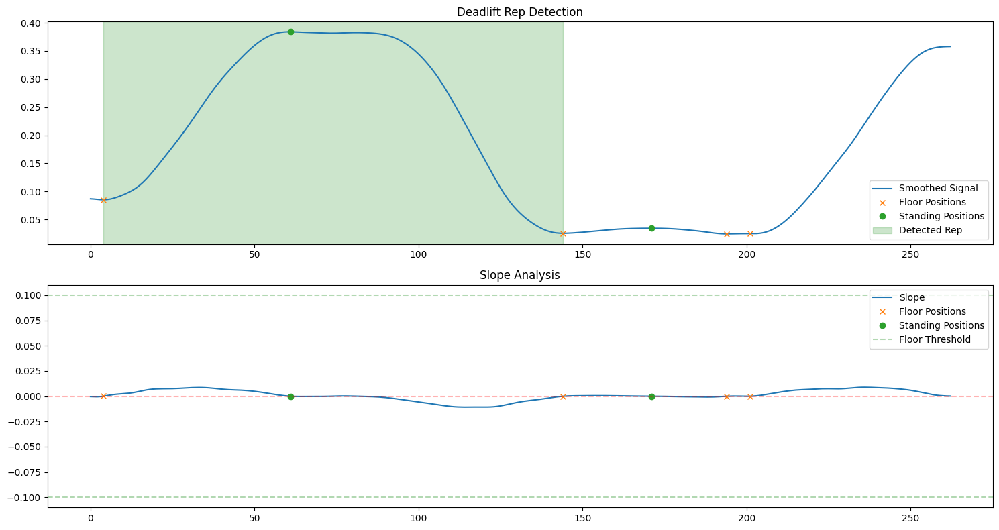

VISUALIZING REPS-----


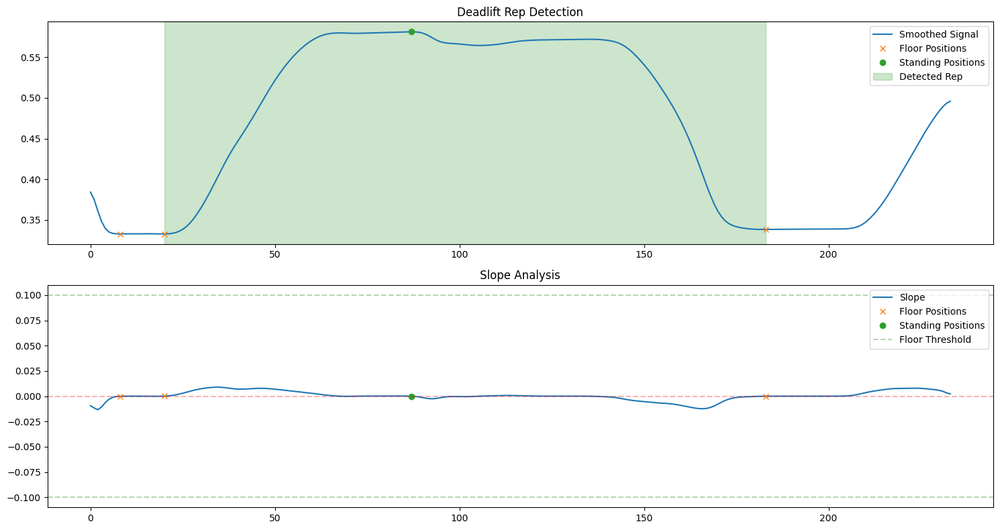

VISUALIZING REPS-----


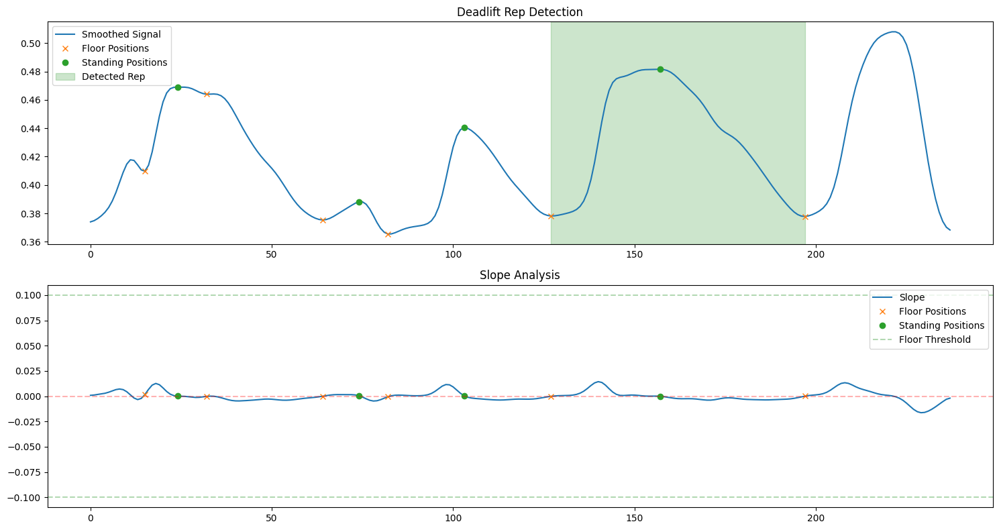

VISUALIZING REPS-----


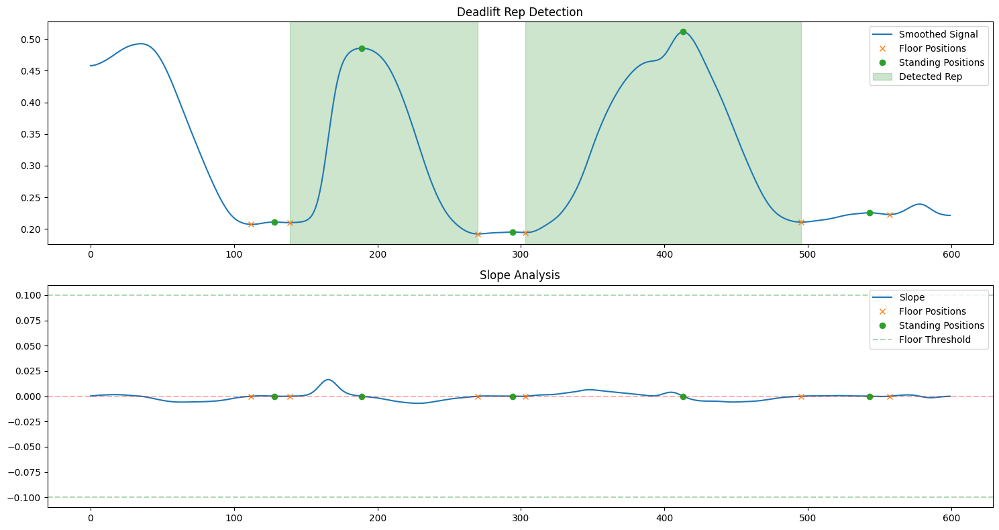

VISUALIZING REPS-----


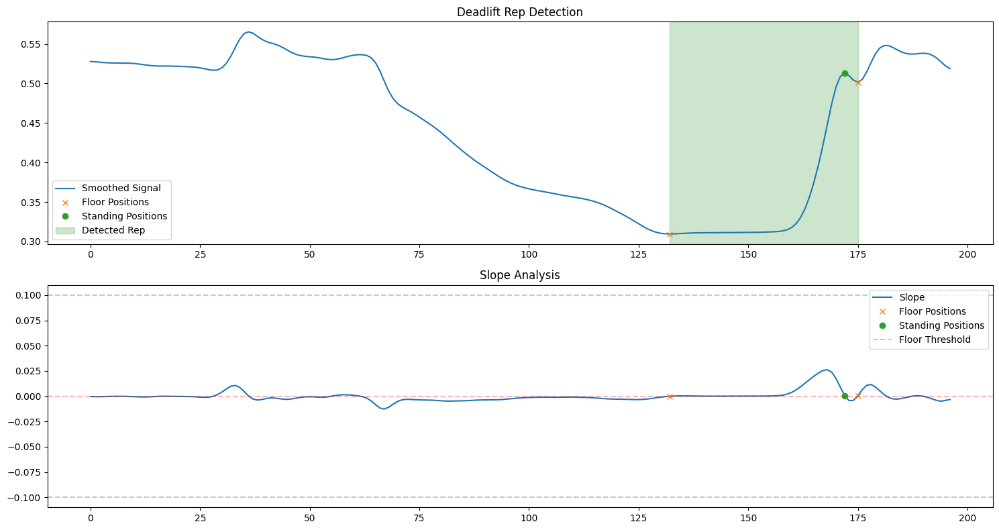

VISUALIZING REPS-----


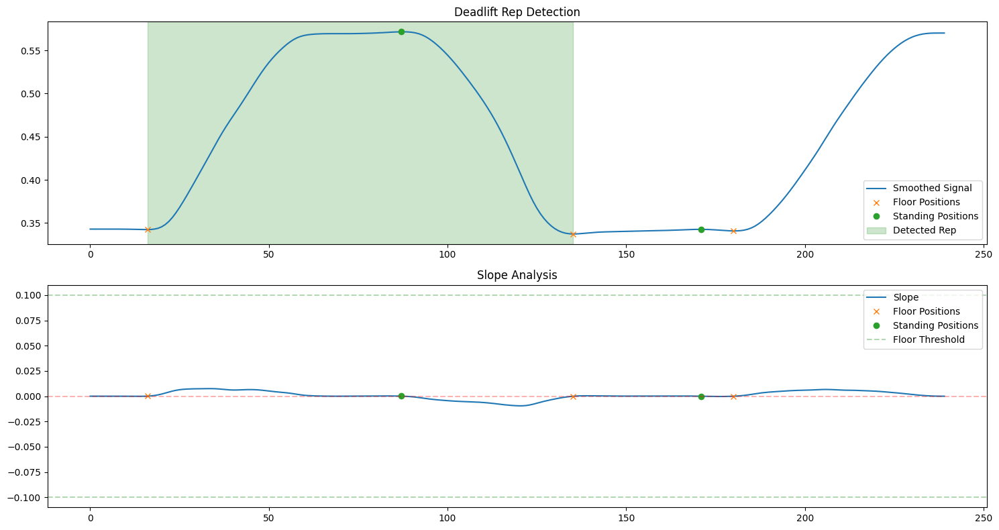

VISUALIZING REPS-----


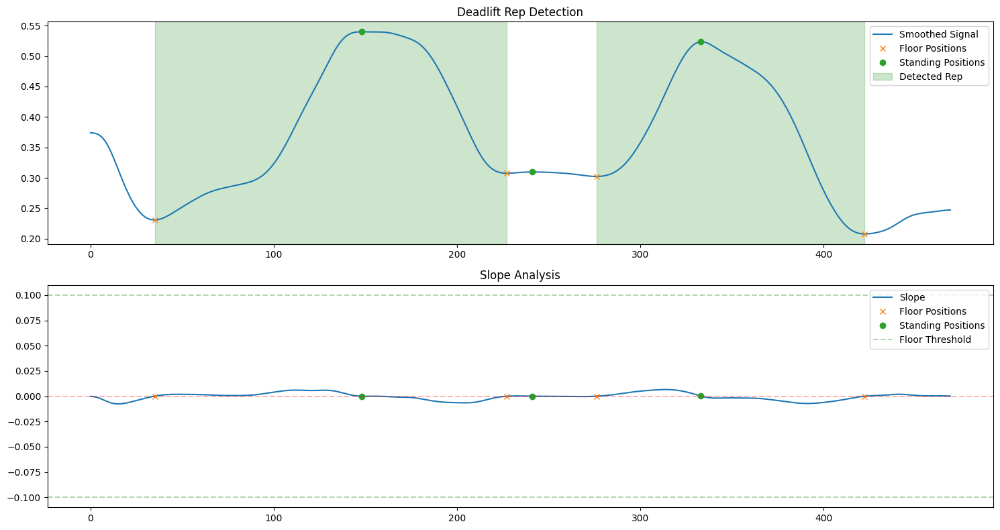

VISUALIZING REPS-----


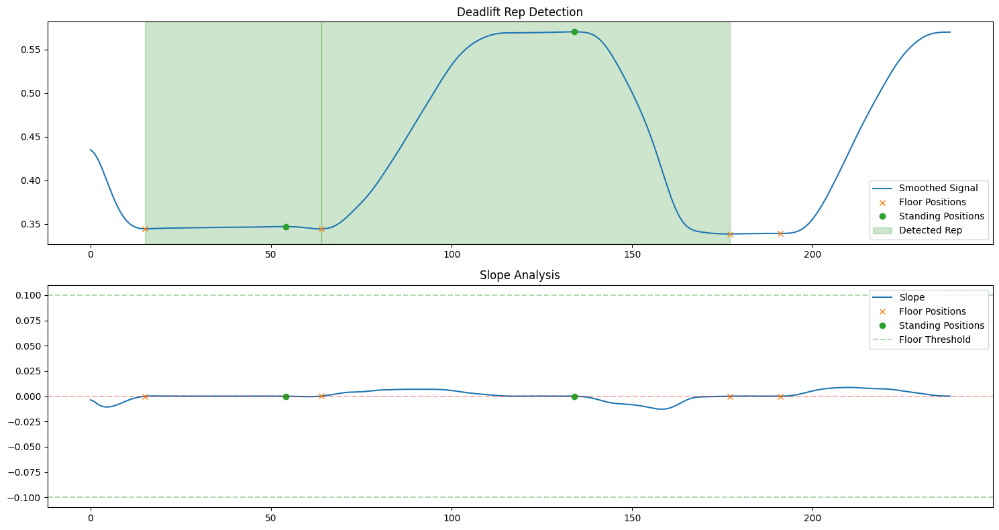

VISUALIZING REPS-----


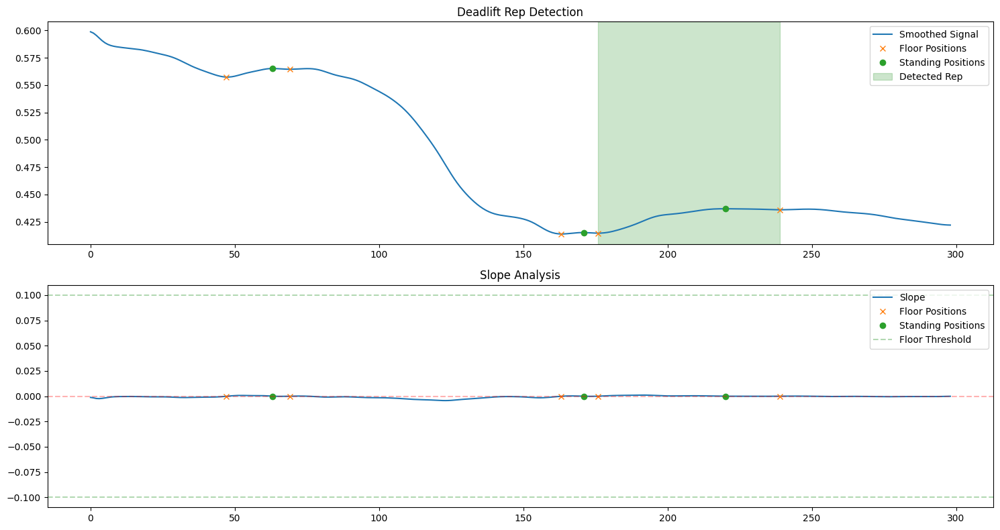

VISUALIZING REPS-----


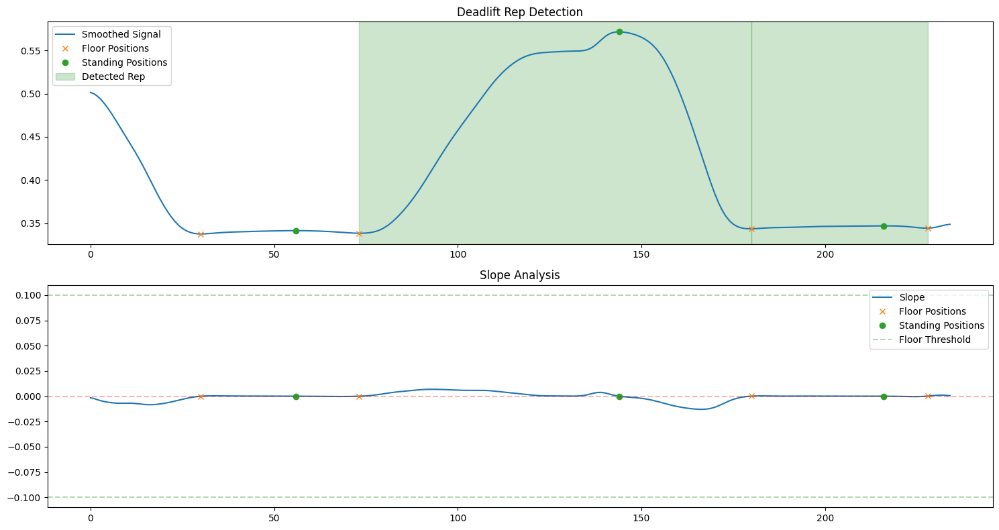

VISUALIZING REPS-----


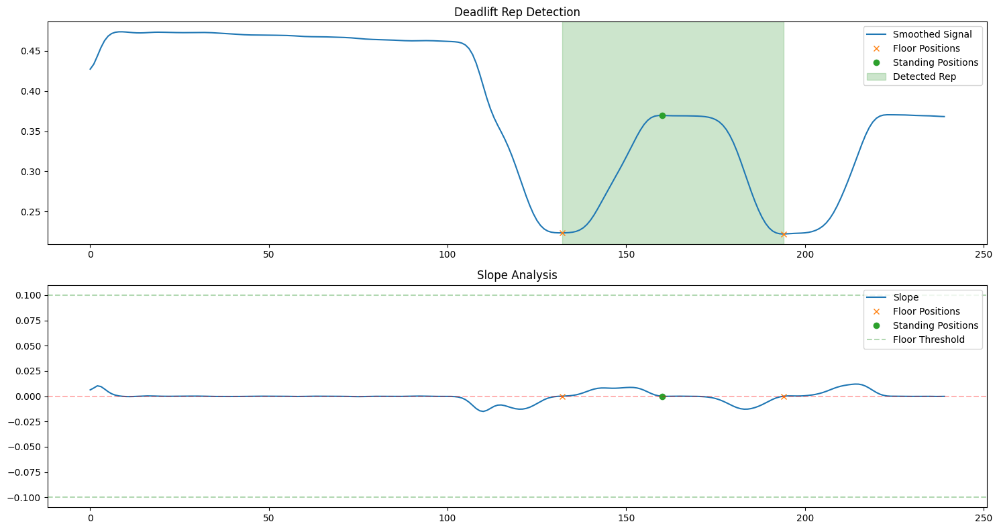

VISUALIZING REPS-----


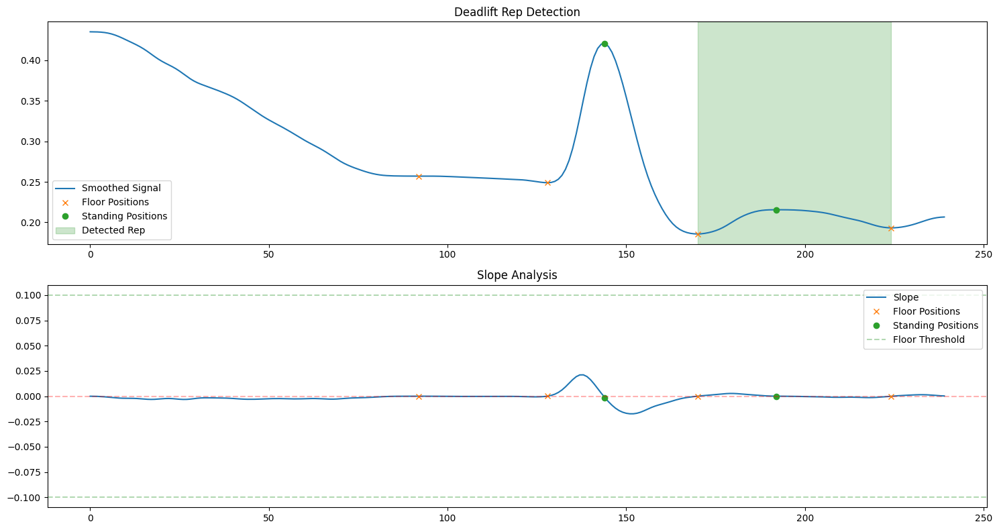

VISUALIZING REPS-----


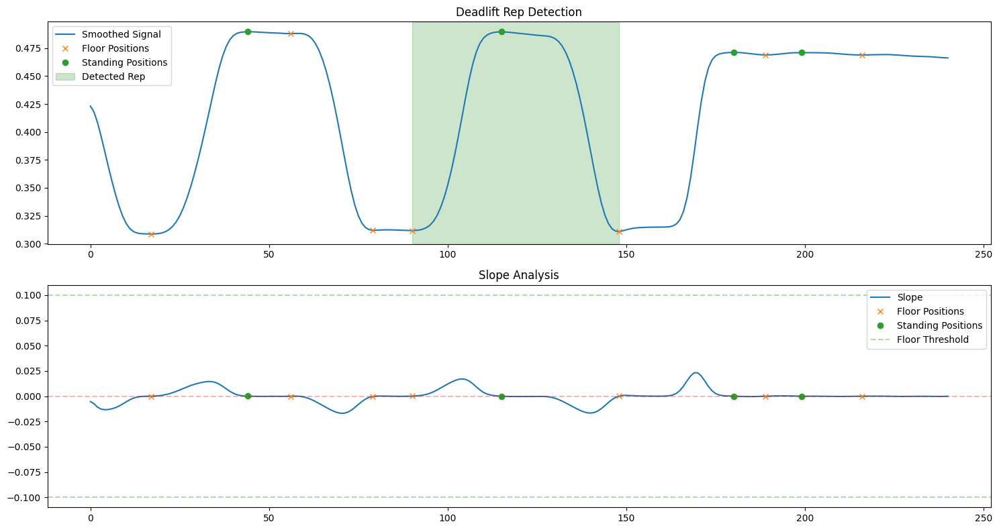

VISUALIZING REPS-----


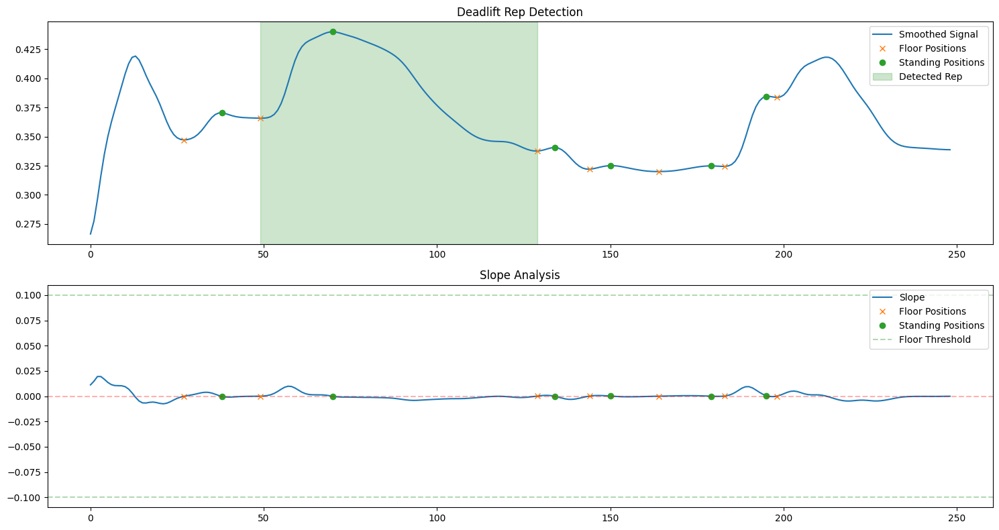

VISUALIZING REPS-----


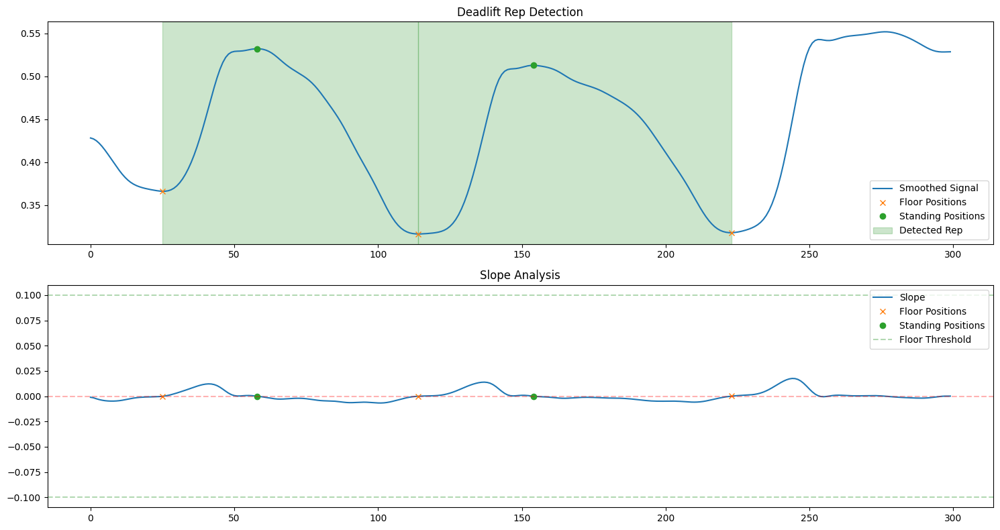

VISUALIZING REPS-----


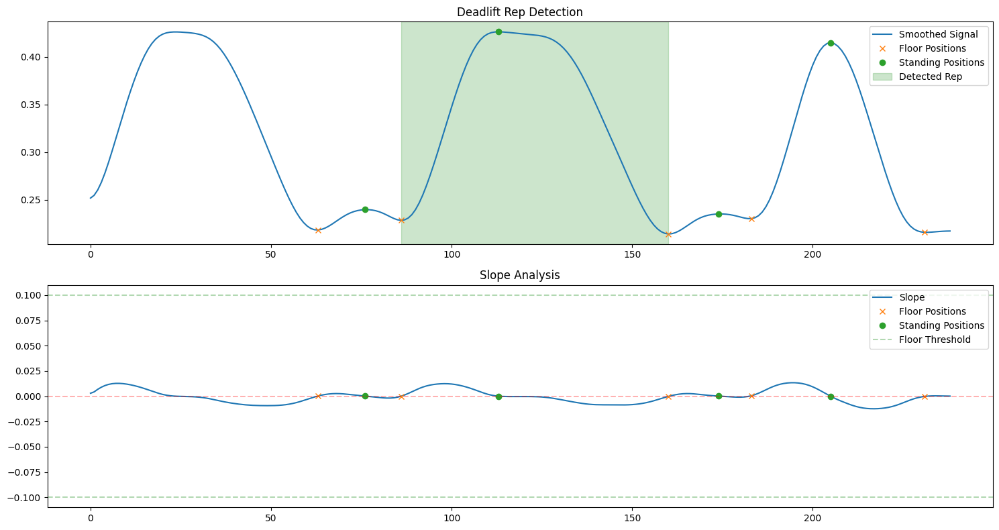

VISUALIZING REPS-----


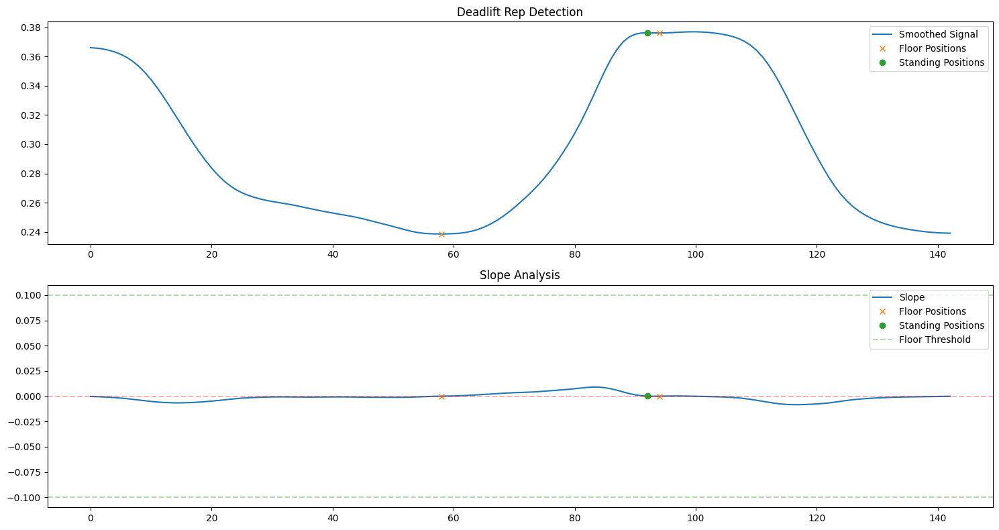

VISUALIZING REPS-----


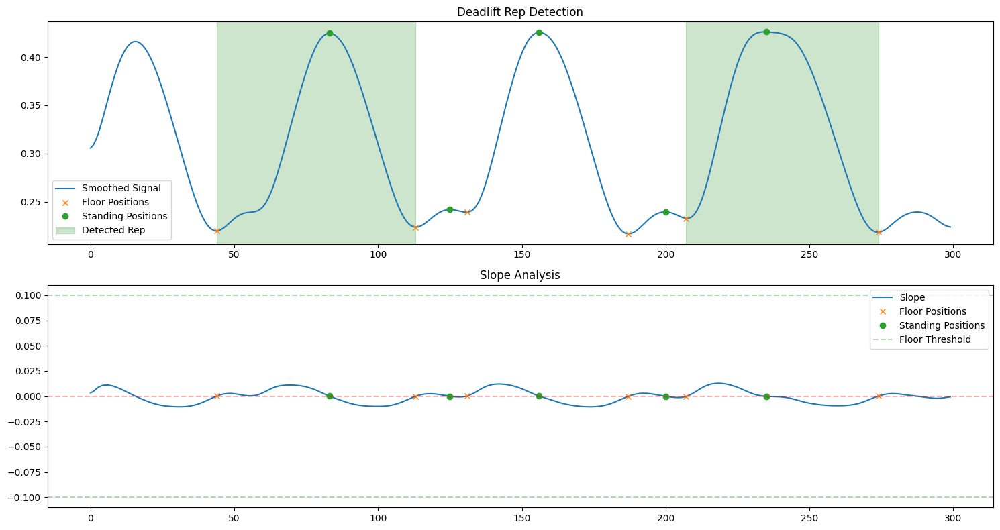

VISUALIZING REPS-----


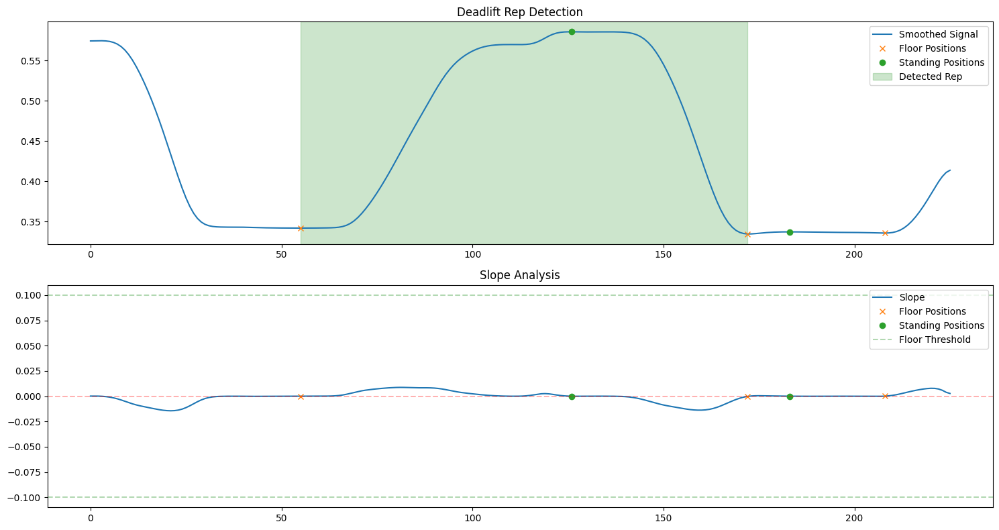

VISUALIZING REPS-----


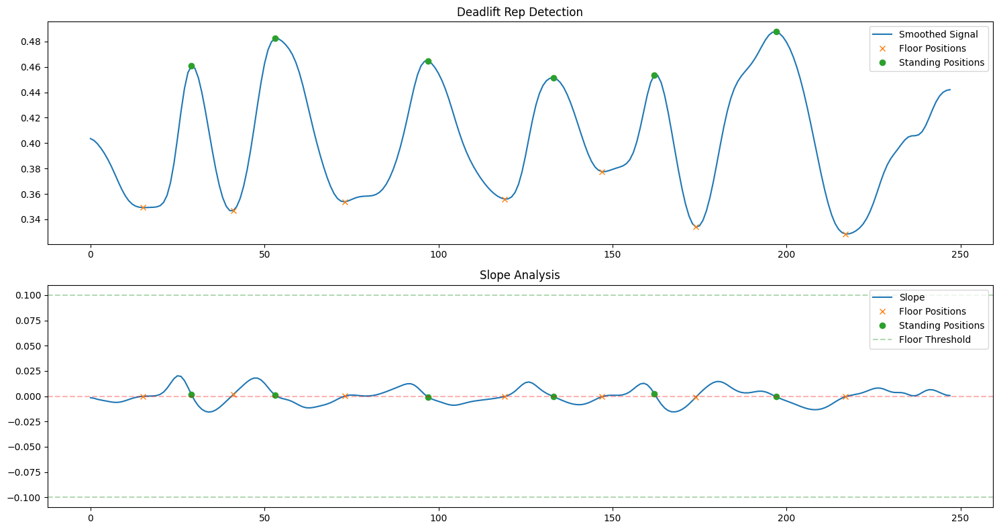

VISUALIZING REPS-----


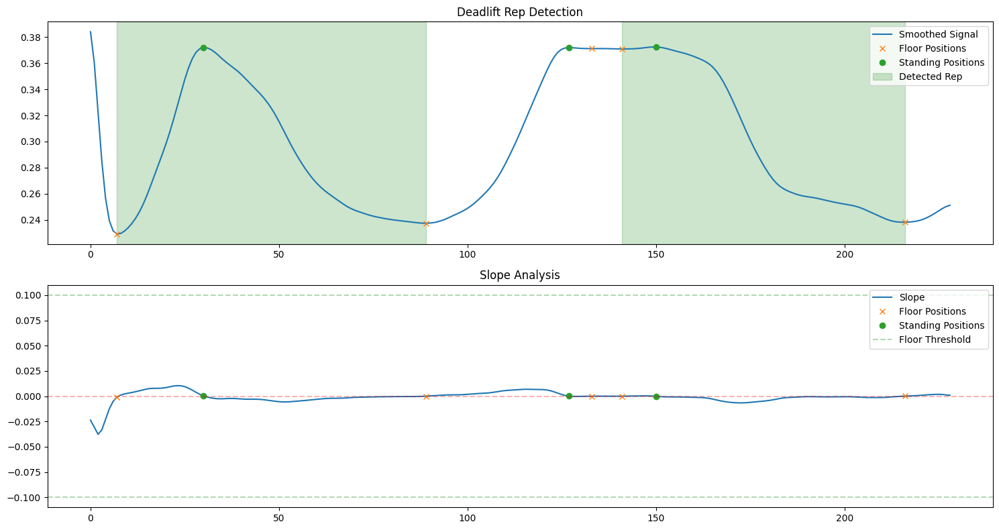

VISUALIZING REPS-----


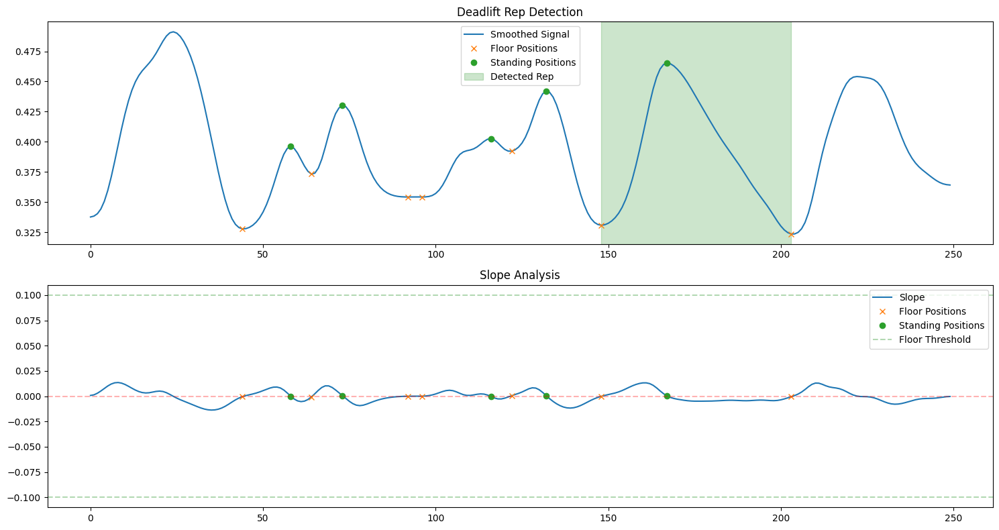

VISUALIZING REPS-----


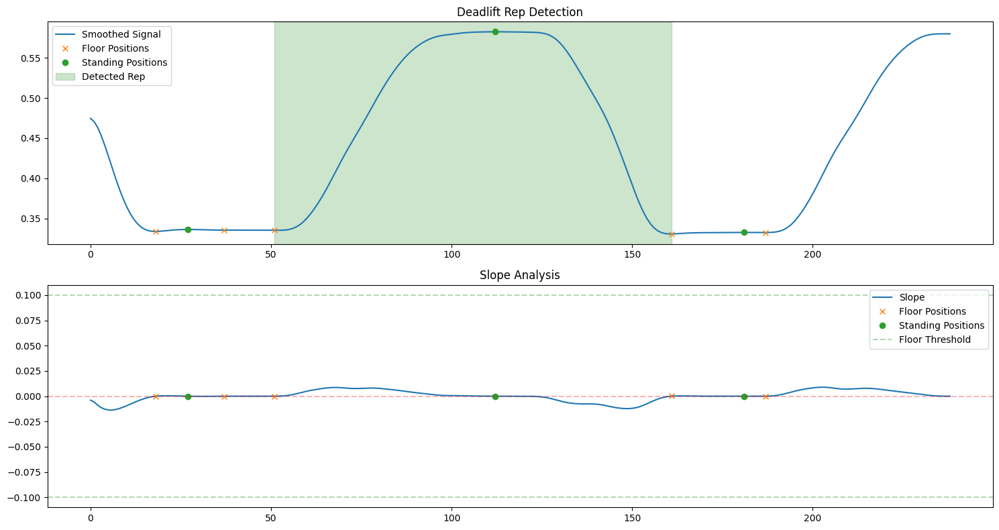

VISUALIZING REPS-----


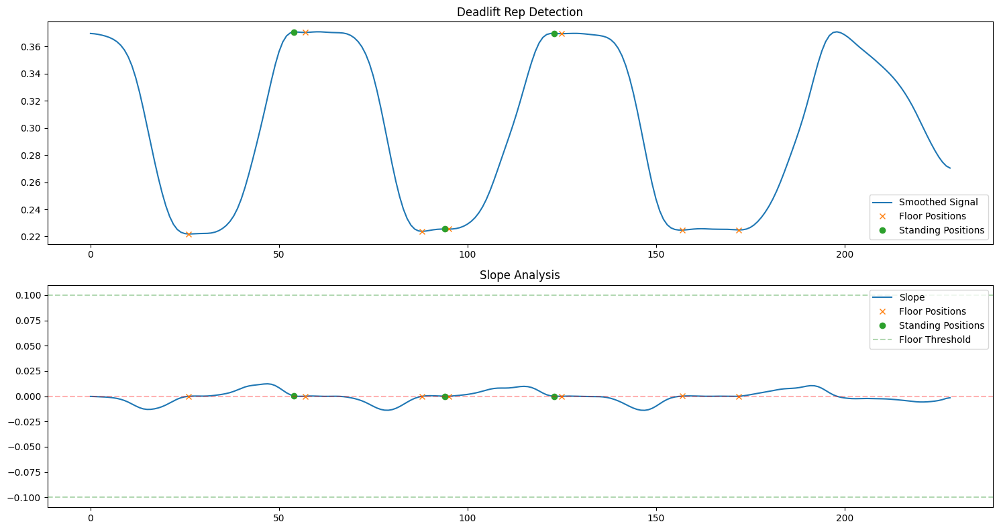

VISUALIZING REPS-----


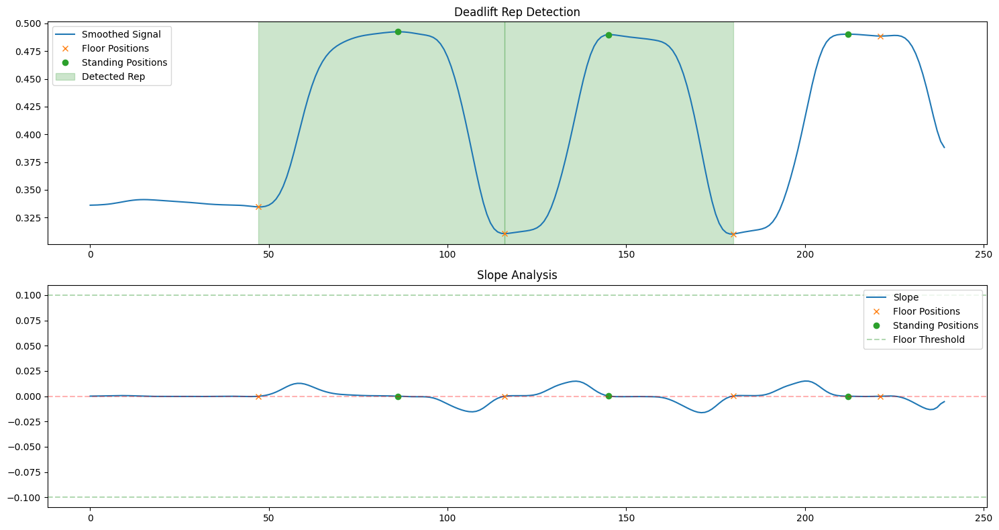

VISUALIZING REPS-----


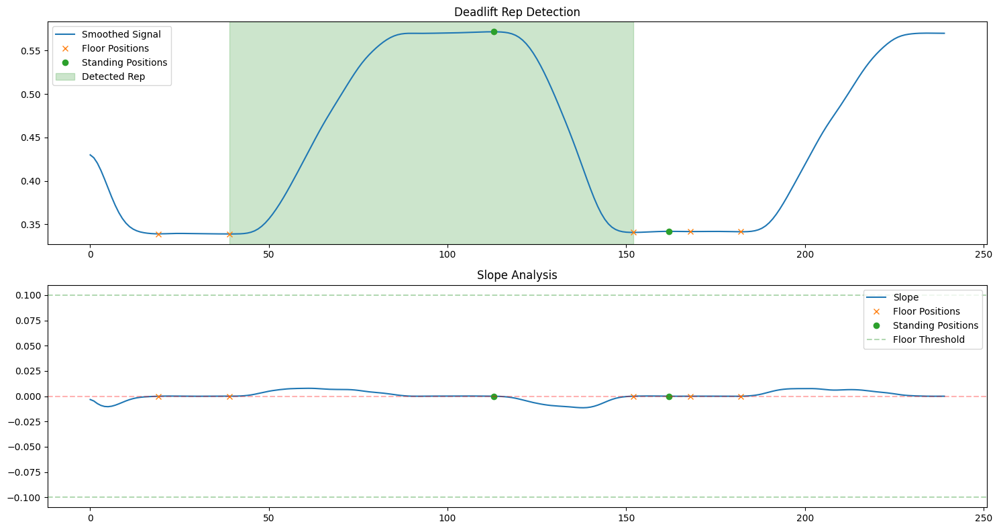

VISUALIZING REPS-----


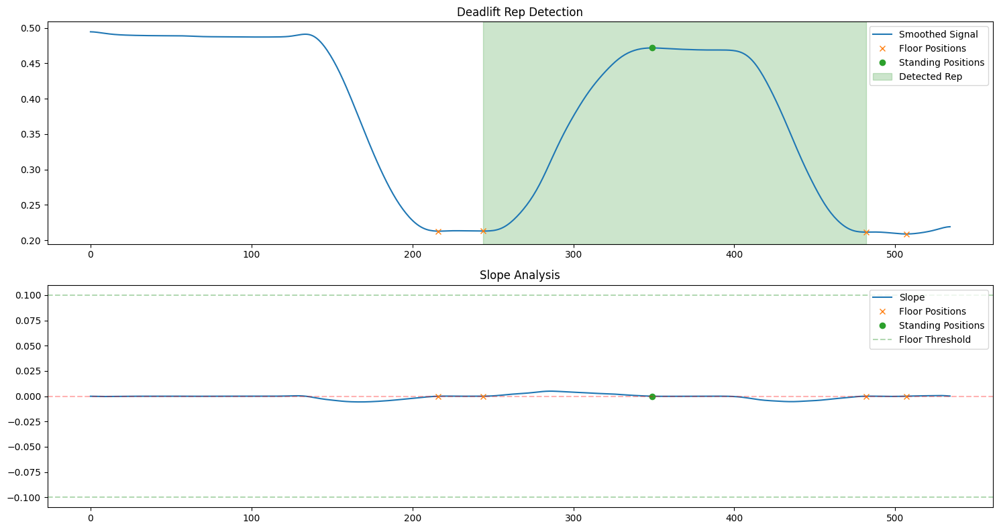

VISUALIZING REPS-----


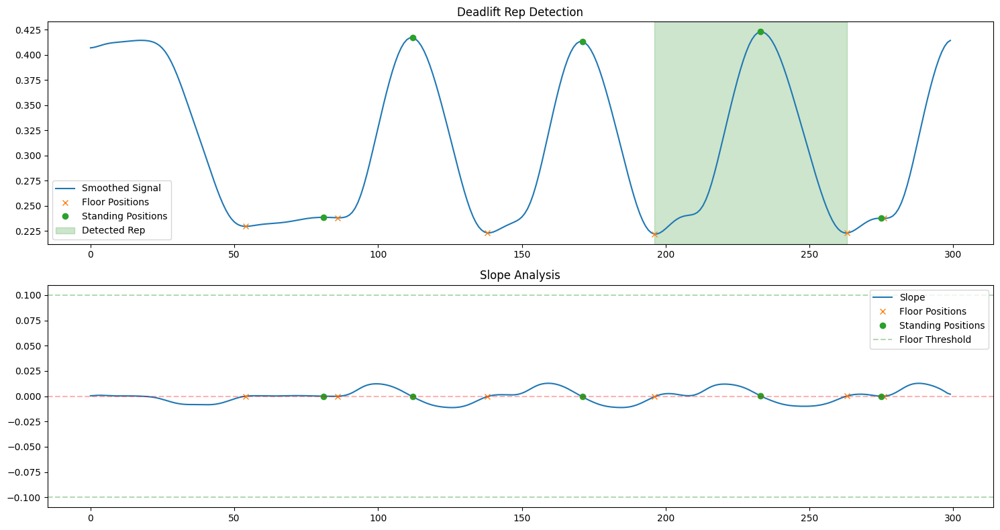

VISUALIZING REPS-----


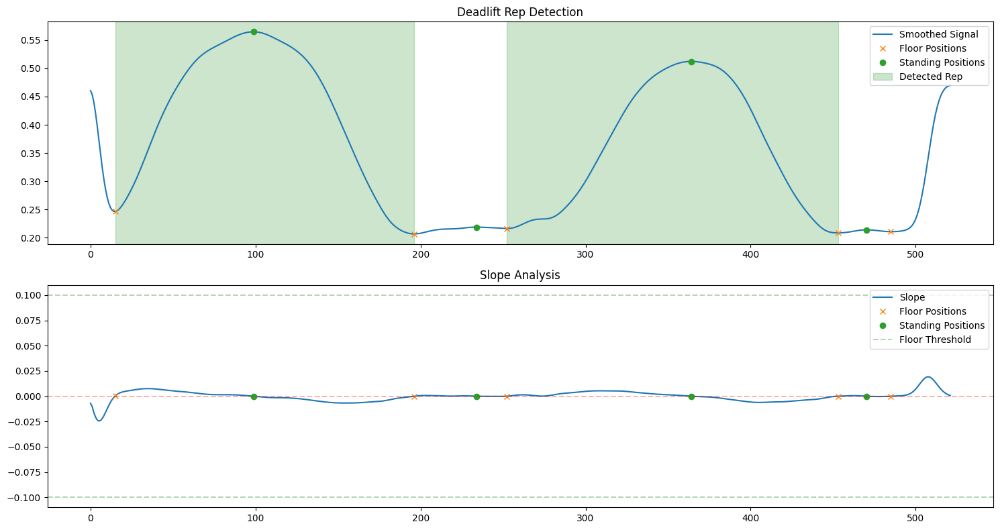

VISUALIZING REPS-----


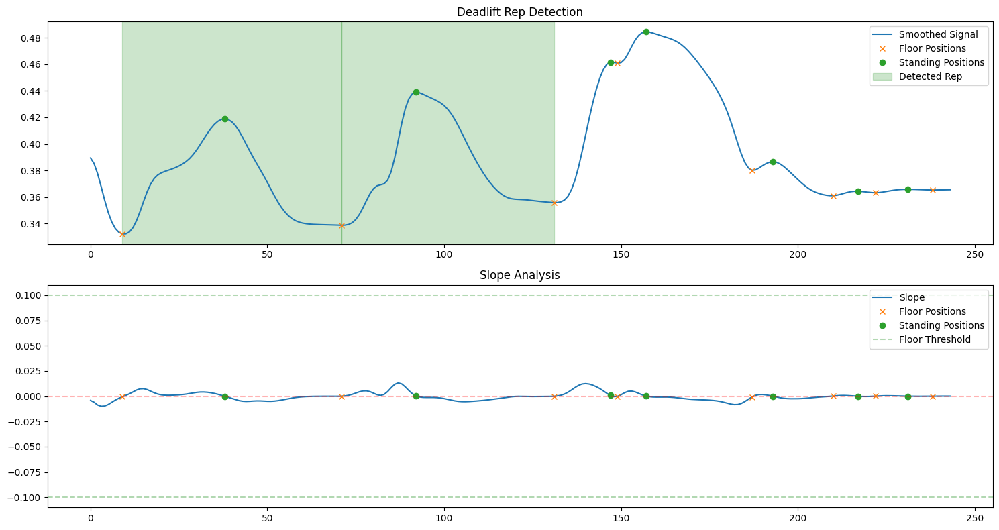

VISUALIZING REPS-----


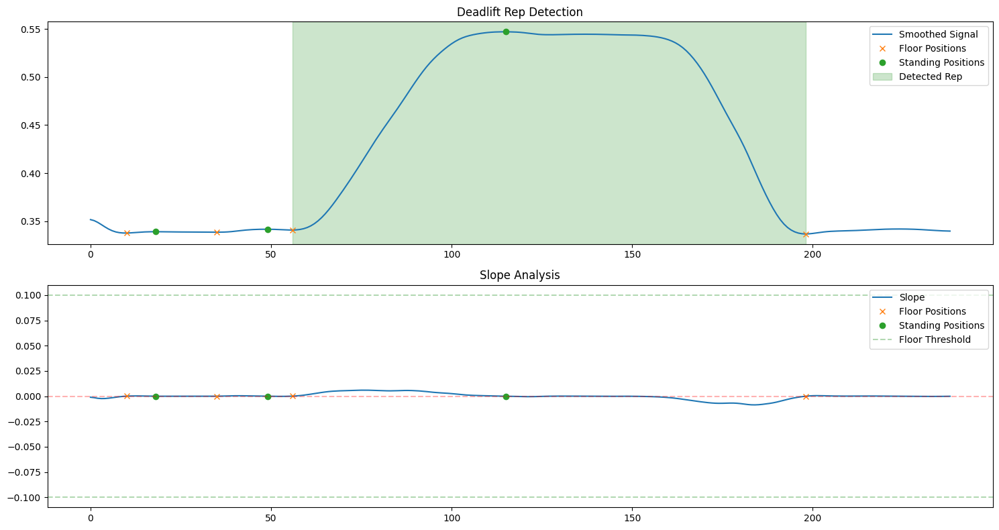

VISUALIZING REPS-----


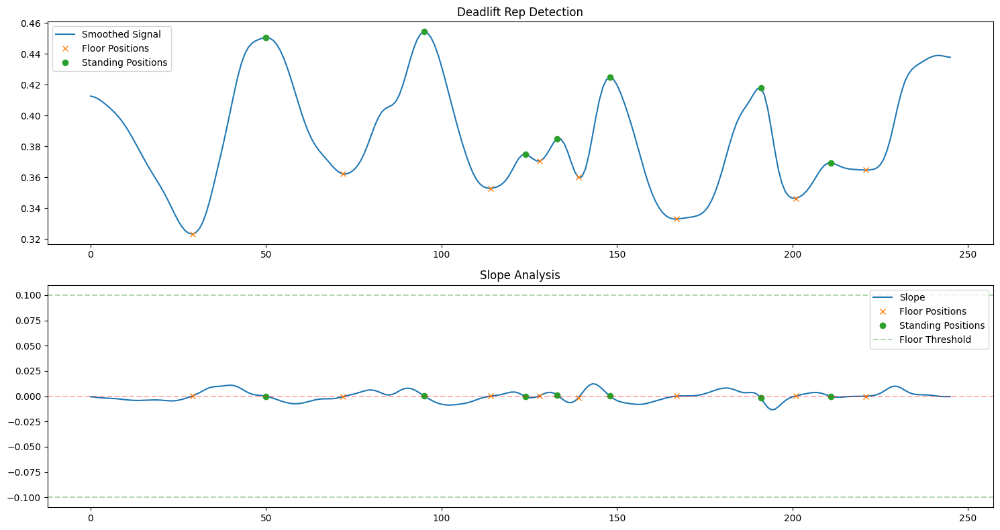

VISUALIZING REPS-----


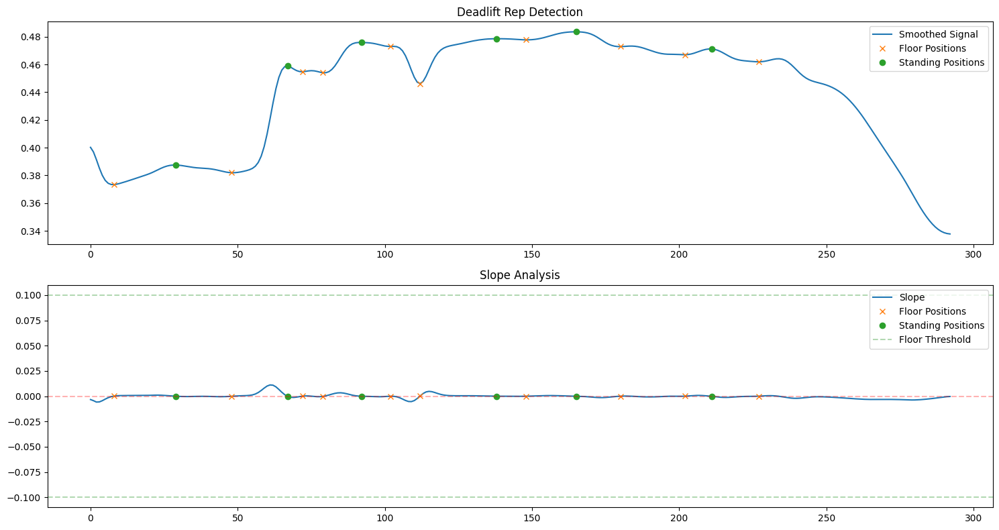

VISUALIZING REPS-----


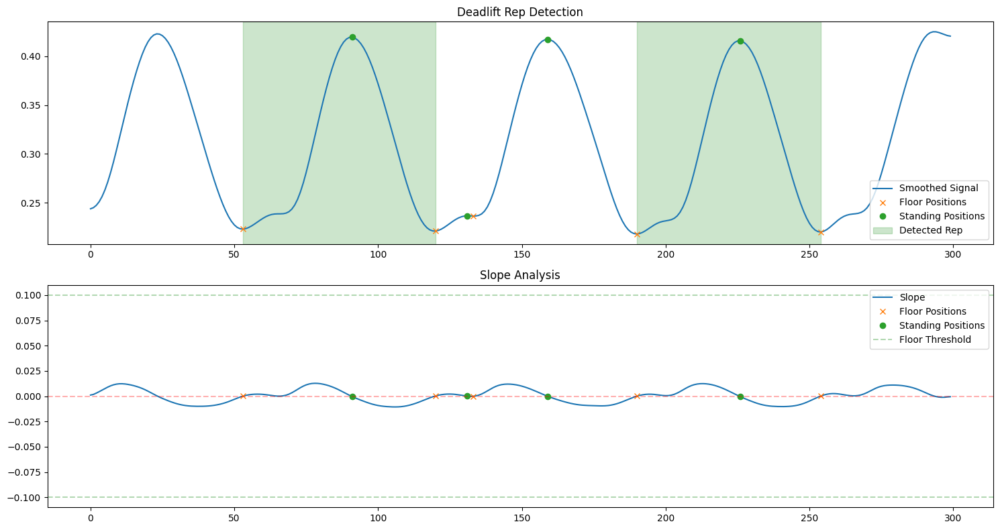

VISUALIZING REPS-----


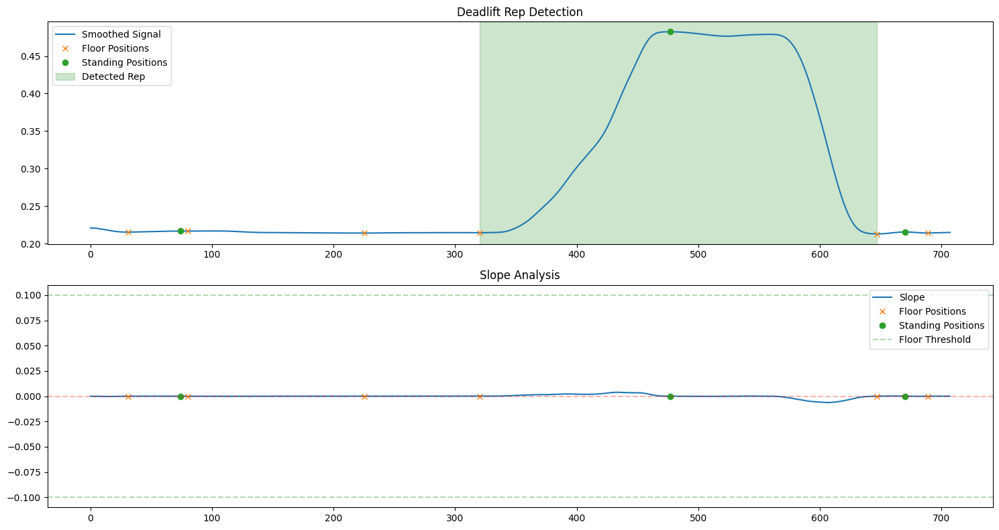

Epoch 1/50
Training Loss: 0.1297
Validation Loss: 0.1001
Epoch 2/50
Training Loss: 0.0920
Validation Loss: 0.0481
Epoch 3/50
Training Loss: 0.0278
Validation Loss: 0.0014
Epoch 4/50
Training Loss: 0.0019
Validation Loss: 0.0090
Epoch 5/50
Training Loss: 0.0064
Validation Loss: 0.0111
Epoch 6/50
Training Loss: 0.0084
Validation Loss: 0.0114
Epoch 7/50
Training Loss: 0.0075
Validation Loss: 0.0114
Epoch 8/50
Training Loss: 0.0077
Validation Loss: 0.0115
Epoch 9/50
Training Loss: 0.0087
Validation Loss: 0.0115
Epoch 10/50
Training Loss: 0.0082
Validation Loss: 0.0115
Epoch 11/50
Training Loss: 0.0080
Validation Loss: 0.0115
Epoch 12/50
Training Loss: 0.0096
Validation Loss: 0.0115
Epoch 13/50
Training Loss: 0.0078
Validation Loss: 0.0115
Epoch 14/50
Training Loss: 0.0074
Validation Loss: 0.0115
Epoch 15/50
Training Loss: 0.0082
Validation Loss: 0.0115
Epoch 16/50
Training Loss: 0.0082
Validation Loss: 0.0115
Epoch 17/50
Training Loss: 0.0077
Validation Loss: 0.0115
Epoch 18/50
Training Lo

In [ ]:
trainer = DeadliftFormTrainer(processor)
# For training the scoring model
reference_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/reference"
training_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/training"
dataset = trainer.prepare_dataset(reference_dir,training_dir)





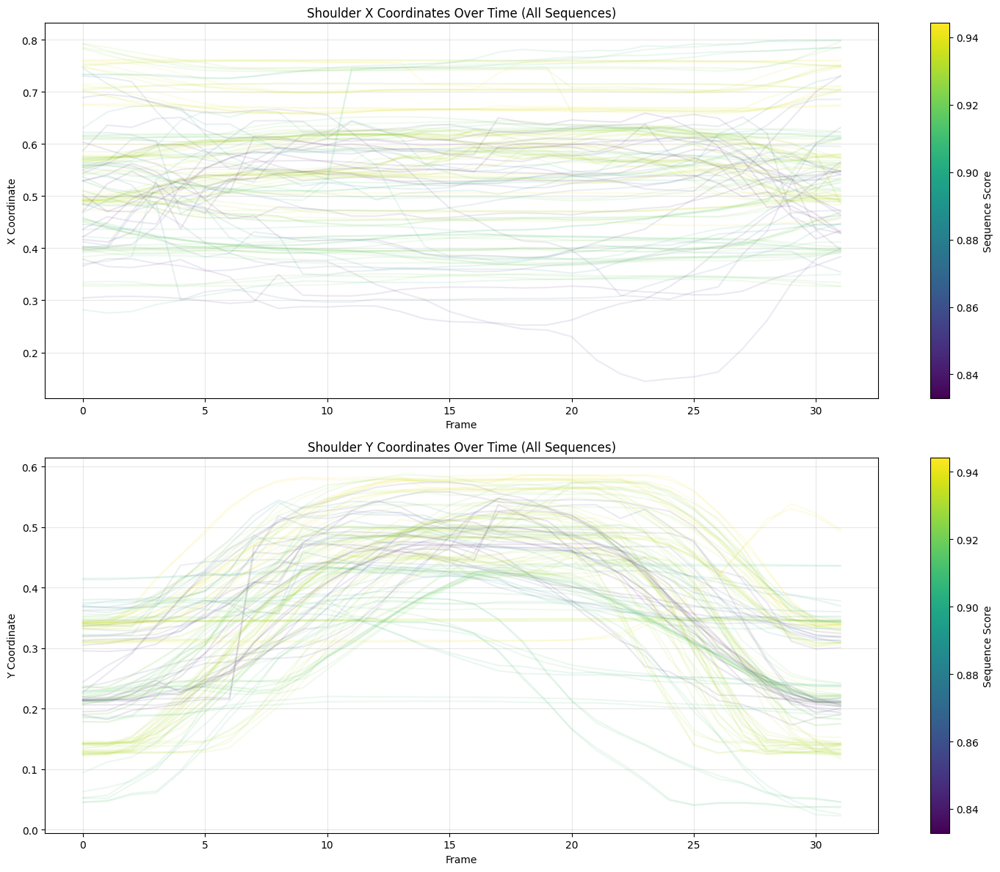

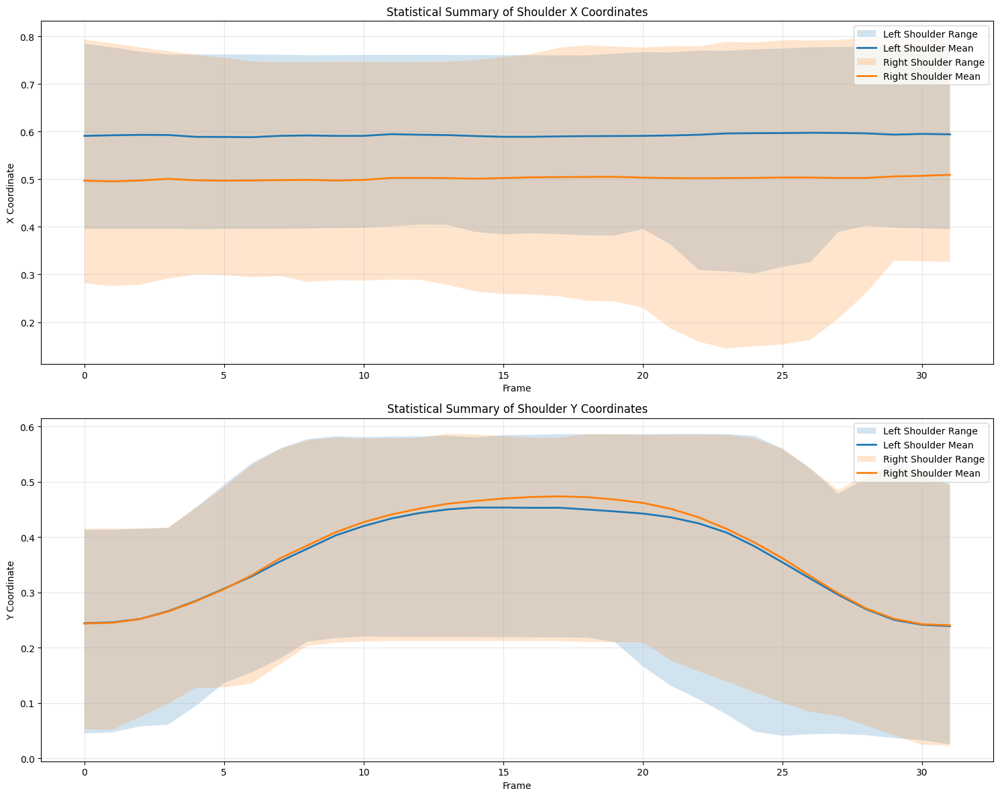

In [ ]:
class ShoulderVisualizer:
    def __init__(self, dataset: DeadliftDataset):
        self.dataset = dataset
        # Indices for left and right shoulders (x,y,z for each)
        self.left_shoulder_idx = 0  # 0,1,2 for x,y,z
        self.right_shoulder_idx = 1  # 3,4,5 for x,y,z

    def plot_all_shoulder_trajectories(self):
        """Plot shoulder trajectories for all sequences with their scores"""
        n_sequences = len(self.dataset.sequences)
        scores = np.array(self.dataset.scores)

        # Create figure with subplots for x and y coordinates
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

        # Color map based on scores
        norm = plt.Normalize(min(scores), max(scores))
        cmap = plt.cm.viridis

        # Plot X coordinates
        ax1.set_title('Shoulder X Coordinates Over Time (All Sequences)')
        for i in range(n_sequences):
            sequence = self.dataset.sequences[i]
            landmarks = sequence['landmarks']
            color = cmap(norm(scores[i]))

            # Plot left and right shoulder X coordinates
            left_x = landmarks[:, self.left_shoulder_idx * 3]
            right_x = landmarks[:, self.right_shoulder_idx * 3]

            # Plot with low alpha for individual sequences
            ax1.plot(left_x, color=color, alpha=0.1, label='_nolegend_')
            ax1.plot(right_x, color=color, alpha=0.1, label='_nolegend_')

        # Add colorbar for scores
        sm1 = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        plt.colorbar(sm1, ax=ax1, label='Sequence Score')
        ax1.set_xlabel('Frame')
        ax1.set_ylabel('X Coordinate')
        ax1.grid(True, alpha=0.3)

        # Plot Y coordinates
        ax2.set_title('Shoulder Y Coordinates Over Time (All Sequences)')
        for i in range(n_sequences):
            sequence = self.dataset.sequences[i]
            landmarks = sequence['landmarks']
            color = cmap(norm(scores[i]))

            # Plot left and right shoulder Y coordinates
            left_y = landmarks[:, self.left_shoulder_idx * 3 + 1]
            right_y = landmarks[:, self.right_shoulder_idx * 3 + 1]

            # Plot with low alpha for individual sequences
            ax2.plot(left_y, color=color, alpha=0.1, label='_nolegend_')
            ax2.plot(right_y, color=color, alpha=0.1, label='_nolegend_')

        # Add colorbar for scores
        sm2 = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        plt.colorbar(sm2, ax=ax2, label='Sequence Score')
        ax2.set_xlabel('Frame')
        ax2.set_ylabel('Y Coordinate')
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

    def plot_shoulder_statistics(self):
        """Plot statistical summary of shoulder movements"""
        n_sequences = len(self.dataset.sequences)
        n_frames = self.dataset.sequences[0]['landmarks'].shape[0]

        # Initialize arrays for statistics
        left_x_stats = np.zeros((n_frames, 3))  # mean, min, max
        right_x_stats = np.zeros((n_frames, 3))
        left_y_stats = np.zeros((n_frames, 3))
        right_y_stats = np.zeros((n_frames, 3))

        # Collect data for each frame
        for frame in range(n_frames):
            # Left shoulder
            left_x_values = [self.dataset.sequences[i]['landmarks'][frame, self.left_shoulder_idx * 3]
                           for i in range(n_sequences)]
            left_y_values = [self.dataset.sequences[i]['landmarks'][frame, self.left_shoulder_idx * 3 + 1]
                           for i in range(n_sequences)]

            # Right shoulder
            right_x_values = [self.dataset.sequences[i]['landmarks'][frame, self.right_shoulder_idx * 3]
                            for i in range(n_sequences)]
            right_y_values = [self.dataset.sequences[i]['landmarks'][frame, self.right_shoulder_idx * 3 + 1]
                            for i in range(n_sequences)]

            # Calculate statistics
            for values, stats in [(left_x_values, left_x_stats),
                                (right_x_values, right_x_stats),
                                (left_y_values, left_y_stats),
                                (right_y_values, right_y_stats)]:
                stats[frame] = [np.mean(values), np.min(values), np.max(values)]

        # Plot statistics
        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

        # X coordinates
        ax1.set_title('Statistical Summary of Shoulder X Coordinates')
        ax1.fill_between(range(n_frames), left_x_stats[:, 1], left_x_stats[:, 2],
                        alpha=0.2, label='Left Shoulder Range')
        ax1.plot(left_x_stats[:, 0], label='Left Shoulder Mean', linewidth=2)
        ax1.fill_between(range(n_frames), right_x_stats[:, 1], right_x_stats[:, 2],
                        alpha=0.2, label='Right Shoulder Range')
        ax1.plot(right_x_stats[:, 0], label='Right Shoulder Mean', linewidth=2)
        ax1.set_xlabel('Frame')
        ax1.set_ylabel('X Coordinate')
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Y coordinates
        ax2.set_title('Statistical Summary of Shoulder Y Coordinates')
        ax2.fill_between(range(n_frames), left_y_stats[:, 1], left_y_stats[:, 2],
                        alpha=0.2, label='Left Shoulder Range')
        ax2.plot(left_y_stats[:, 0], label='Left Shoulder Mean', linewidth=2)
        ax2.fill_between(range(n_frames), right_y_stats[:, 1], right_y_stats[:, 2],
                        alpha=0.2, label='Right Shoulder Range')
        ax2.plot(right_y_stats[:, 0], label='Right Shoulder Mean', linewidth=2)
        ax2.set_xlabel('Frame')
        ax2.set_ylabel('Y Coordinate')
        ax2.legend()
        ax2.grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

# Usage example
visualizer = ShoulderVisualizer(dataset)

# Plot all sequences with color-coded scores
visualizer.plot_all_shoulder_trajectories()

# Plot statistical summary
visualizer.plot_shoulder_statistics()

In [ ]:
trainer.train(dataset)

VISUALIZING REPS-----


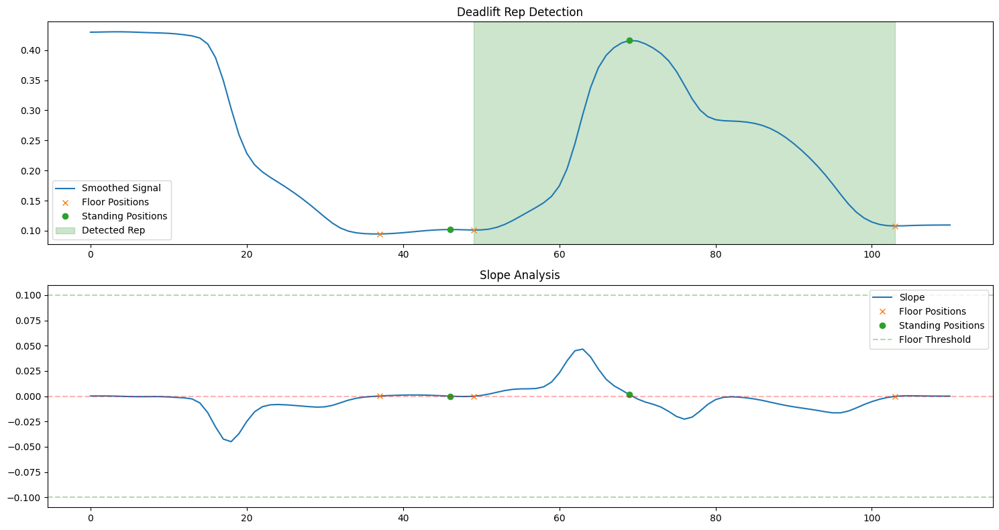

In [ ]:
test_dir="/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/test/test_03.mp4"
predictions = trainer.predict(test_dir)


Displaying Rep 1
Average Score: 0.999


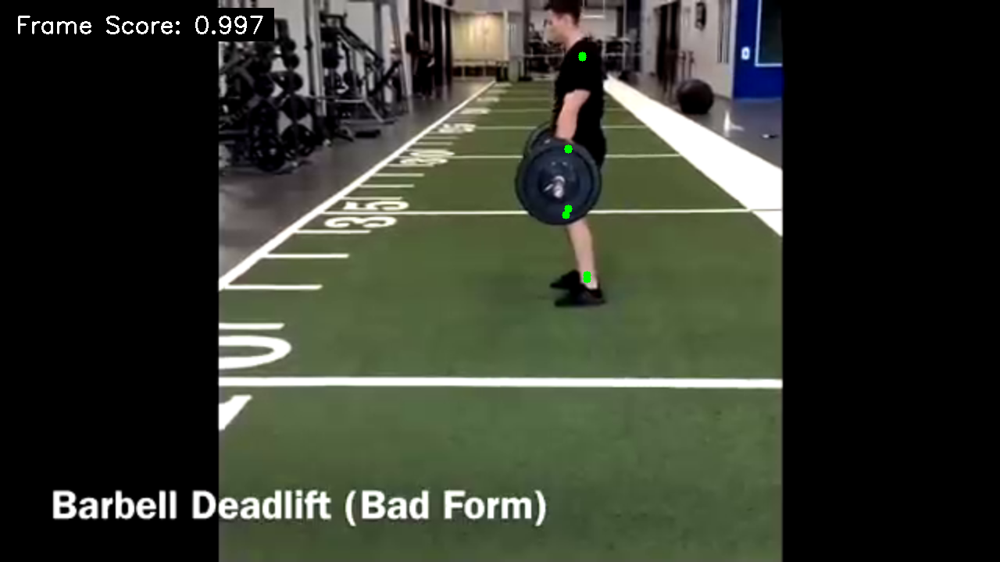

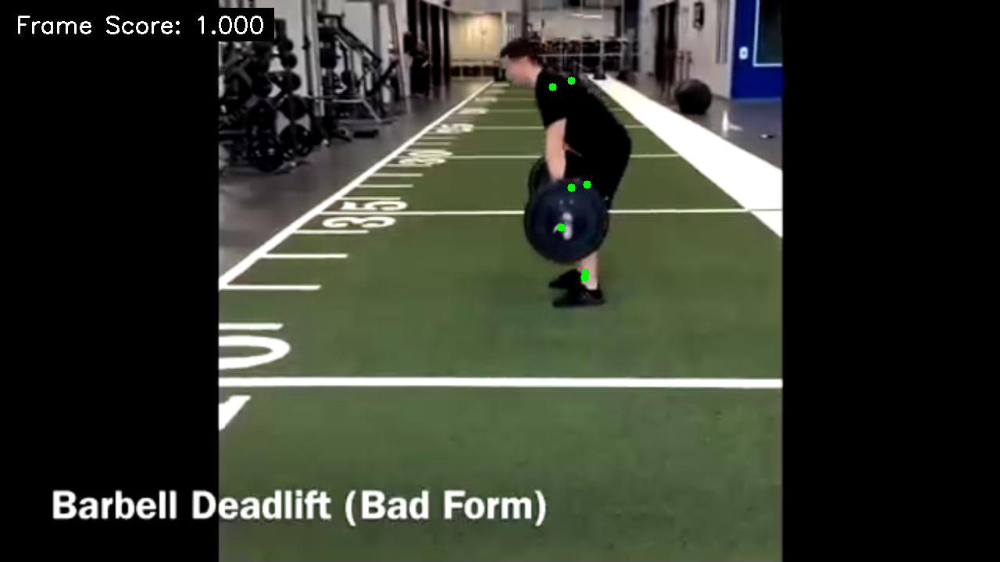

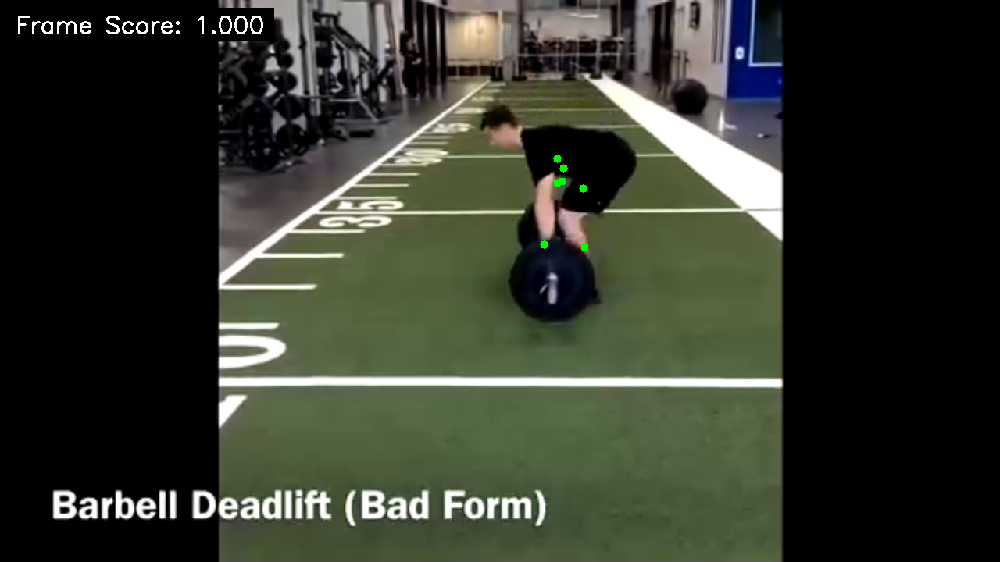

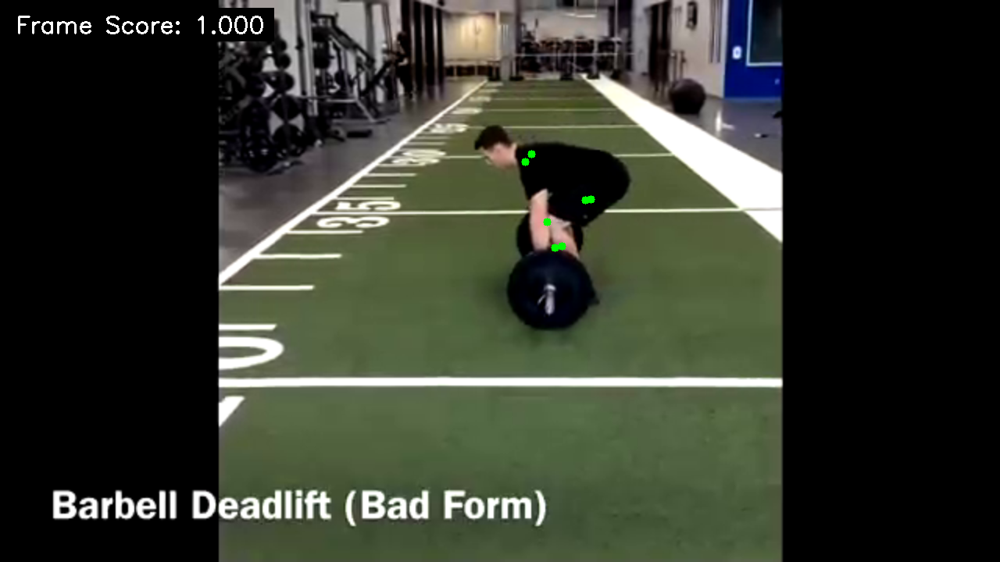

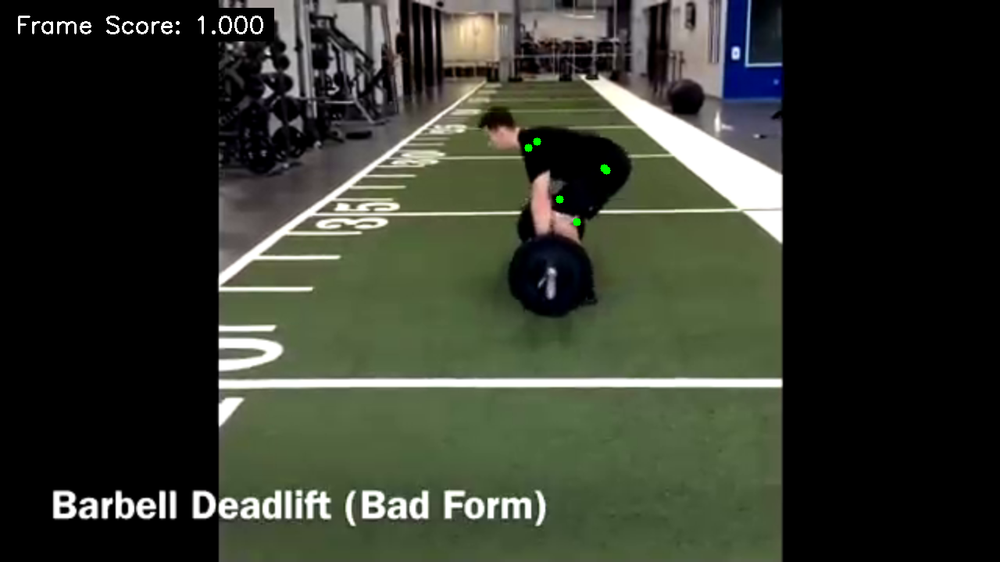

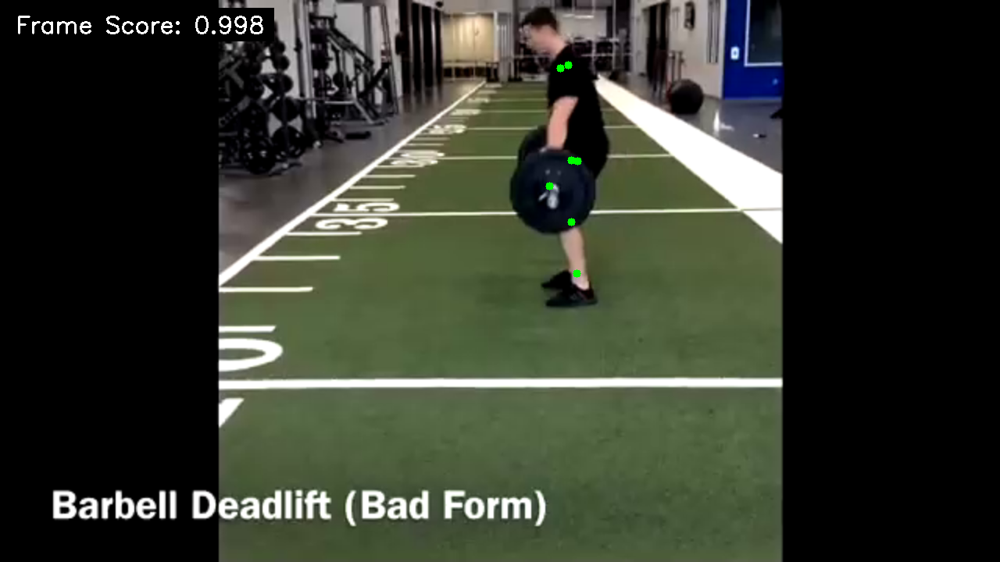

In [ ]:
# Display visualization for each rep
for rep_idx, vis_frames in enumerate(predictions['rep_visualizations']):
    print(f"\nDisplaying Rep {rep_idx + 1}")
    print(f"Average Score: {np.mean(predictions['rep_scores'][rep_idx]):.3f}")

    # Show every 10th frame
    for i in range(0, len(vis_frames), 10):
        cv2_imshow(vis_frames[i])
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

## Load Model From PTH File

In [ ]:
!pip install opencv-python numpy matplotlib mediapipe google-colab fastdtw scipy

In [ ]:
import cv2
import numpy as np
import mediapipe as mp
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from scipy.signal import find_peaks
from fastdtw import fastdtw
from scipy.spatial.distance import cosine
from dataclasses import dataclass
from typing import List, Tuple, Optional, Dict
from pathlib import Path
import matplotlib.pyplot as plt

In [ ]:
processor = DeadliftProcessor()
trainer = DeadliftFormTrainer(processor)
# Load the saved model
input_size = 24  # Number of landmarks * 3 (x,y,z) for 8 keypoints
trainer.model = DeadliftScorer(input_size).to(trainer.device)
trainer.model.load_state_dict(torch.load('best_model.pth'))
trainer.model.eval()  # Set to evaluation mode

# Now you can use the loaded model to make predictions
test_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/test/test_02.mp4"
predictions = trainer.predict(test_dir)
print(f"Overall form score: {predictions['overall_score']:.3f}")

# Display visualization for each rep
for rep_idx, vis_frames in enumerate(predictions['rep_visualizations']):
    print(f"\nDisplaying Rep {rep_idx + 1}")
    print(f"Average Score: {np.mean(predictions['rep_scores'][rep_idx]):.3f}")

    # Show every 10th frame
    for i in range(0, len(vis_frames), 10):
        cv2_imshow(vis_frames[i])
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break

In [ ]:
print(f"Sequences : {predictions['rep_sequences']}")
print(f"Scores : {predictions['rep_scores']}")

In [ ]:
reference_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/reference/deadlift_1.mp4"
user_dir = "/content/drive/MyDrive/AI in Healthcare/Final Project/data/videos/user/deadlift_incorrect_01.mp4"

# For single rep comparison
results = processor.analyze_single_rep(reference_dir, user_dir)
print(f"Overall similarity: {results['overall_similarity']:.3f}")

In [ ]:
# Display visualization
for frame in results['visualizations']:
    cv2_imshow(frame)
    if cv2.waitKey(30) & 0xFF == ord('q'):
        break

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
file_path = 'epoch_data.csv'  # Replace with the correct path if needed
df = pd.read_csv(file_path)

# Plot Training Loss and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(df['Epoch'], df['Training Loss'], label='Training Loss', marker='o')
plt.plot(df['Epoch'], df['Validation Loss'], label='Validation Loss', marker='s')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Plot Learning Rate
plt.figure(figsize=(10, 6))
plt.plot(df['Epoch'], df['Learning Rate'], label='Learning Rate', marker='^', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

